This script performs the analysis of the proteomics data at 4 h.

In [1]:
import pandas, numpy, seaborn, matplotlib_venn

In [2]:
import sklearn, sklearn.preprocessing, sklearn.decomposition
import scipy, scipy.signal
import statsmodels, statsmodels.stats, statsmodels.stats.multitest

In [3]:
import matplotlib, matplotlib.pyplot
matplotlib.rcParams.update({'font.family':'sans-serif',
                            'font.size':20, 
                            'xtick.labelsize':30, 
                            'ytick.labelsize':30, 
                            'figure.figsize':(16, 9), 
                            'axes.labelsize':40})

In [4]:
import warnings
warnings.filterwarnings('ignore')

In [5]:
import mygene
mygenedb = mygene.MyGeneInfo()

### user-defined variables

In [6]:
fold_change_threshold = numpy.log2(2)

In [7]:
four_input_file = '/home/adrian/projects/vigur/data/proteomics/HPMVEC_Proteomics_September_2022/HPMVECs_september2022_4h_all_prts_Relative_Quantification.csv'
twentyfour_input_file = '/home/adrian/projects/vigur/data/proteomics/HPMVEC_Proteomics_September_2022/HPMVECs_september2022_24h_all_prts_Relative_Quantification.csv'

In [8]:
output_dir = '/home/adrian/projects/vigur/results/proteomics/'

In [9]:
# biomarkers
biomarkers = {
    'endothelin':'P05305',
    'PAI-1':'P05121',
    'uPA':'P00749',
    'VCAM-1':'P19320',
    'L-selectin':'P14151',
    'Ang2':'O15123',
    'VEGFr1':'P17948',
    'ICAM-2':'P13598',
    'tie2':'Q02763',
    'IL-6':'P05231',
    'E-selectin':'P16581',
    'ICAM-1':'P05362',
    'P-selectin':'P16109',
    'Ang1':'Q15389',
    'vWF':'P04275',
    'PDGF':'P01127',
    'endocan':'Q9NQ30',
    'TNFa':'P01375',
    'VEGFa':'P15692'
}

### define metadata

In [10]:
metadata = {}

metadata['4h control'] = ['20220905_ARNAR_010', '20220905_ARNAR_011', '20220905_ARNAR_035', '20220905_ARNAR_036', '20220905_ARNAR_058', '20220905_ARNAR_059']

metadata['4h epi'] = ['20220905_ARNAR_004', '20220905_ARNAR_005', '20220905_ARNAR_008', '20220905_ARNAR_009', '20220905_ARNAR_051', '20220905_ARNAR_052']


metadata['4h nor'] = ['20220905_ARNAR_013', '20220905_ARNAR_014', '20220905_ARNAR_019', '20220905_ARNAR_020', '20220905_ARNAR_044', '20220905_ARNAR_046']

metadata['4h epinor'] = ['20220905_ARNAR_024', '20220905_ARNAR_025', '20220905_ARNAR_026', '20220905_ARNAR_027']

metadata['4h TNFa'] = ['20220905_ARNAR_060', '20220905_ARNAR_065']

all_sample_names = [element for sublist in list(metadata.values()) for element in sublist]
print(len(all_sample_names))

24


### read data

In [11]:
df4 = pandas.read_csv(four_input_file, index_col=0, skiprows=2, sep=',')
df4.shape

(3183, 85)

In [12]:
df4.loc[['P05121', 'P13598', 'P05362'], ]

,Peptide count,Unique peptides,Confidence score,Anova (p),q Value,Max fold change,Power,Highest mean condition,Lowest mean condition,Mass,...,20220905_ARNAR_044.2,20220905_ARNAR_046.2,20220905_ARNAR_024.2,20220905_ARNAR_025.2,20220905_ARNAR_026.2,20220905_ARNAR_027.2,20220905_ARNAR_060.2,20220905_ARNAR_065.2,no unique peptides,confidence<40
Accession,,,,,,,,,,,,,,,,,,,,,
P05121,41,19,215.7082,0.075943,0.024041,1.455217,0.602788,NorEPI 4h,Nor 4h,45117.1340,...,0,0,16,14,12,0,0,0,NaN,NaN
P13598,13,4,73.0967,0.143520,0.032430,1.399022,0.706830,TNFa 4h,NorEPI 4h,31167.6061,...,0,0,1,0,0,0,0,0,NaN,NaN
P05362,7,2,38.8919,0.037111,0.017843,2.982438,0.869784,TNFa 4h,Ctrl 4h,58623.6603,...,0,0,0,0,0,0,0,0,NaN,x


In [13]:
df24 = pandas.read_csv(twentyfour_input_file, index_col=0, skiprows=2, sep=',')
df24.shape

(2686, 83)

In [14]:
rosetta = {}
for element in df4.index:
    description = df4.loc[element, 'Description'].split(' OS')[0]
    if element not in rosetta:
        rosetta[element] = description
print(df4.shape, len(rosetta))

for element in df24.index:
    description = df24.loc[element, 'Description'].split(' OS')[0]
    if element not in rosetta:
        rosetta[element] = description
print(df24.shape, len(rosetta))

(3183, 85) 3183
(2686, 83) 3760


### manipulate data

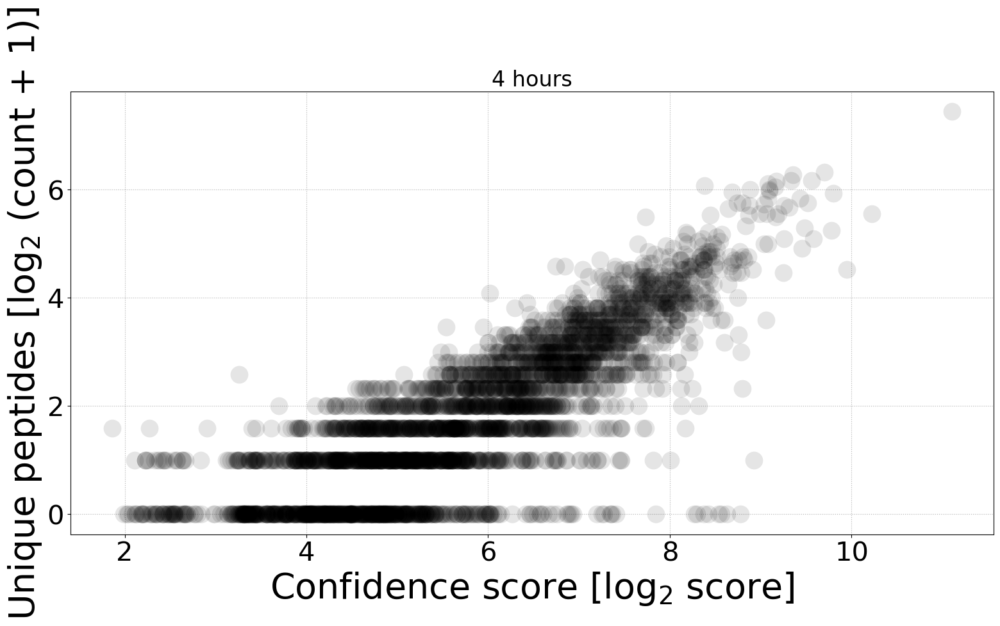

In [15]:
x = numpy.log2(df4['Confidence score'])
y = numpy.log2(df4['Unique peptides']+1)
               
matplotlib.pyplot.plot(x, y, 'o', color='black', alpha=1/10, markeredgecolor='None', ms=20)

matplotlib.pyplot.xlabel('Confidence score [log$_2$ score]')
matplotlib.pyplot.ylabel('Unique peptides [log$_2$ (count + 1)]')
matplotlib.pyplot.grid(ls=':')
matplotlib.pyplot.title('4 hours')
matplotlib.pyplot.tight_layout()

Arbitrary thresholds for confident identifications:
- X-axis: log2 CS = 7 which represents a 2\**7 = 128 score.
- Y-axis: log2 unique peptides + 1 = 3 which represents a 2\**(3)-1 = 7 unique peptides.

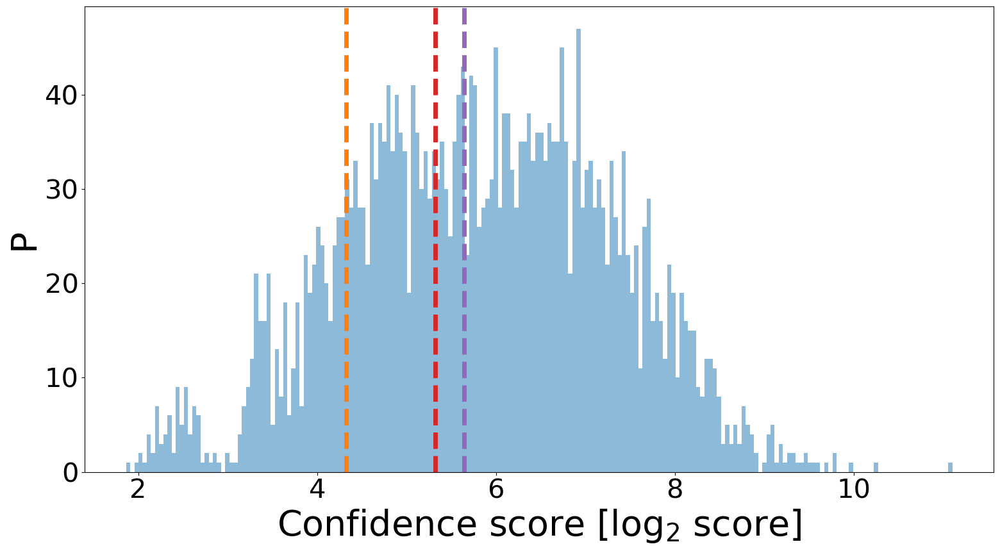

In [16]:
matplotlib.pyplot.hist(numpy.log2(df4['Confidence score']), bins=200, alpha=1/2)
matplotlib.pyplot.axvline(x=numpy.log2(20), lw=5, ls='--', color='tab:orange')
matplotlib.pyplot.axvline(x=numpy.log2(40), lw=5, ls='--', color='tab:red')
matplotlib.pyplot.axvline(x=numpy.log2(50), lw=5, ls='--', color='tab:purple')
matplotlib.pyplot.xlabel('Confidence score [log$_2$ score]')
matplotlib.pyplot.ylabel('P')
matplotlib.pyplot.tight_layout()
matplotlib.pyplot.show()

In [17]:
new4 = df4[(df4['Unique peptides'] >= 1) & (df4['Confidence score'] >= 0)]
print(new4.shape)

working_labels = [label for label in new4.columns if label in all_sample_names]

new4 = numpy.log2(new4.loc[:, working_labels] + 1)
print(new4.shape)
new4

(2528, 85)
(2528, 24)


,20220905_ARNAR_004,20220905_ARNAR_005,20220905_ARNAR_008,20220905_ARNAR_009,20220905_ARNAR_051,20220905_ARNAR_052,20220905_ARNAR_010,20220905_ARNAR_011,20220905_ARNAR_035,20220905_ARNAR_036,...,20220905_ARNAR_019,20220905_ARNAR_020,20220905_ARNAR_044,20220905_ARNAR_046,20220905_ARNAR_024,20220905_ARNAR_025,20220905_ARNAR_026,20220905_ARNAR_027,20220905_ARNAR_060,20220905_ARNAR_065
Accession,,,,,,,,,,,,,,,,,,,,,
Q86Y97,7.568576,7.629861,7.466070,7.704124,7.859829,7.503472,7.846906,8.031127,7.912484,8.080246,...,7.746224,7.791791,7.549580,7.369063,7.055638,7.263232,7.285999,7.186888,7.997748,8.176348
P07996,16.045552,16.078366,16.161570,16.156538,16.229749,16.211154,15.643942,15.675235,15.817460,15.806405,...,16.285414,16.314586,16.509939,16.298168,16.384911,16.406426,16.328664,16.354238,16.145720,16.125135
Q9BYC5,9.957537,9.846812,9.972054,9.924427,9.952922,9.961175,10.160242,10.292097,10.272115,10.290766,...,9.578374,9.437409,9.463392,9.974018,9.961175,9.920405,10.057480,10.042144,8.788501,9.464314
P17612,11.366183,11.371677,11.502530,11.458926,11.281645,11.490084,10.982659,11.018419,11.036613,11.051132,...,11.340180,11.419755,11.470207,11.197037,11.516587,11.553508,11.419025,11.508235,11.170605,10.904918
Q9NVA2,12.240767,12.273150,12.230812,12.246755,12.321591,12.283944,12.229056,12.302041,12.452724,12.257791,...,12.362618,12.350376,12.322057,12.265512,12.272261,12.319145,12.297600,12.287144,12.600883,12.612712
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P11940,10.938910,10.909989,10.984745,10.975925,10.923703,10.957724,10.735809,10.728667,11.009232,10.770036,...,10.864331,10.930608,11.124212,10.895970,10.941142,10.963700,10.866586,10.888312,10.886497,11.083312
P16402,6.827489,6.782686,7.224241,6.817968,6.326902,4.578377,6.862030,6.535857,6.168747,6.519346,...,6.697396,6.925505,6.587884,6.156763,6.790908,6.349609,6.556550,6.680263,6.659611,6.365523
Q5T9S5,12.065849,12.090588,12.101302,12.134545,12.465226,12.474968,12.129535,12.233542,12.079865,11.996127,...,12.173067,12.192364,12.331579,12.466640,12.285771,12.269735,12.190761,12.194932,12.001680,12.333691


### visualize data

200
19.492541086884188


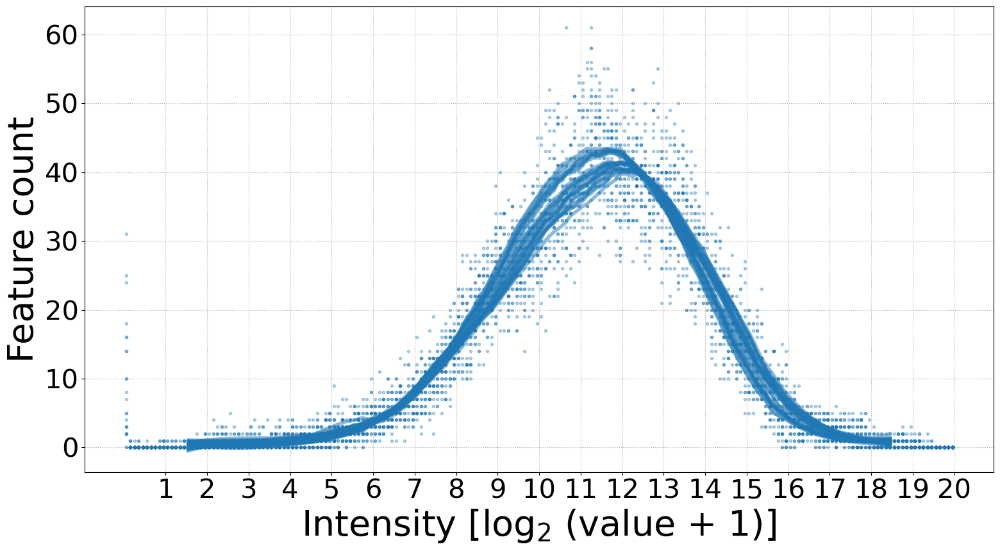

In [18]:
found_max = 20
number_of_bins = found_max * 10
margin = 15
print(number_of_bins)

absolute_max = 0
plotting_x = []; plotting_y = []
most_likely_early = []

for sample in new4.columns:
        
    intensities = new4.loc[:, sample]
    
    # histogram
    hist, bin_edges = numpy.histogram(intensities, bins=number_of_bins, range=(0, found_max))
    half_bin = (bin_edges[1] - bin_edges[0])/2
    x = bin_edges + half_bin
    x = x[:-1]
    
    # curve fitting
    plotting_x = x[margin:-margin]
    plotting_hist = hist[margin:-margin]
    yhat = scipy.signal.savgol_filter(plotting_hist, 51, 3)
    
    # storing info to quantify bias
    most_likely_intensity = x[numpy.argmax(yhat)]
    most_likely_early.append(most_likely_intensity)
    
    
    # plotting
    the_color = 'tab:blue'
    matplotlib.pyplot.plot(x, hist, '.', alpha=1/3, color=the_color)
    matplotlib.pyplot.plot(plotting_x, yhat, '-', lw=4, alpha=1/2, color=the_color)
    
    # check
    if max(intensities) > absolute_max:
        absolute_max = max(intensities)

# check print
print(absolute_max)

matplotlib.pyplot.xticks(range(1, 21))
matplotlib.pyplot.xlabel('Intensity [log$_2$ (value + 1)]')
matplotlib.pyplot.ylabel('Feature count')
matplotlib.pyplot.grid(ls=':')
matplotlib.pyplot.tight_layout()

### normalization

In [19]:
#
# quantile normalization 
# taken from https://cmdlinetips.com/2020/06/computing-quantile-normalization-in-python/
#

# step 1/3: sorting sample values
df_sorted = pandas.DataFrame(numpy.sort(new4.values, axis=0), index=new4.index, columns=new4.columns)
# step 2/3: averaging rank values across samples
df_mean = df_sorted.mean(axis=1)
df_mean.index = numpy.arange(1, len(df_mean) + 1)
# step 3/3: re-ordering samples
qndf = new4.rank(method="min").stack().astype(int).map(df_mean).unstack()

### distributions after normalization

200
19.071343768957153


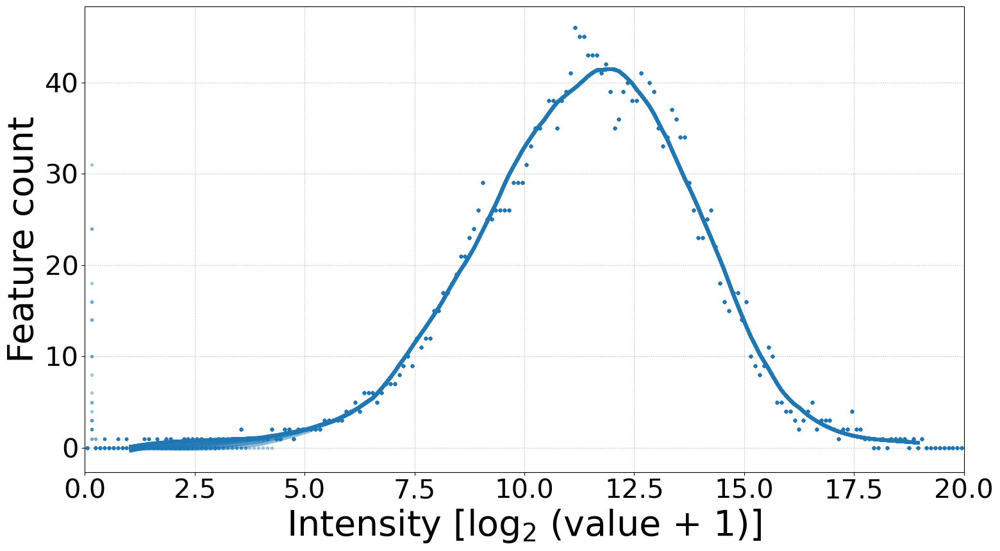

In [20]:
found_max = 20
number_of_bins = found_max * 10
margin = 10
print(number_of_bins)

absolute_max = 0
plotting_x = []; plotting_y = []
most_likely_early = []

for sample in qndf.columns:
        
    intensities = qndf.loc[:, sample]
    
    # histogram
    hist, bin_edges = numpy.histogram(intensities, bins=number_of_bins, range=(0, found_max))
    half_bin = (bin_edges[1] - bin_edges[0])/2
    x = bin_edges + half_bin
    x = x[:-1]
    
    # curve fitting
    plotting_x = x[margin:-margin]
    plotting_hist = hist[margin:-margin]
    yhat = scipy.signal.savgol_filter(plotting_hist, 51, 3)
    
    # storing info to quantify bias
    most_likely_intensity = x[numpy.argmax(yhat)]
    most_likely_early.append(most_likely_intensity)
    
    
    # plotting
    the_color = 'tab:blue'
    matplotlib.pyplot.plot(x, hist, '.', alpha=1/3, color=the_color)
    matplotlib.pyplot.plot(plotting_x, yhat, '-', lw=4, alpha=1/2, color=the_color)
    
    # check
    if max(intensities) > absolute_max:
        absolute_max = max(intensities)

# check print
print(absolute_max)
matplotlib.pyplot.xlim(0,20)

matplotlib.pyplot.xlabel('Intensity [log$_2$ (value + 1)]')
matplotlib.pyplot.ylabel('Feature count')
matplotlib.pyplot.grid(ls=':')
matplotlib.pyplot.tight_layout()

### biomarkers

In [21]:
df4

,Peptide count,Unique peptides,Confidence score,Anova (p),q Value,Max fold change,Power,Highest mean condition,Lowest mean condition,Mass,...,20220905_ARNAR_044.2,20220905_ARNAR_046.2,20220905_ARNAR_024.2,20220905_ARNAR_025.2,20220905_ARNAR_026.2,20220905_ARNAR_027.2,20220905_ARNAR_060.2,20220905_ARNAR_065.2,no unique peptides,confidence<40
Accession,,,,,,,,,,,,,,,,,,,,,
Q86Y97,4,1,19.9706,2.294162e-07,0.000040,1.857857,1.0,TNFa 4h,NorEPI 4h,53025.4924,...,0,0,0,0,0,0,0,0,NaN,x
P07996,100,68,540.9306,2.828252e-07,0.000040,1.455024,1.0,NorEPI 4h,Ctrl 4h,133374.7259,...,0,0,37,51,31,0,0,0,NaN,NaN
Q9BYC5,12,3,58.5130,3.726699e-07,0.000040,2.085111,1.0,Ctrl 4h,TNFa 4h,66972.0815,...,0,0,0,1,0,0,0,0,NaN,NaN
P17612,17,3,111.8179,6.981399e-07,0.000056,1.372203,1.0,NorEPI 4h,TNFa 4h,40703.7821,...,0,0,0,0,0,0,0,0,NaN,NaN
Q9NVA2,28,10,132.4747,1.576348e-06,0.000101,1.266081,1.0,TNFa 4h,Epi 4h,49683.4837,...,0,0,1,6,2,0,0,0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Q92930,12,0,119.3084,NaN,NaN,NaN,NaN,---,---,23755.2297,...,0,0,0,0,0,0,0,0,x,NaN
Q93045,5,0,43.1622,NaN,NaN,NaN,NaN,---,---,20942.1591,...,0,0,0,0,0,0,0,0,x,NaN
Q93086,5,0,26.3792,NaN,NaN,NaN,NaN,---,---,48003.1742,...,0,0,0,0,0,0,0,0,x,NaN


In [22]:
detected_biomarkers = {}
for biomarker in biomarkers.keys():
    uniprot_id = biomarkers[biomarker]
    print('working with biomarker {}, uniprot {}'.format(biomarker, uniprot_id))
    for element in df4.index:
        if uniprot_id in element:
            print('\t{}, peptide count {}, score {}'.format(element, df4.loc[element, 'Unique peptides'], df4.loc[element, 'Confidence score']))
            detected_biomarkers[element] = biomarker

detected_biomarkers.keys()

working with biomarker endothelin, uniprot P05305
working with biomarker PAI-1, uniprot P05121
	P05121, peptide count 19, score 215.7082
working with biomarker uPA, uniprot P00749
working with biomarker VCAM-1, uniprot P19320
working with biomarker L-selectin, uniprot P14151
working with biomarker Ang2, uniprot O15123
working with biomarker VEGFr1, uniprot P17948
working with biomarker ICAM-2, uniprot P13598
	P13598, peptide count 4, score 73.0967
working with biomarker tie2, uniprot Q02763
working with biomarker IL-6, uniprot P05231
working with biomarker E-selectin, uniprot P16581
working with biomarker ICAM-1, uniprot P05362
	P05362, peptide count 2, score 38.8919
working with biomarker P-selectin, uniprot P16109
working with biomarker Ang1, uniprot Q15389
working with biomarker vWF, uniprot P04275
working with biomarker PDGF, uniprot P01127
working with biomarker endocan, uniprot Q9NQ30
working with biomarker TNFa, uniprot P01375
working with biomarker VEGFa, uniprot P15692


dict_keys(['P05121', 'P13598', 'P05362'])

P05121 4h control
P05121 4h epi
P05121 4h nor
P05121 4h epinor
P05121 4h TNFa
PAI-1 [16.3832417056705, 16.25073217723727, 16.05110504365731, 16.559361035322947, 15.911607289679079]
P13598 4h control
P13598 4h epi
P13598 4h nor
P13598 4h epinor
P13598 4h TNFa
ICAM-2 [11.314049386676263, 11.172175485531238, 11.272471413390722, 11.030145299158619, 11.402497174542678]
P05362 4h control
P05362 4h epi
P05362 4h nor
P05362 4h epinor
P05362 4h TNFa
ICAM-1 [8.921226585247059, 9.809193729719926, 9.890215322121211, 9.400373928110387, 10.322439311392213]
{'PAI-1': [0.0, -0.1325095284332285, -0.33213666201319114, 0.17611932965244748, -0.47163441599142075], 'ICAM-2': [0.0, -0.14187390114502563, -0.04157797328554125, -0.2839040875176444, 0.08844778786641427], 'ICAM-1': [0.0, 0.8879671444728672, 0.9689887368741523, 0.47914734286332816, 1.401212726145154]}


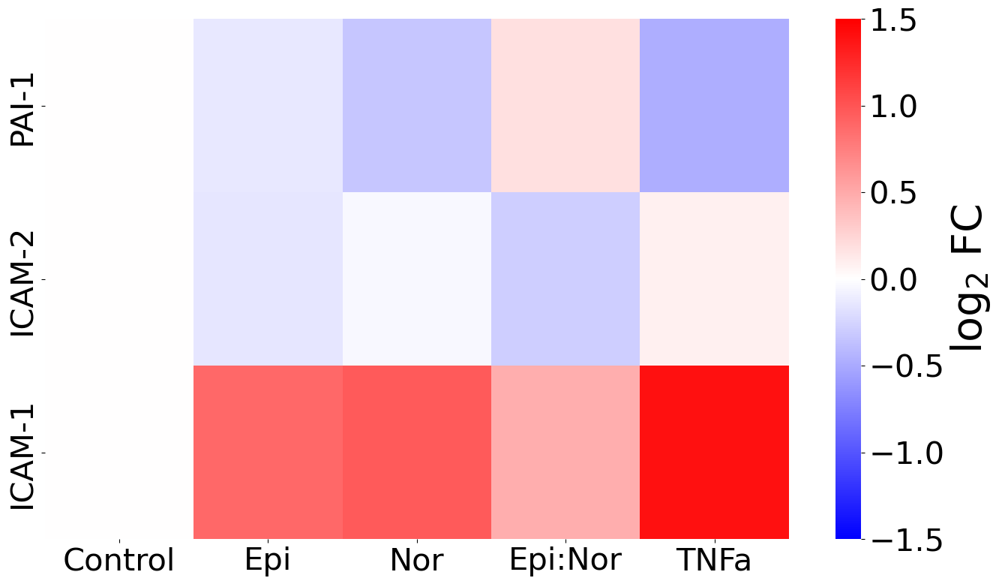

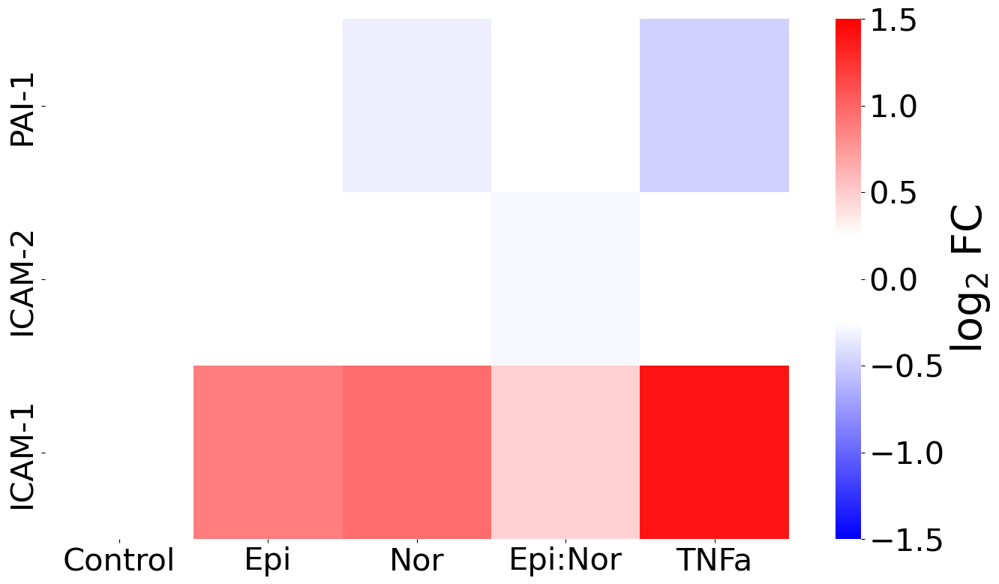

In [23]:
# gererate data for heatmap
heatmap_data = {}
for marker in detected_biomarkers.keys():
    heatmap_data[detected_biomarkers[marker]] = []
    for treatment in metadata.keys():
        print(marker, treatment)
        log2_intensity = numpy.median(qndf.loc[marker, metadata[treatment]].values)
        heatmap_data[detected_biomarkers[marker]].append(log2_intensity)
    print(detected_biomarkers[marker], heatmap_data[detected_biomarkers[marker]])

for biomarker in heatmap_data:
    reference = heatmap_data[biomarker][0]
    for i in range(len(heatmap_data[biomarker])):
        heatmap_data[biomarker][i] = heatmap_data[biomarker][i] - reference
print(heatmap_data)
heatmap_df = pandas.DataFrame.from_dict(heatmap_data).transpose()
heatmap_df.columns = ['Control', 'Epi', 'Nor', 'Epi:Nor', 'TNFa']

colors = [(0, "blue"), (0.5-(1/12), "white"), (0.5+(1/12), "white"), (1, "red")]
bwwr = matplotlib.colors.LinearSegmentedColormap.from_list("bwwr", colors)

seaborn.heatmap(data=heatmap_df, cmap='bwr', vmin=-1.5, vmax=1.5, cbar_kws={'label':'log$_2$ FC'})
matplotlib.pyplot.show()

seaborn.heatmap(data=heatmap_df, cmap=bwwr, vmin=-1.5, vmax=1.5, cbar_kws={'label':'log$_2$ FC'})
matplotlib.pyplot.show()

### PCA

[0.32620718 0.15122761]


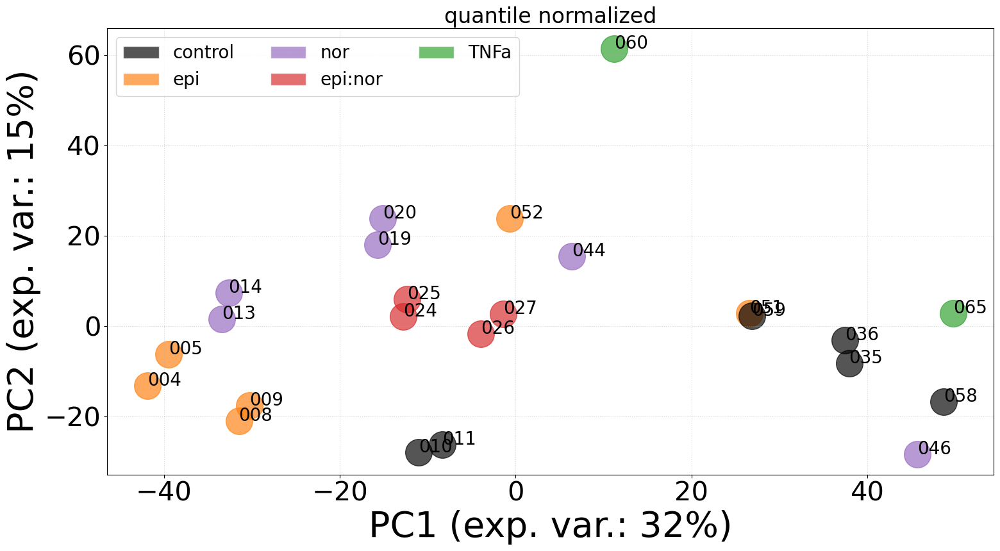

In [24]:
# quantile normalized all
transpose = qndf.transpose()
scaled_data = sklearn.preprocessing.StandardScaler().fit_transform(transpose)
model = sklearn.decomposition.PCA(n_components=2)
locations = model.fit_transform(scaled_data)
explained = model.explained_variance_ratio_
print(explained)

for i in range(len(locations)):
    
    the_marker = 'o'
        
    if qndf.columns[i] in metadata['4h control']:
        the_color = 'black'
    elif qndf.columns[i] in metadata['4h epi']:
        the_color = 'tab:orange'
    elif qndf.columns[i] in metadata['4h nor']:
        the_color = 'tab:purple'
    elif qndf.columns[i] in metadata['4h epinor']:
        the_color = 'tab:red'
    elif qndf.columns[i] in metadata['4h TNFa']:
        the_color = 'tab:green'
    else:
        raise ValueError('sample not classified')
    
    matplotlib.pyplot.scatter(locations[i,0], locations[i,1], s=900, c=the_color, marker=the_marker, alpha=2/3)
    
    the_label = qndf.columns[i].split('_')[-1]
    matplotlib.pyplot.text(locations[i, 0], locations[i, 1], the_label)
    
legend_elements = [ 
    matplotlib.patches.Patch(facecolor='black', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:orange', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:purple', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:red', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:green', edgecolor='white', alpha=2/3)
]
matplotlib.pyplot.legend(legend_elements, ['control', 'epi', 'nor', 'epi:nor', 'TNFa'], ncol=3)

matplotlib.pyplot.xlabel('PC1 (exp. var.: {}%)'.format(int(explained[0]*100)))
matplotlib.pyplot.ylabel('PC2 (exp. var.: {}%)'.format(int(explained[1]*100)))
matplotlib.pyplot.grid(alpha=0.5, ls=':')
matplotlib.pyplot.title('quantile normalized')
matplotlib.pyplot.tight_layout()

[0.46998353 0.13362752]


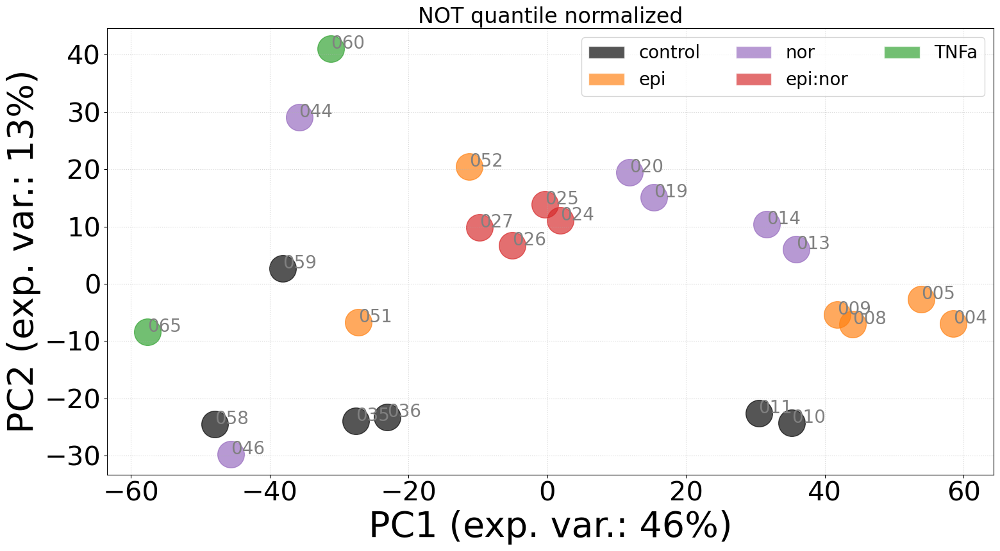

In [25]:
# non-quantile normalized all
transpose = new4.transpose()
scaled_data = sklearn.preprocessing.StandardScaler().fit_transform(transpose)
model = sklearn.decomposition.PCA(n_components=2)
locations = model.fit_transform(scaled_data)
explained = model.explained_variance_ratio_
print(explained)

for i in range(len(locations)):
    
    the_marker = 'o'
        
    if qndf.columns[i] in metadata['4h control']:
        the_color = 'black'
    elif qndf.columns[i] in metadata['4h epi']:
        the_color = 'tab:orange'
    elif qndf.columns[i] in metadata['4h nor']:
        the_color = 'tab:purple'
    elif qndf.columns[i] in metadata['4h epinor']:
        the_color = 'tab:red'
    elif qndf.columns[i] in metadata['4h TNFa']:
        the_color = 'tab:green'
    else:
        raise ValueError('sample not classified')
        
    matplotlib.pyplot.scatter(locations[i,0], locations[i,1], s=900, c=the_color, marker=the_marker, alpha=2/3)
    
    the_label = new4.columns[i].split('_')[-1]
    matplotlib.pyplot.text(locations[i, 0], locations[i, 1], the_label, color='gray')
    
legend_elements = [
    matplotlib.patches.Patch(facecolor='black', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:orange', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:purple', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:red', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:green', edgecolor='white', alpha=2/3)
]
matplotlib.pyplot.legend(legend_elements, ['control', 'epi', 'nor', 'epi:nor', 'TNFa'], ncol=3)

matplotlib.pyplot.xlabel('PC1 (exp. var.: {}%)'.format(int(explained[0]*100)))
matplotlib.pyplot.ylabel('PC2 (exp. var.: {}%)'.format(int(explained[1]*100)))
matplotlib.pyplot.grid(alpha=0.5, ls=':')
matplotlib.pyplot.title('NOT quantile normalized')

matplotlib.pyplot.tight_layout()

10
['20220905_ARNAR_060', '20220905_ARNAR_065', '20220905_ARNAR_052', '20220905_ARNAR_044', '20220905_ARNAR_051', '20220905_ARNAR_059', '20220905_ARNAR_036', '20220905_ARNAR_035', '20220905_ARNAR_058', '20220905_ARNAR_046']
[0.29065869 0.22573567]


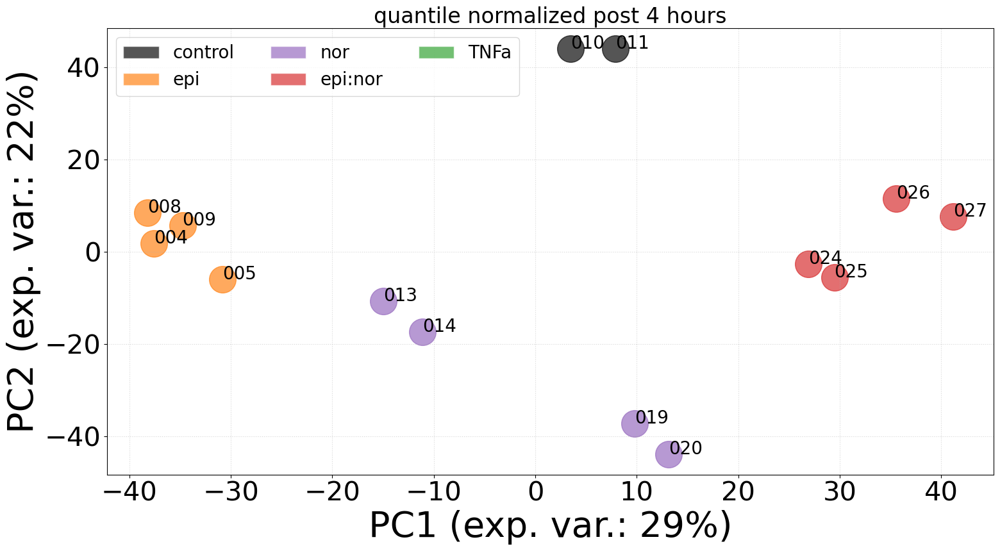

In [26]:
# excluding arbitrary samples
excluded_sample_tags = ['060', '065', '052', '044', '051', '059', '036', '035', '058', '046']
print(len(excluded_sample_tags)) # should be 10
excluded_samples = ['20220905_ARNAR_' + element for element in excluded_sample_tags]
print(excluded_samples)
simplified_df = new4.drop(excluded_samples, axis=1)

# normalization
# step 1/3: sorting sample values
df_sorted = pandas.DataFrame(numpy.sort(simplified_df.values, axis=0), index=simplified_df.index, columns=simplified_df.columns)
# step 2/3: averaging rank values across samples
df_mean = df_sorted.mean(axis=1)
df_mean.index = numpy.arange(1, len(df_mean) + 1)
# step 3/3: re-ordering samples
qndf = simplified_df.rank(method="min").stack().astype(int).map(df_mean).unstack()

# PCA
transpose = qndf.transpose()
scaled_data = sklearn.preprocessing.StandardScaler().fit_transform(transpose)
model = sklearn.decomposition.PCA(n_components=2)
locations = model.fit_transform(scaled_data)
explained = model.explained_variance_ratio_
print(explained)

for i in range(len(locations)):
    
    the_marker = 'o'
    the_label = qndf.columns[i].split('_')[-1]
        
    if simplified_df.columns[i] in metadata['4h control']:
        the_color = 'black'
    elif simplified_df.columns[i] in metadata['4h epi']:
        the_color = 'tab:orange'
    elif simplified_df.columns[i] in metadata['4h nor']:
        the_color = 'tab:purple'
    elif simplified_df.columns[i] in metadata['4h epinor']:
        the_color = 'tab:red'
    elif simplified_df.columns[i] in metadata['4h TNFa']:
        the_color = 'tab:green'
    else:
        raise ValueError('sample not classified')
    
    matplotlib.pyplot.scatter(locations[i,0], locations[i,1], s=900, c=the_color, marker=the_marker, alpha=2/3)
    matplotlib.pyplot.text(locations[i, 0], locations[i, 1], the_label)
    
    
legend_elements = [ 
    matplotlib.patches.Patch(facecolor='black', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:orange', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:purple', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:red', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:green', edgecolor='white', alpha=2/3)
]
matplotlib.pyplot.legend(legend_elements, ['control', 'epi', 'nor', 'epi:nor', 'TNFa'], ncol=3)

matplotlib.pyplot.xlabel('PC1 (exp. var.: {}%)'.format(int(explained[0]*100)))
matplotlib.pyplot.ylabel('PC2 (exp. var.: {}%)'.format(int(explained[1]*100)))
matplotlib.pyplot.grid(alpha=0.5, ls=':')
matplotlib.pyplot.title('quantile normalized post 4 hours')
matplotlib.pyplot.tight_layout()

### make comparisons

In [27]:
def comparison_function(time_label, detected_biomarkers, qndf, treatment_label, treatment_color, control_samples, treated_samples):
    
    # f.1. determine P values
    fold_changes = []; pvalues = []

    for protein in qndf.index:
        control_values = qndf.loc[protein, control_samples].values
        treated_values = qndf.loc[protein, treated_samples].values

        log2FC = numpy.median(treated_values) - numpy.median(control_values)
        statistic, pvalue = scipy.stats.ttest_ind(control_values, treated_values)
        # dealing with exact same values on two samples
        if numpy.isnan(pvalue):
            pvalue = 1
        fold_changes.append(log2FC); pvalues.append(pvalue)

    print('P before correction', numpy.min(pvalues), numpy.max(pvalues))
    
    # f.3. Benjamini-Hochberg
    print('Benjamini-Hochberg correction')
    
    message = 'entrez_id\tuniprot\tdescription\tlog2FC\t-log10Q\n'
    up_file = '{}{}.{}.up.txt'.format(output_dir, time_label, treatment_label)
    fup = open(up_file, 'w')
    fup.write(message)
    down_file = '{}{}.{}.down.txt'.format(output_dir, time_label, treatment_label)
    fdown = open(down_file, 'w')
    fdown.write(message)
    
    color_container = {}
    
    correction_model = statsmodels.stats.multitest.multipletests(pvalues, method='fdr_bh', alpha=0.1)
    a = numpy.array(correction_model[1])
    epsilon = -numpy.log10(numpy.min(a[a.nonzero()])/2)
    print('epsilon: {}'.format(epsilon))

    responding_proteins = []
    for i in range(len(correction_model[0])):

        # dealing with numerical value
        if correction_model[1][i] == 0:
            plotting_p = epsilon
        else:
            plotting_p = -numpy.log10(correction_model[1][i])

        # dealing with color
        if correction_model[0][i] == True and numpy.abs(fold_changes[i]) >= fold_change_threshold:
            plotting_color = treatment_color
            protein_id = qndf.index[i]
            description = rosetta[protein_id]
            responding_proteins.append(protein_id)
            
            # store in file
            entrezid = None
            if ';' in protein_id:
                search_id = protein_id.split(';')[0]
            else:
                search_id = protein_id
                
            info = mygenedb.query(search_id)
            if len(info['hits']) >= 1:
                entrezid = info['hits'][0]['entrezgene']
            message = '{}\t{}\t{}\t{}\t{}\n'.format(entrezid, protein_id, description, fold_changes[i], plotting_p)
            print(message)
            if fold_changes[i] > 0:
                fup.write(message)
            elif fold_changes[i] < 0:
                fdown.write(message)
            else:
                raise ValueError('fold change detected of exactly zero')
                
            # store for selected boxplots
            goodness = numpy.sqrt(fold_changes[i]**2 + plotting_p**2)
            color_container[protein_id] = goodness
                
        # otherwise black color, not a responding protein    
        else:
            plotting_color = 'black'

        # plot
        recalc = fold_changes[i]
        if recalc > 1.4:
            recalc = 1.4
        if recalc < -1.4:
            recalc = -1.4
    
        matplotlib.pyplot.plot(recalc, plotting_p, 'o', color=plotting_color, alpha=1/3, mec='None', ms=15)
        
        # dealing with biomarkers
        if qndf.index[i] in detected_biomarkers.keys():
            print('\nBIOMAKER\n', qndf.index[i], detected_biomarkers[qndf.index[i]], int(((2**recalc)*100)-100), plotting_p, plotting_color, '\n')

    matplotlib.pyplot.ylabel('-log$_{10}$ Q')
    matplotlib.pyplot.xlabel('log$_2$ FC')
    matplotlib.pyplot.grid(alpha=0.5, ls=':')
    matplotlib.pyplot.title('{} Benjamini-Hochberg'.format(treatment_label))
    matplotlib.pyplot.xlim([-1.5, 1.5])
    matplotlib.pyplot.show()
    
    fup.close()
    fdown.close()

    print('{} proteins respond to treatment'.format(len(responding_proteins)))
    
    # plot three random responding proteins
    sorted_response = sorted(color_container.items(), key=lambda x:x[1])
    least_responders = [element[0] for element in sorted_response[:5]]
    most_responders = [element[0] for element in sorted_response[-6:-1]]    
    
    for protein in most_responders:
        control_values = qndf.loc[protein, control_samples].values
        treated_values = qndf.loc[protein, treated_samples].values

        d = {'Control':control_values, treatment_label:treated_values}
        container = pandas.DataFrame(dict([(k, pandas.Series(v)) for k, v in d.items()]))

        my_colors = ["white", treatment_color]
        seaborn.set_palette(my_colors)
        seaborn.boxplot(data=container)

        matplotlib.pyplot.title('most {} {}'.format(protein, rosetta[protein]))
        matplotlib.pyplot.ylabel('log$_2$ Intensity')
        matplotlib.pyplot.grid(alpha=0.5, ls=':')
        matplotlib.pyplot.show()
        
    for protein in least_responders:
        control_values = qndf.loc[protein, control_samples].values
        treated_values = qndf.loc[protein, treated_samples].values

        d = {'Control':control_values, treatment_label:treated_values}
        container = pandas.DataFrame(dict([(k, pandas.Series(v)) for k, v in d.items()]))

        my_colors = ["white", treatment_color]
        seaborn.set_palette(my_colors)
        seaborn.boxplot(data=container)

        matplotlib.pyplot.title('least {} {}'.format(protein, rosetta[protein]))
        matplotlib.pyplot.ylabel('log$_2$ Intensity')
        matplotlib.pyplot.grid(alpha=0.5, ls=':')
        matplotlib.pyplot.show()
    
    return responding_proteins

P before correction 0.0 1.0
Benjamini-Hochberg correction
epsilon: 3.2221090692643823
10573	Q13084	39S ribosomal protein L28_ mitochondrial	5.3948044750870165	2.3237750497718213

55616	Q8TDY4	Arf-GAP with SH3 domain_ ANK repeat and PH domain-containing protein 3	-1.18606046265523	2.1392813033564986

4836	P30419	Glycylpeptide N-tetradecanoyltransferase 1	-1.0395856568275583	1.2153058239256596

5617	P01236	Prolactin	-1.054422497314322	1.009806636553011

3106	P01889	HLA class I histocompatibility antigen_ B alpha chain	1.342521858311457	2.1392813033564986

10063	Q14061	Cytochrome c oxidase copper chaperone	3.0986686381253272	2.2149415844625615

23500	Q86T65	Disheveled-associated activator of morphogenesis 2	1.143615187425917	2.3024077888342873

6723	P19623	Spermidine synthase	-1.157825997801119	2.4131451828887975

22913	Q9UKM9	RNA-binding protein Raly	1.1285094804485567	1.4546174292286045

7535	P43403	Tyrosine-protein kinase ZAP-70	1.002449865181072	1.5979790515304704

55506	Q9P0M6	Core h

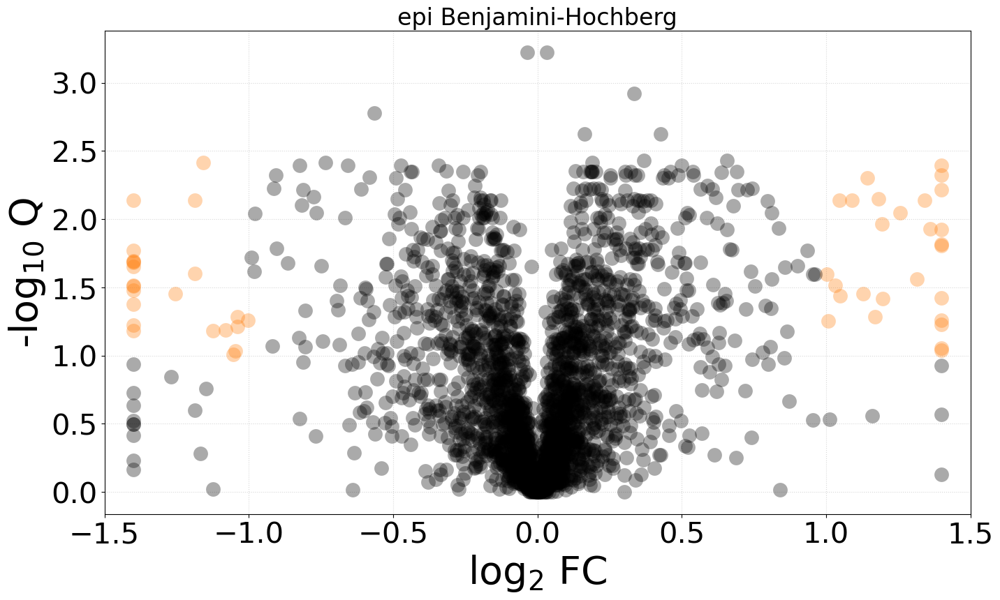

50 proteins respond to treatment


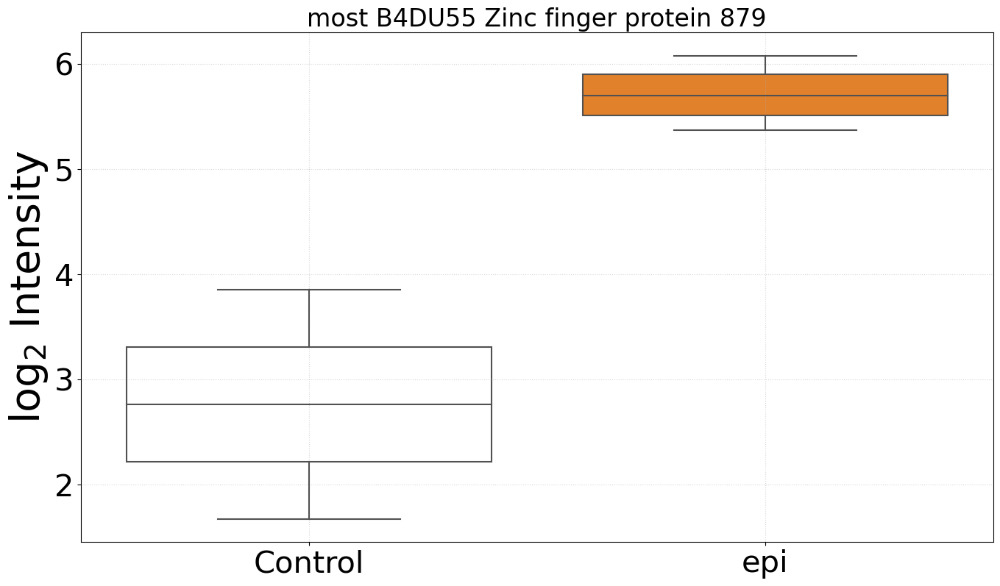

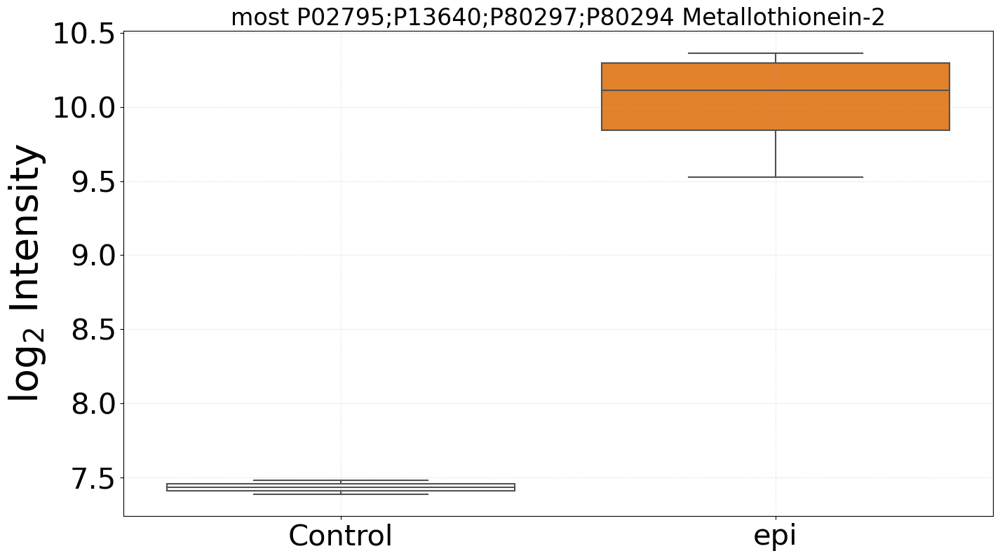

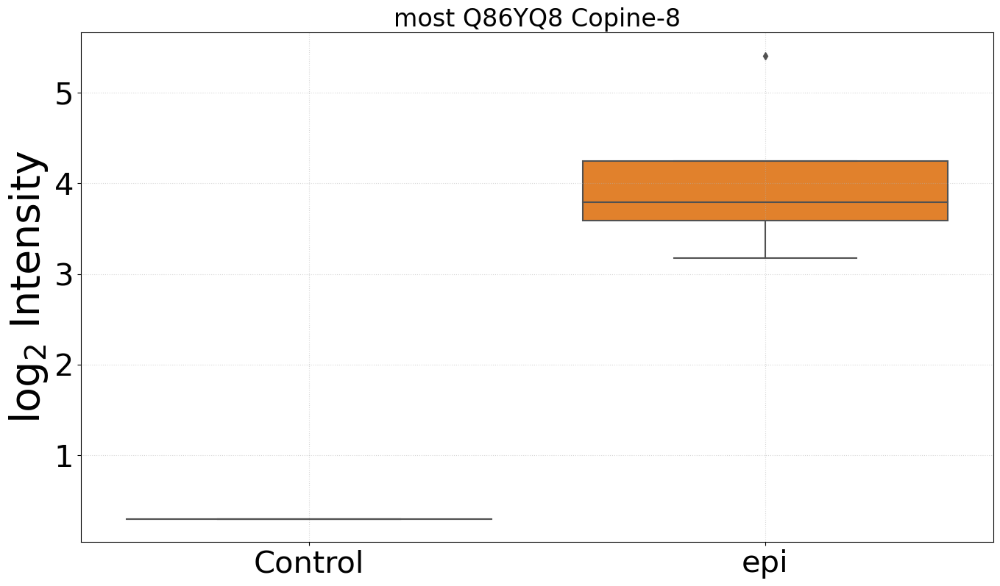

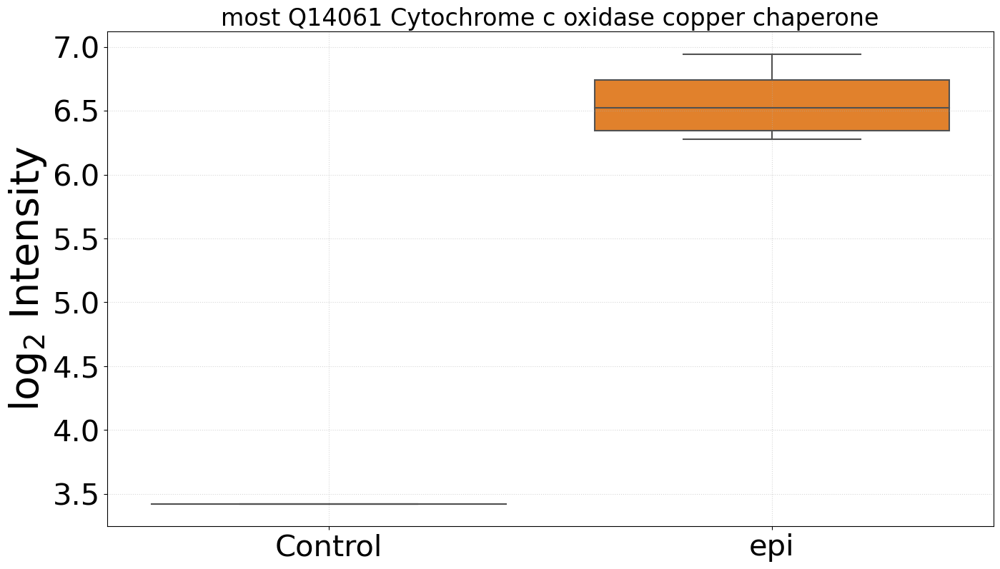

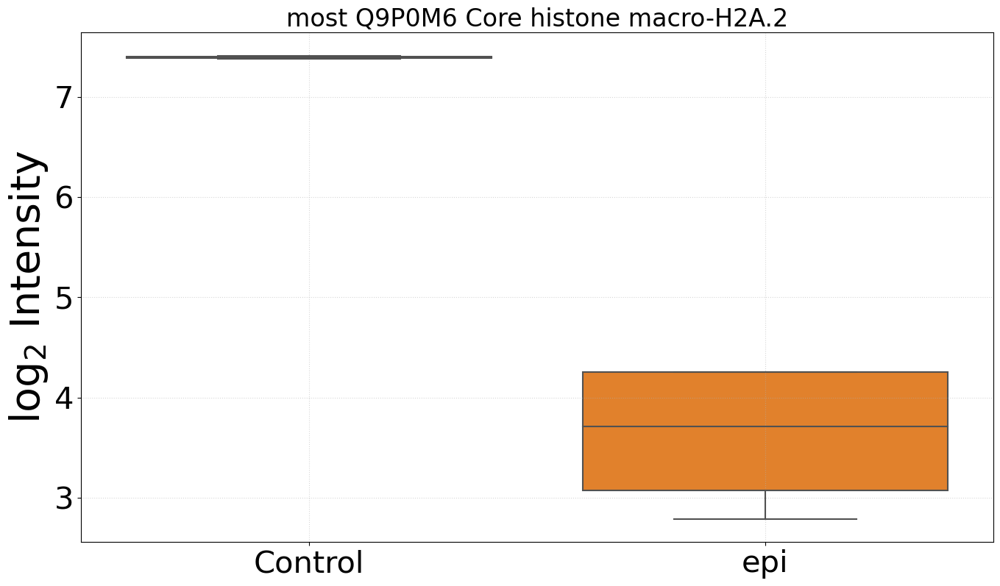

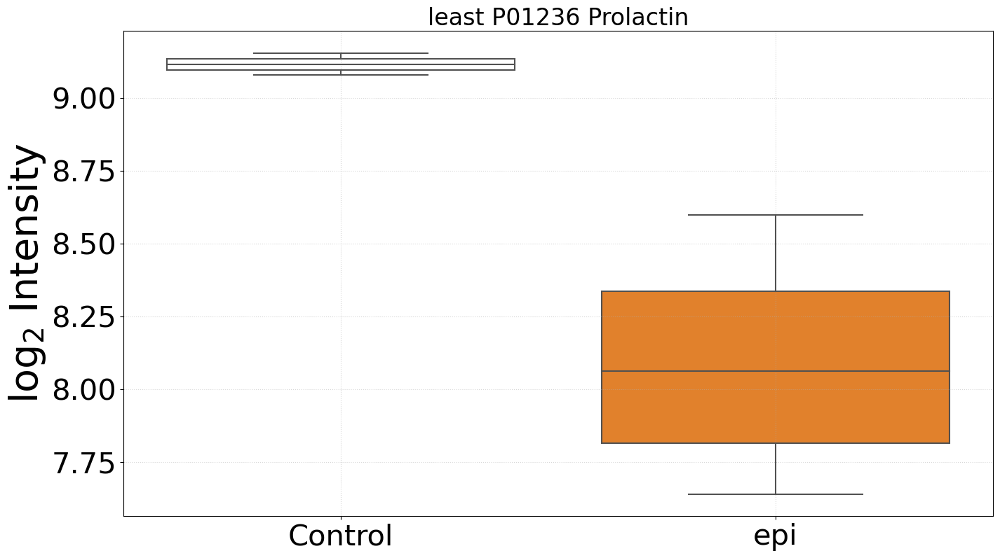

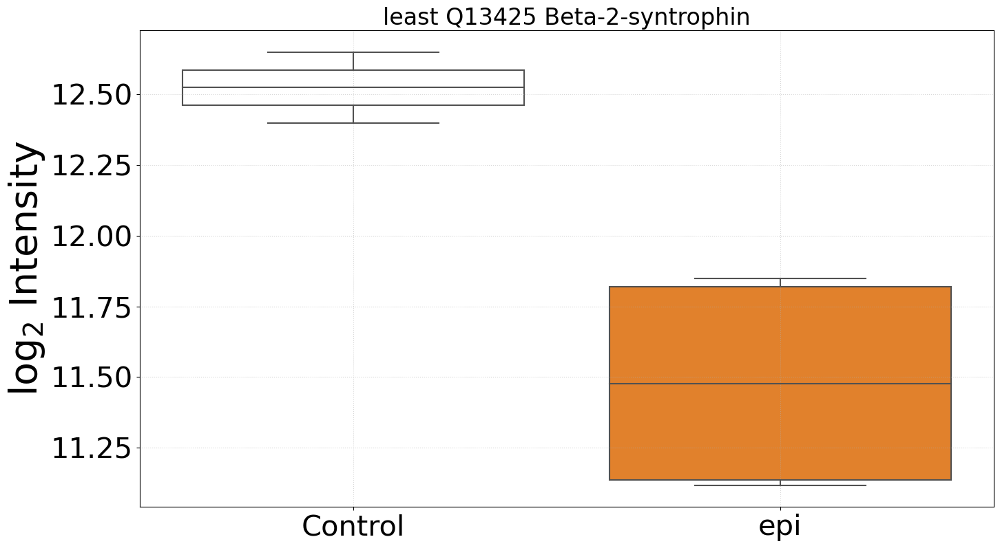

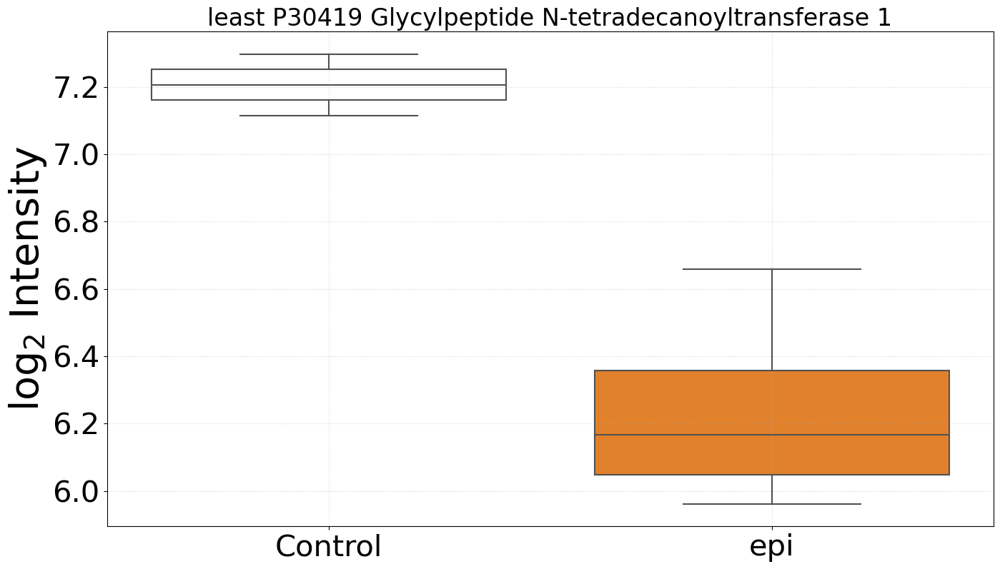

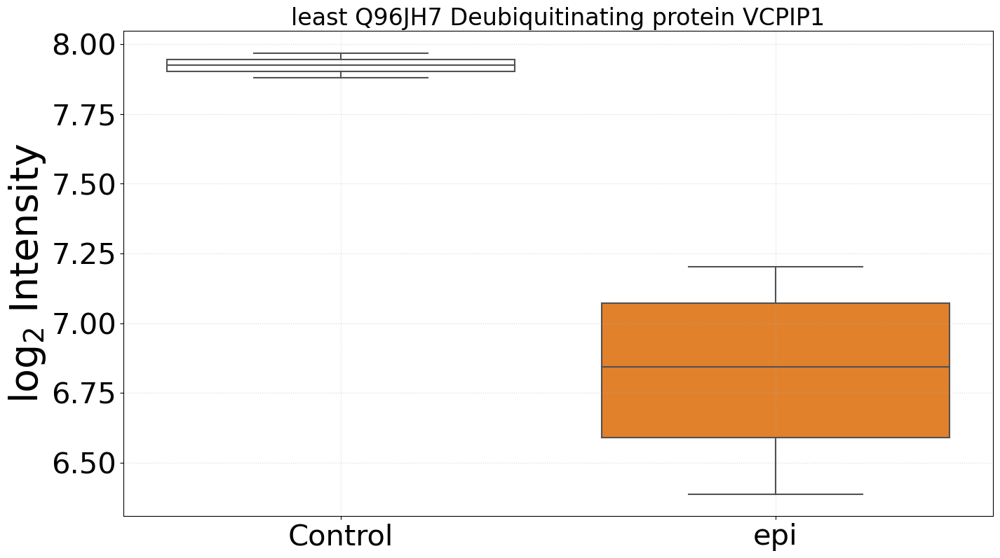

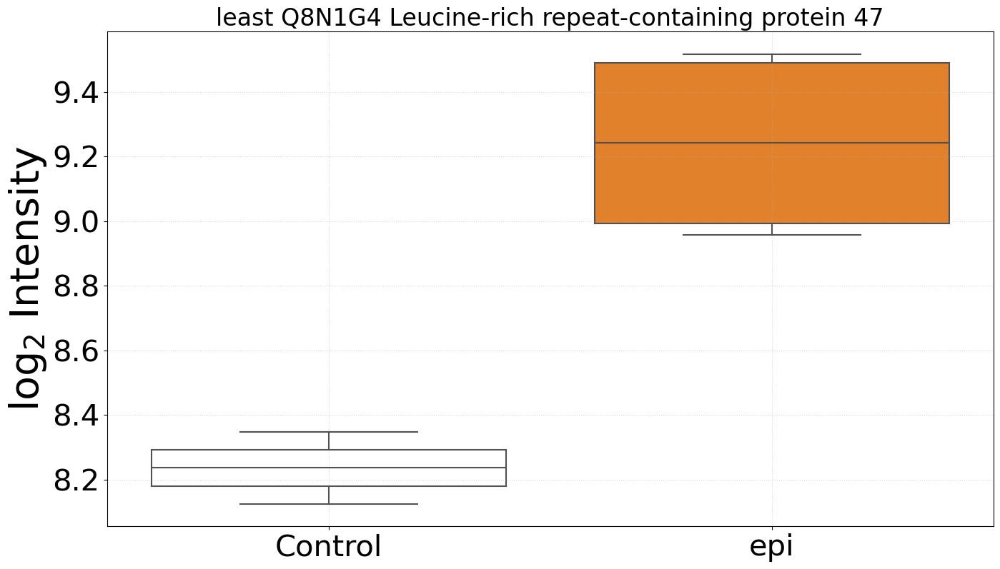

In [28]:
treatment_label = 'epi'
treatment_color = 'tab:orange'
control_samples = ['20220905_ARNAR_' + element for element in ['010', '011']]
treated_samples = ['20220905_ARNAR_' + element for element in ['005', '004', '009', '008']]
epi_response = comparison_function('4h', detected_biomarkers, qndf, treatment_label, treatment_color, control_samples, treated_samples)

P before correction 0.0 1.0
Benjamini-Hochberg correction
epsilon: 3.355813050767687
10573	Q13084	39S ribosomal protein L28_ mitochondrial	4.895381227114089	2.736198174585475

23095	O60333	Kinesin-like protein KIF1B	-1.1567901542684798	1.3321266368881688

55616	Q8TDY4	Arf-GAP with SH3 domain_ ANK repeat and PH domain-containing protein 3	-1.8659993135992892	1.8872194393520945

3106	P01889	HLA class I histocompatibility antigen_ B alpha chain	1.5332562454933854	2.736198174585475

10063	Q14061	Cytochrome c oxidase copper chaperone	2.402380717944515	1.7763977459216496

6723	P19623	Spermidine synthase	-1.3504984539856562	1.7319446794713347

79731	Q96I59	Probable asparagine--tRNA ligase_ mitochondrial	-1.2957067366926402	1.5746844713256536

6891	Q03519	Antigen peptide transporter 2	-1.7364376771198717	1.5390021683004271

65979	Q8IZ21	Phosphatase and actin regulator 4	1.5114230299935691	1.2509844013514373

64844	Q9H992	E3 ubiquitin-protein ligase MARCHF7	-1.8419823510046234	1.986872453008365

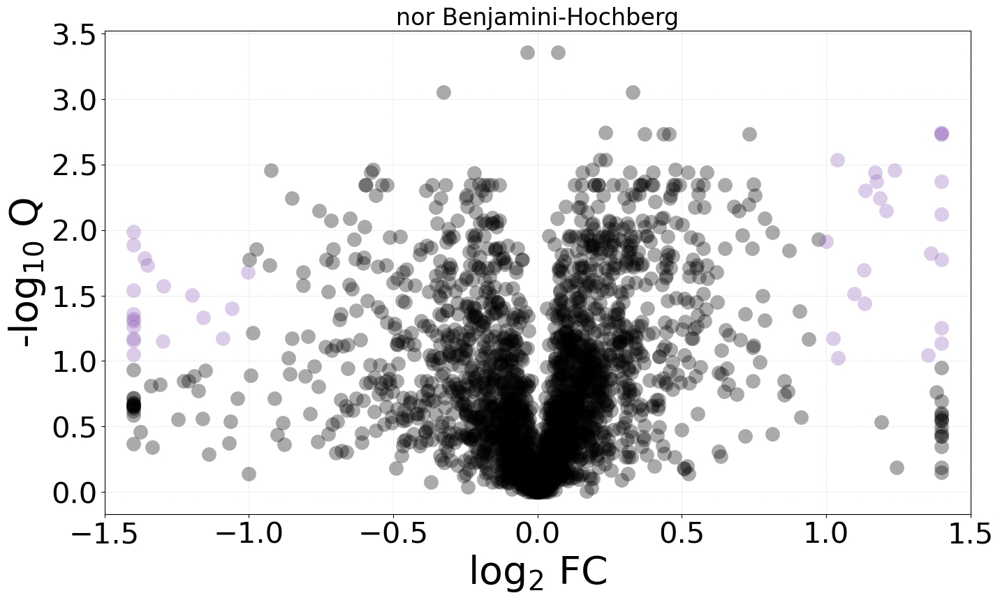

42 proteins respond to treatment


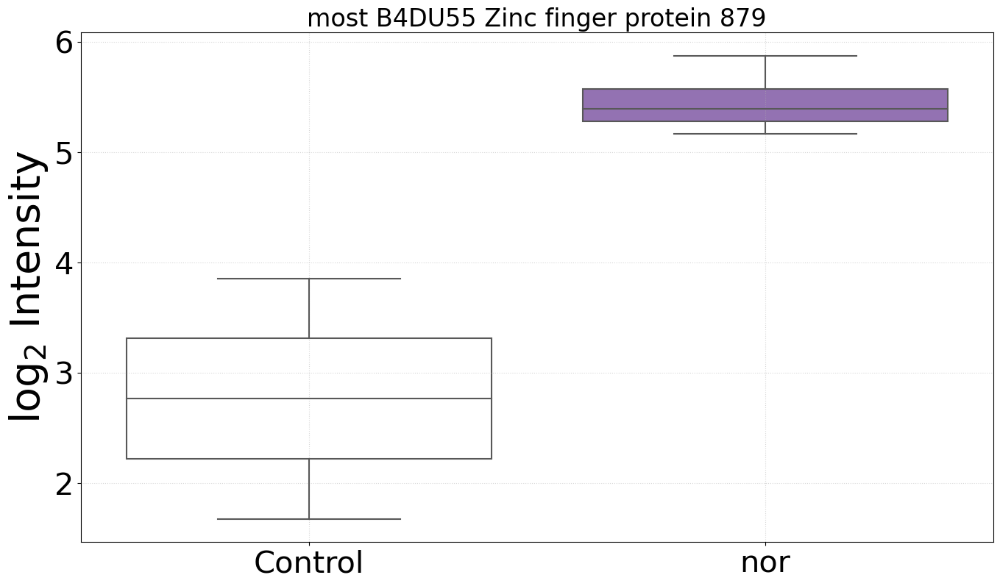

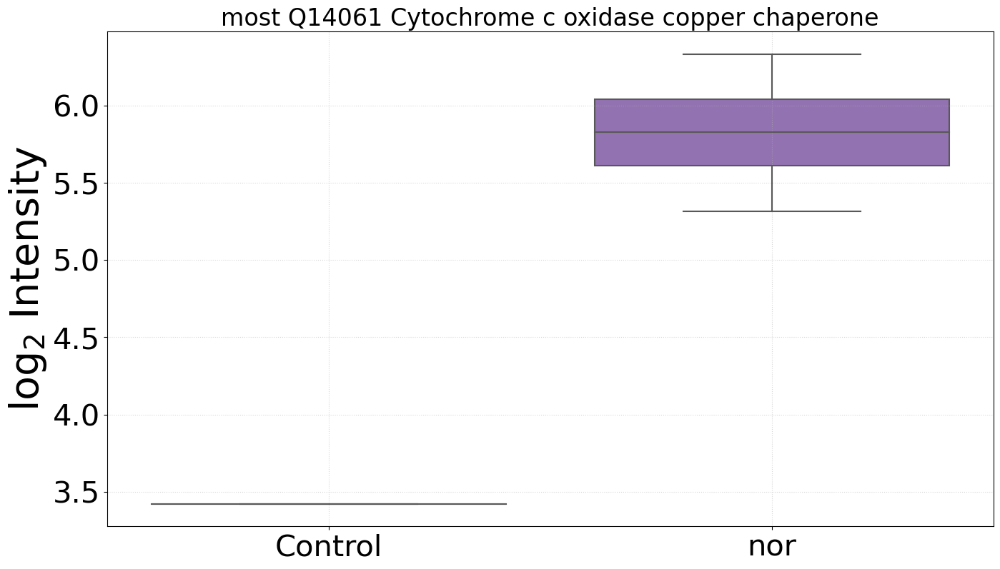

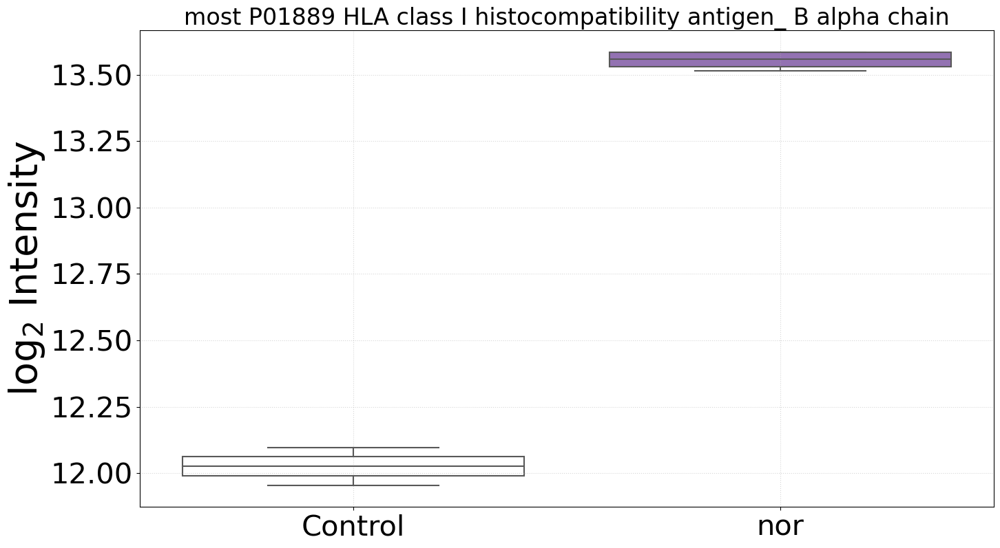

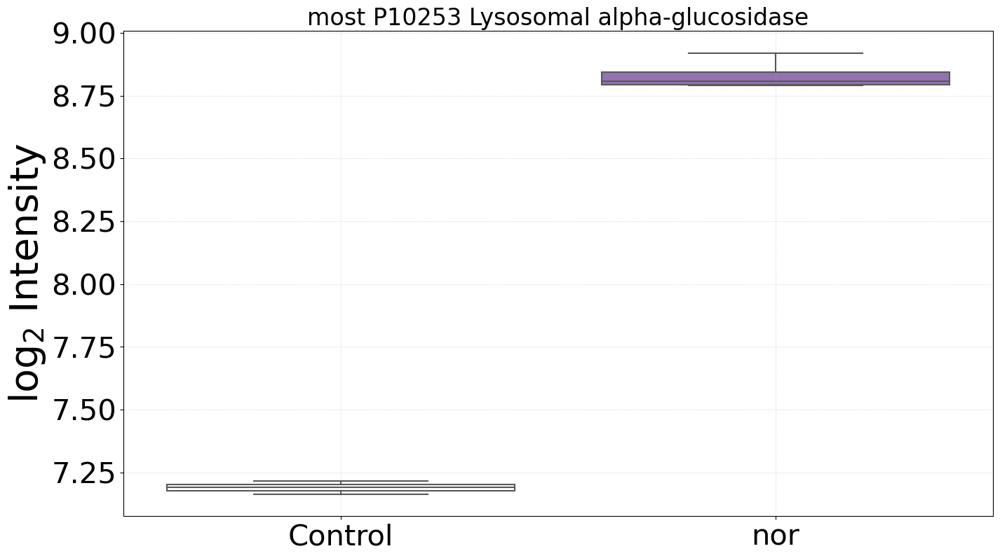

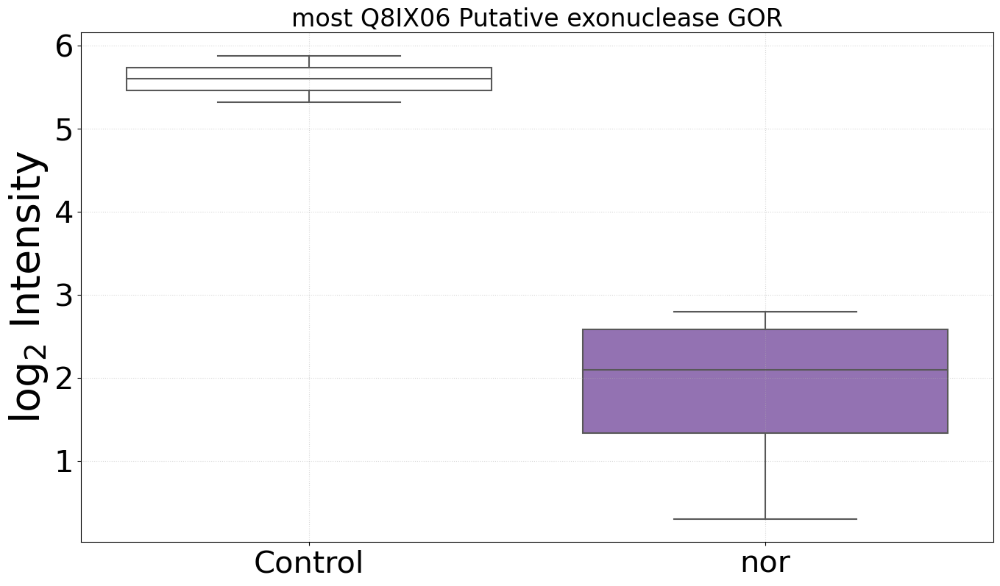

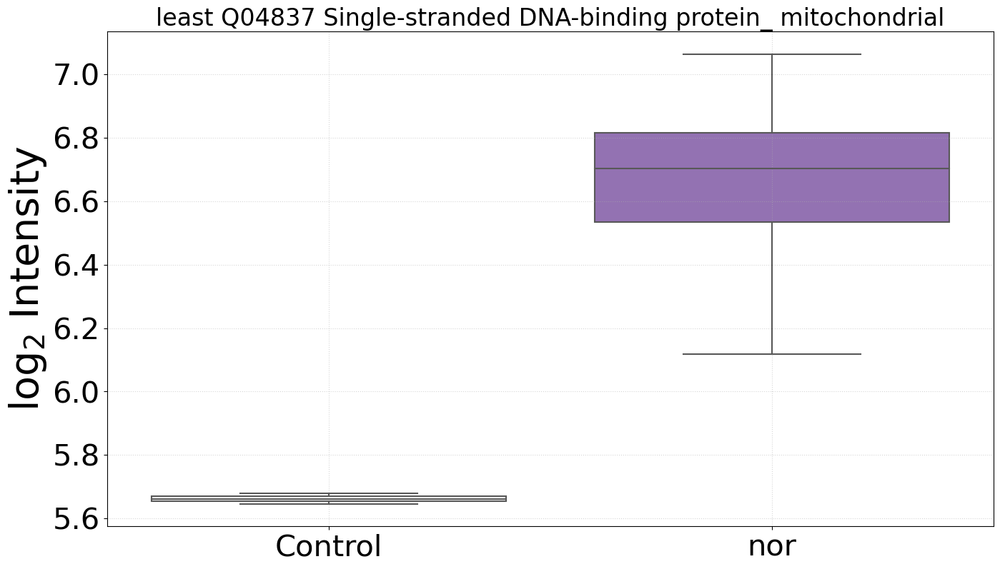

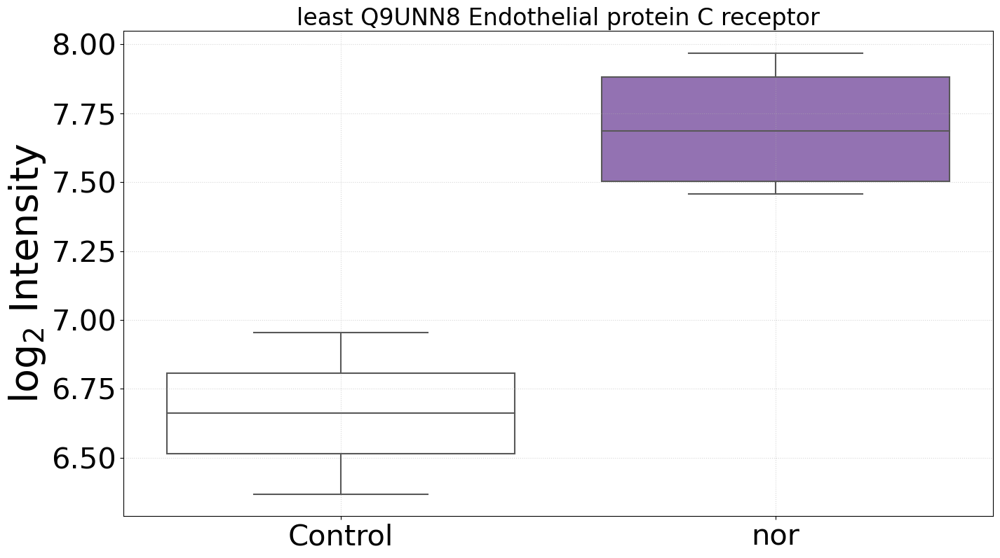

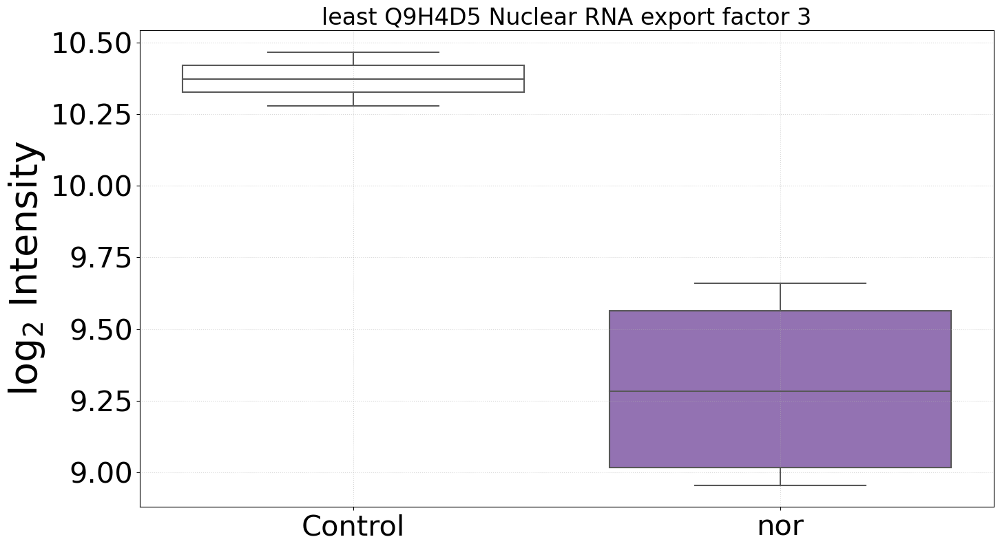

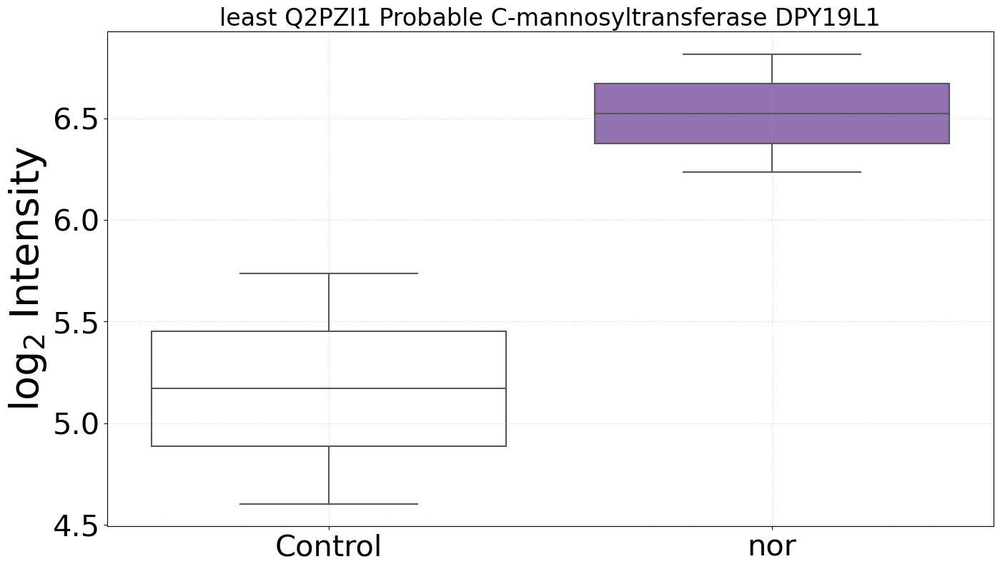

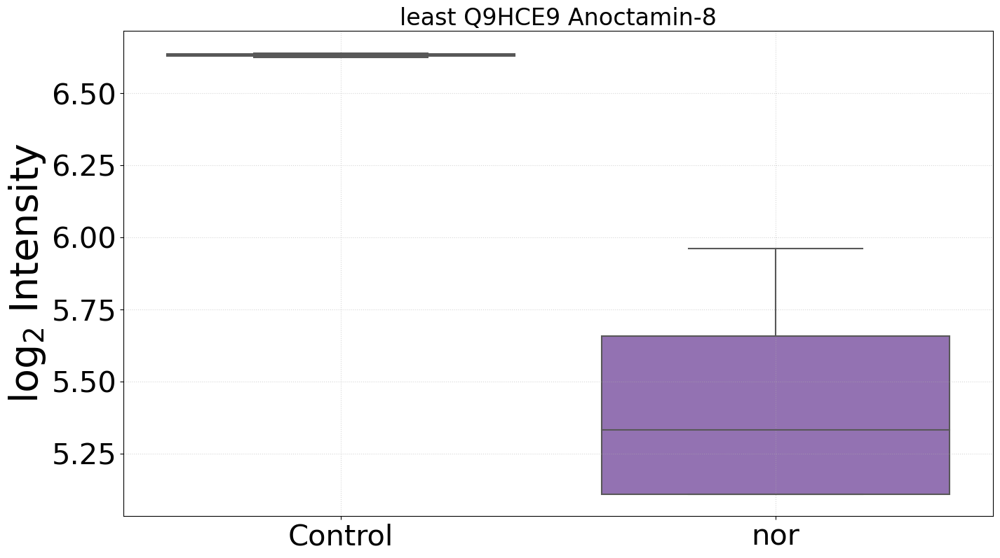

In [29]:
treatment_label = 'nor'
treatment_color = 'tab:purple'
control_samples = ['20220905_ARNAR_' + element for element in ['010', '011']]
treated_samples = ['20220905_ARNAR_' + element for element in ['020', '019', '014', '013']]
nor_response = comparison_function('4h', detected_biomarkers, qndf, treatment_label, treatment_color, control_samples, treated_samples)

P before correction 0.0 1.0
Benjamini-Hochberg correction
epsilon: 2.663842310444469
23127	Q8IYK4	Procollagen galactosyltransferase 2	1.1370761886338983	1.545597274521707

5617	P01236	Prolactin	2.335454675488773	1.4610523229066463

3106	P01889	HLA class I histocompatibility antigen_ B alpha chain	1.0060968574027136	1.788825166480277

81027	Q9H4B7	Tubulin beta-1 chain	1.1387677398456235	1.6217783132031256

55862	Q9NTX5	Ethylmalonyl-CoA decarboxylase	6.160972565578988	1.6205247866773522

326624	Q96AX2	Ras-related protein Rab-37	1.367827926963507	1.1240667944314988

9738	O43303	Centriolar coiled-coil protein of 110 kDa	4.959688265534082	1.5219609839739479

4216	Q9Y6R4	Mitogen-activated protein kinase kinase kinase 4	-1.8079637127494497	1.683828196611422

2548	P10253	Lysosomal alpha-glucosidase	1.0367403682389202	1.9071889915221591

126205	Q86W28	NACHT_ LRR and PYD domains-containing protein 8	-1.8248634031691227	1.8137088245264827


BIOMAKER
 P05362 ICAM-1 2 0.17287886407309852 black 

97

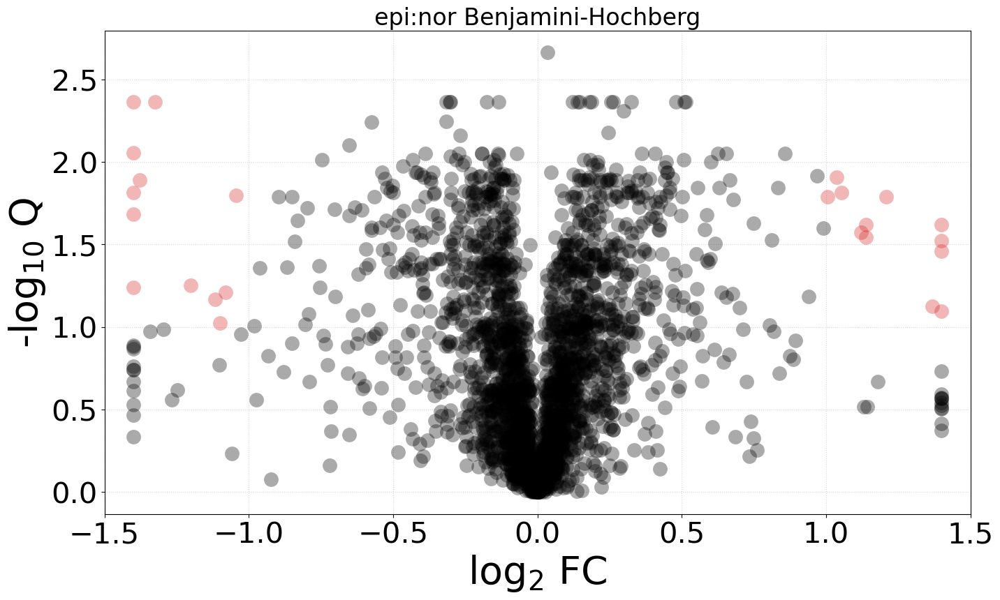

24 proteins respond to treatment


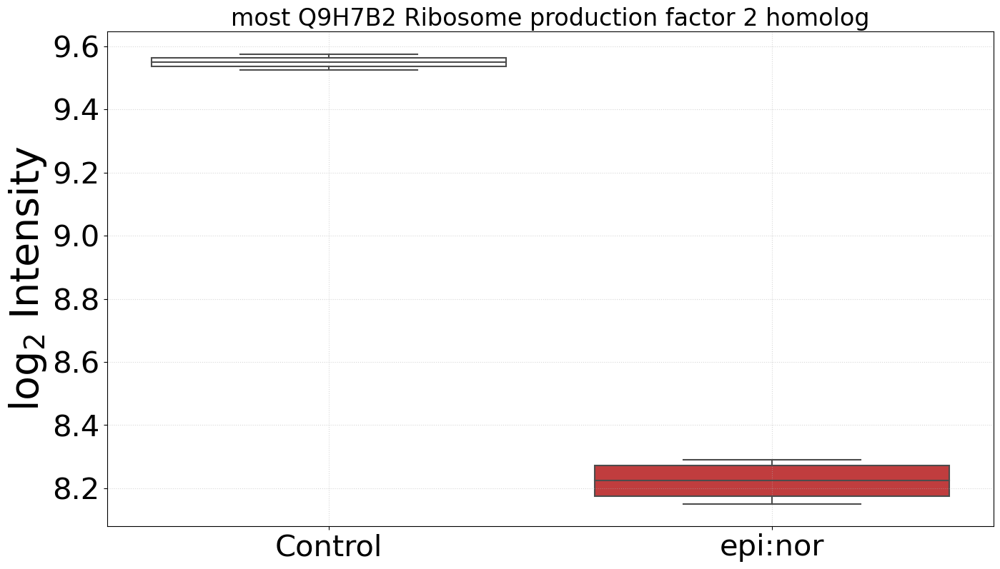

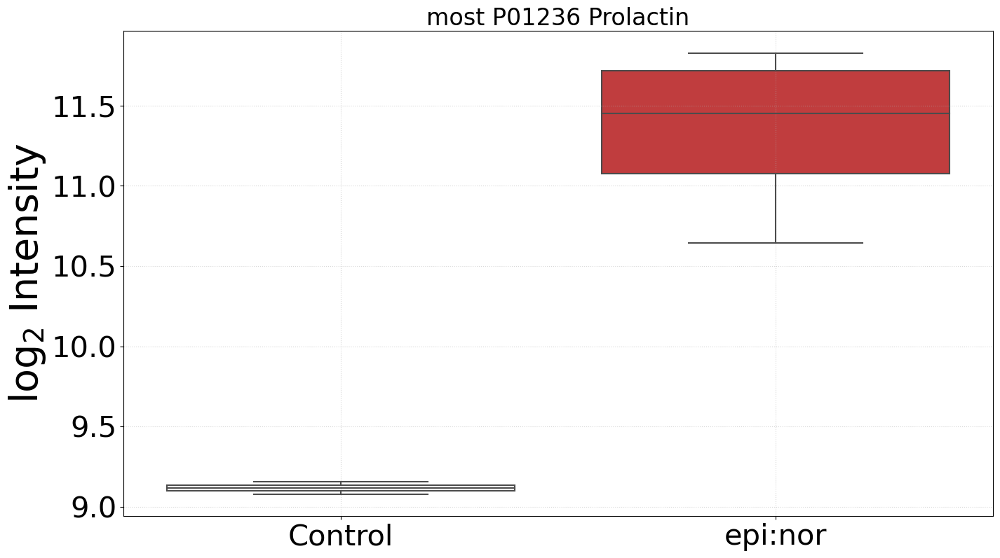

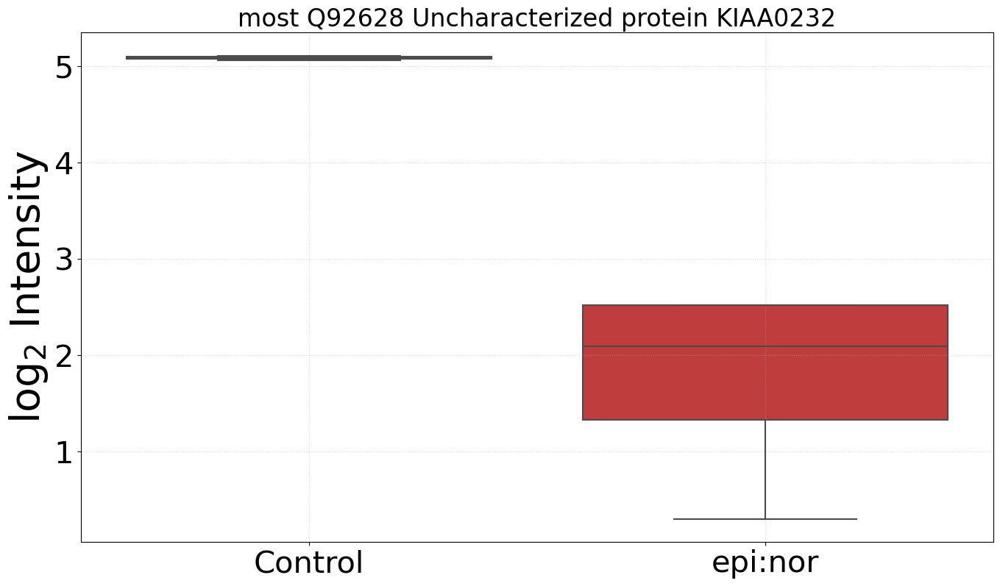

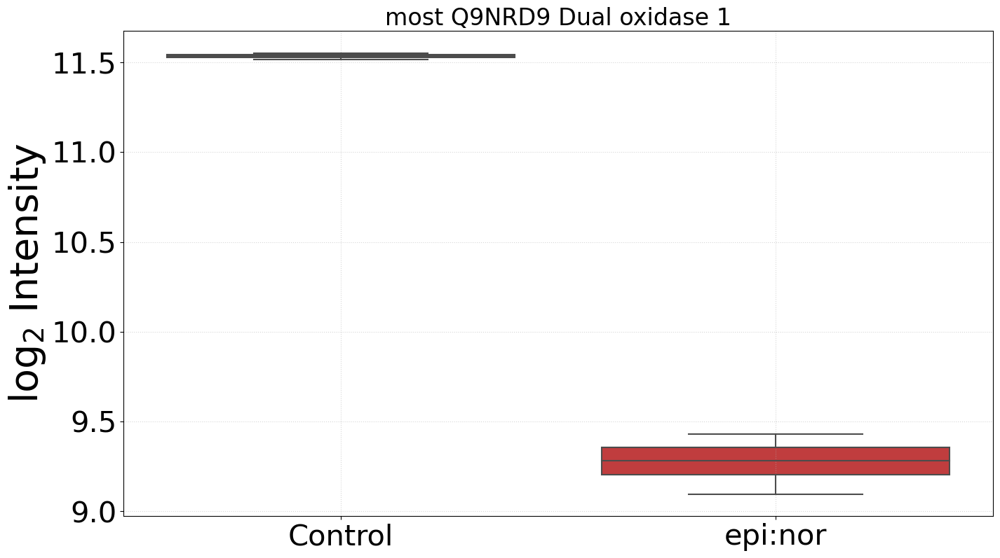

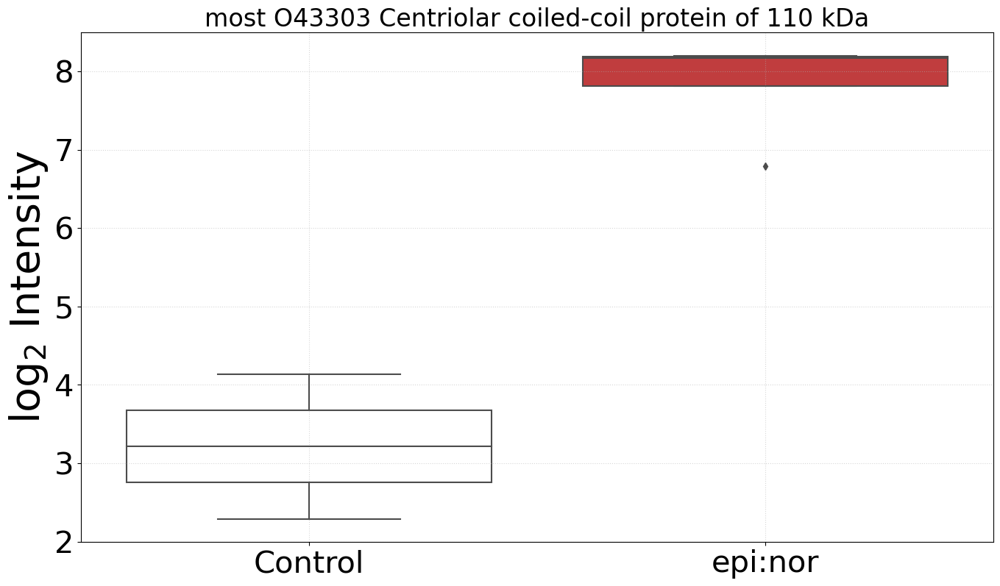

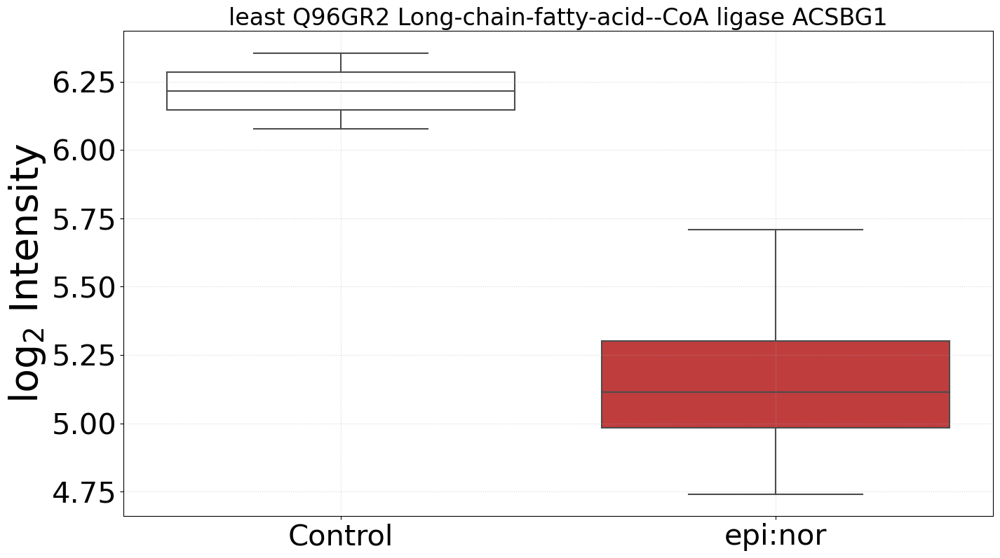

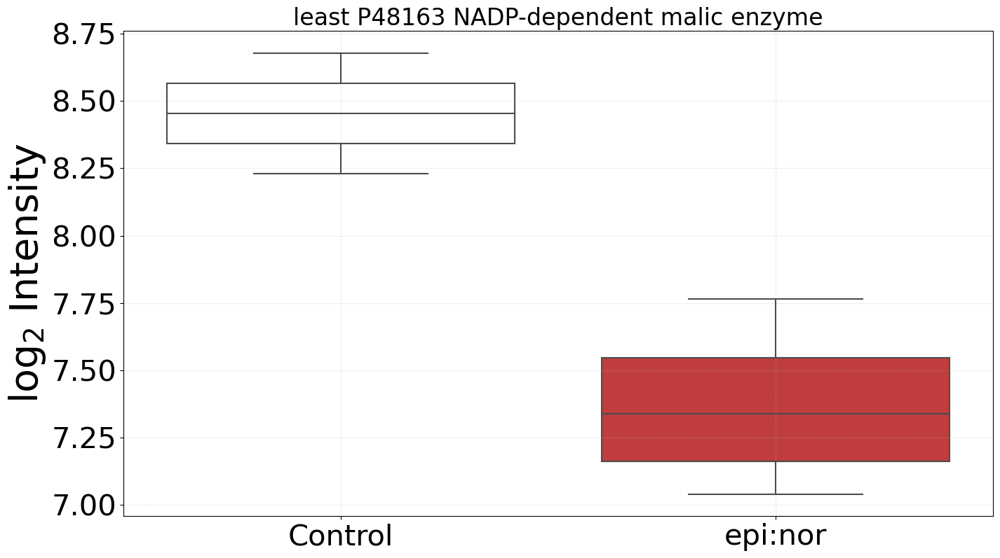

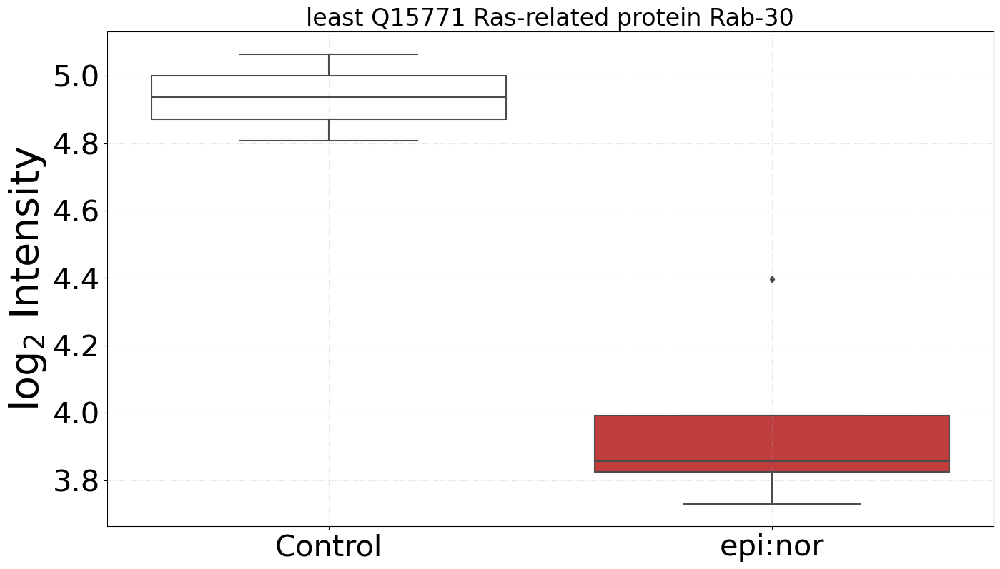

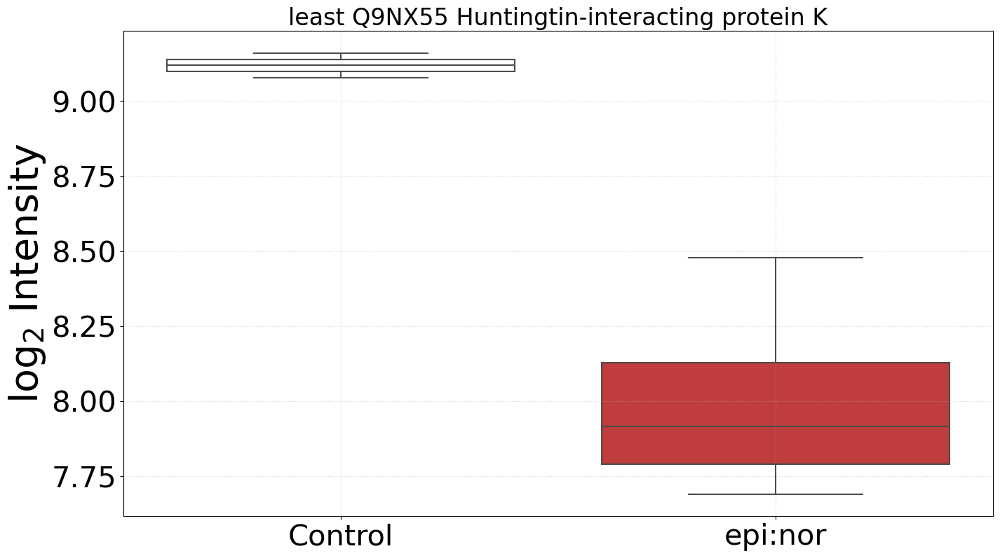

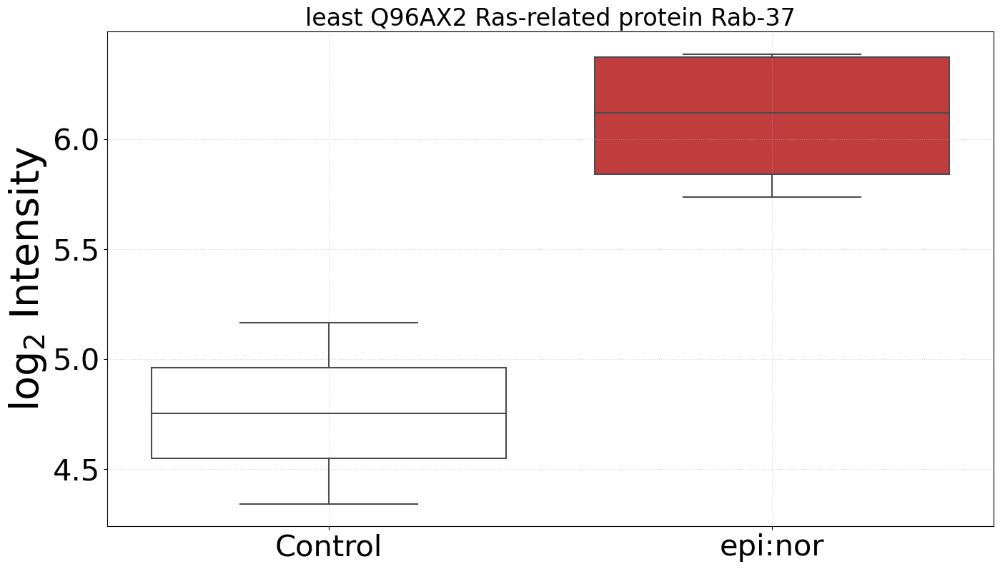

In [30]:
treatment_label = 'epi:nor'
treatment_color = 'tab:red'
control_samples = ['20220905_ARNAR_' + element for element in ['010', '011']]
treated_samples = ['20220905_ARNAR_' + element for element in ['025', '024', '026', '027']]
epinor_response = comparison_function('4h', detected_biomarkers, qndf, treatment_label, treatment_color, control_samples, treated_samples)

### Venn diagram of treatmens

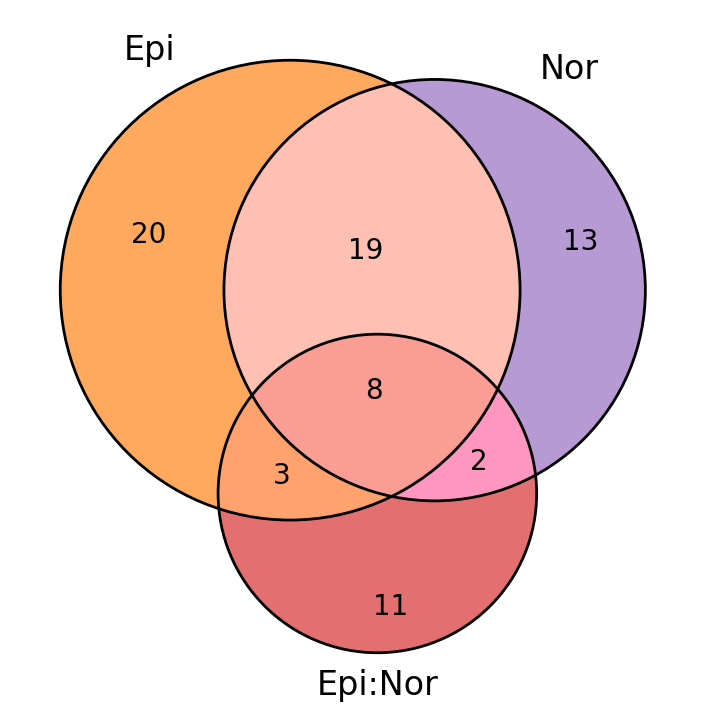

In [31]:
matplotlib_venn.venn3(
    [set(epi_response), set(nor_response), set(epinor_response)], 
    set_labels=('Epi', 'Nor', 'Epi:Nor'),
    set_colors=('tab:orange', 'tab:purple', 'tab:red'),
    alpha=2/3
)
matplotlib_venn.venn3_circles(
    [set(epi_response), set(nor_response), set(epinor_response)],
    linewidth=2
)
matplotlib.pyplot.show()

# LATE samples

### define metadata

In [32]:
metadata = {}

metadata['24h control'] = ['20220905_ARNAR_022', '20220905_ARNAR_023', '20220905_ARNAR_037', '20220905_ARNAR_038', '20220905_ARNAR_067', '20220905_ARNAR_068']

metadata['24h epi'] = ['20220905_ARNAR_031', '20220905_ARNAR_040']

metadata['24h nor'] = ['20220905_ARNAR_028', '20220905_ARNAR_053', '20220905_ARNAR_054', '20220905_ARNAR_062']

metadata['24h epinor'] = ['20220905_ARNAR_006', '20220905_ARNAR_007', '20220905_ARNAR_033', '20220905_ARNAR_034', '20220905_ARNAR_055']

metadata['24h TNFa'] = ['20220905_ARNAR_015', '20220905_ARNAR_016', '20220905_ARNAR_017', '20220905_ARNAR_018', '20220905_ARNAR_042', '20220905_ARNAR_043']

all_sample_names = [element for sublist in list(metadata.values()) for element in sublist]
print(len(all_sample_names))

23


### manipulate data

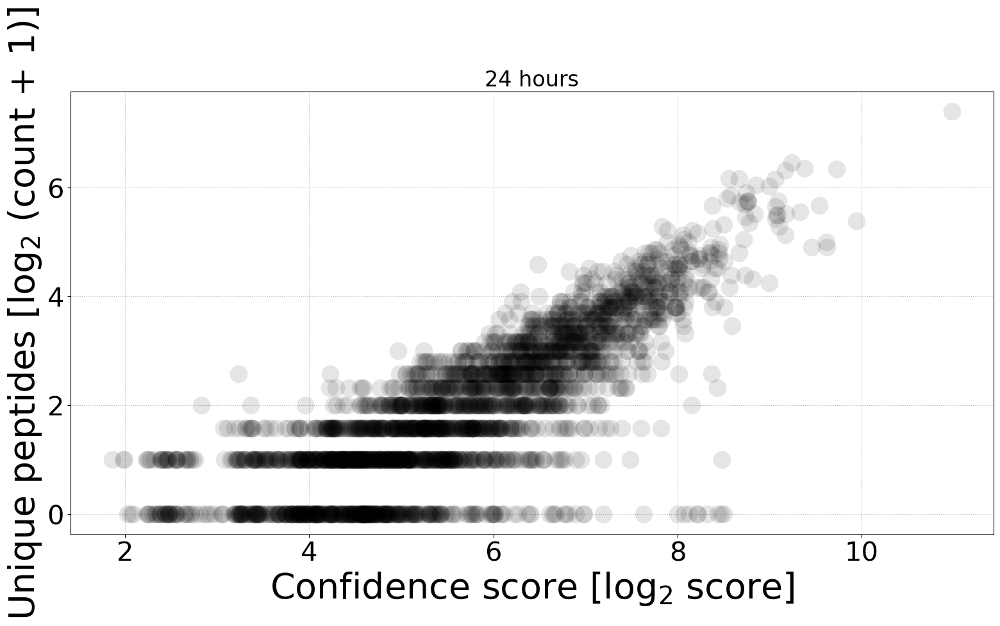

In [33]:
x = numpy.log2(df24['Confidence score'])
y = numpy.log2(df24['Unique peptides']+1)
               
matplotlib.pyplot.plot(x, y, 'o', color='black', alpha=1/10, markeredgecolor='None', ms=20)

matplotlib.pyplot.xlabel('Confidence score [log$_2$ score]')
matplotlib.pyplot.ylabel('Unique peptides [log$_2$ (count + 1)]')
matplotlib.pyplot.grid(ls=':')
matplotlib.pyplot.title('24 hours')
matplotlib.pyplot.tight_layout()

Arbitrary thresholds for minimal identifications:
- X-axis: a score of >= 50.
- Y-axis: at least three unique peptides.

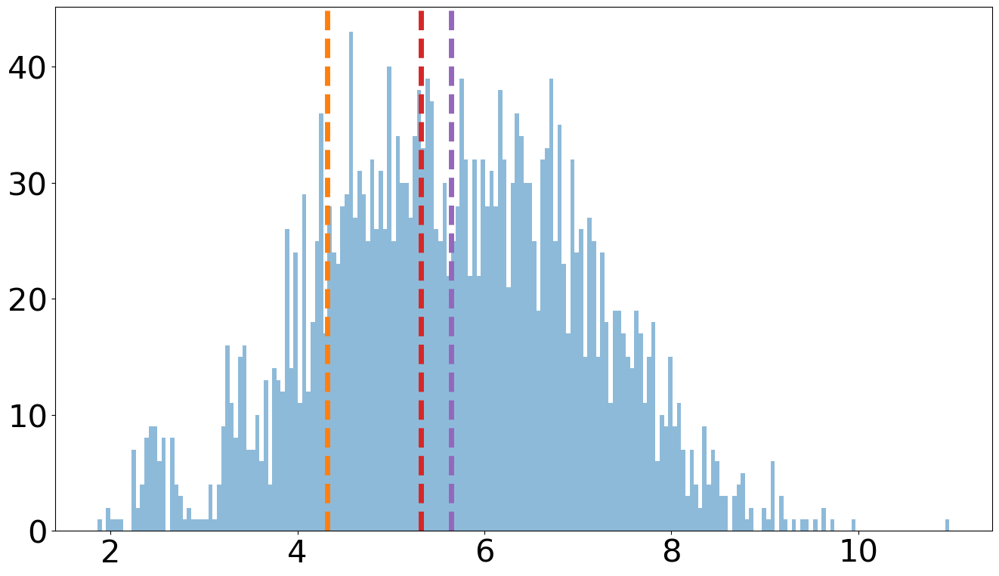

In [34]:
matplotlib.pyplot.hist(numpy.log2(df24['Confidence score']), bins=200, alpha=1/2, color='tab:blue')
matplotlib.pyplot.axvline(x=numpy.log2(20), lw=5, ls='--', color='tab:orange')
matplotlib.pyplot.axvline(x=numpy.log2(40), lw=5, ls='--', color='tab:red')
matplotlib.pyplot.axvline(x=numpy.log2(50), lw=5, ls='--', color='tab:purple')
matplotlib.pyplot.show()

In [35]:
new24 = df24[(df24['Unique peptides'] >= 1) & (df24['Confidence score'] >= 0)]
print(new24.shape)

working_labels = [label for label in new24.columns if label in all_sample_names]

new24 = numpy.log2(new24.loc[:, working_labels] + 1)
print(new24.shape)
new24

(2241, 83)
(2241, 23)


,20220905_ARNAR_022,20220905_ARNAR_023,20220905_ARNAR_037,20220905_ARNAR_038,20220905_ARNAR_067,20220905_ARNAR_068,20220905_ARNAR_015,20220905_ARNAR_016,20220905_ARNAR_017,20220905_ARNAR_018,...,20220905_ARNAR_040,20220905_ARNAR_028,20220905_ARNAR_053,20220905_ARNAR_054,20220905_ARNAR_062,20220905_ARNAR_006,20220905_ARNAR_007,20220905_ARNAR_033,20220905_ARNAR_034,20220905_ARNAR_055
Accession,,,,,,,,,,,,,,,,,,,,,
P05362,12.136222,12.096396,12.003133,12.087096,12.063444,11.987530,15.026937,15.053167,14.758016,14.818401,...,12.168192,12.025421,12.140696,12.153072,12.131470,12.209911,12.173073,12.081752,12.053523,12.115003
P00918,3.269640,3.958573,4.044389,2.560914,2.581108,2.400893,3.383701,2.577989,3.148677,2.342278,...,9.683048,8.731587,9.415135,9.089140,9.501715,8.821348,8.778111,9.332541,9.174527,9.271194
Q00005,9.832451,9.948856,9.968576,9.886719,10.013001,9.969310,9.883095,9.763771,9.861647,10.005034,...,10.211146,9.874248,9.813731,9.748196,9.750735,10.542259,10.457803,10.814234,10.682489,10.547479
P07093,9.780167,9.588543,9.737447,9.707263,9.999880,9.655704,9.096160,9.124853,9.358033,9.124976,...,10.545446,10.174792,10.416936,10.258240,10.513416,10.098600,10.134208,10.171767,10.131861,10.476628
Q8N0U7,9.572838,9.332522,9.741558,9.213716,9.017280,9.037082,9.007429,9.010905,9.136829,9.068215,...,10.969074,10.451121,11.064807,10.701182,10.684393,10.009493,9.961427,10.231056,10.149908,10.067314
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Q9NTJ4,12.825811,12.821668,12.951944,13.074719,13.008411,12.993811,12.781201,12.802997,12.775352,12.810090,...,12.902191,12.939043,12.998068,13.096740,12.946926,12.694997,12.748398,13.039226,13.078984,13.240375
P60981,12.949406,12.950136,12.855742,12.883994,13.061916,12.963713,12.877931,12.710013,12.816800,12.875271,...,12.950501,12.884901,12.984830,12.872015,12.908746,12.876472,12.799626,13.036330,12.900035,12.876138
Q8TBY8,10.843945,10.750298,10.496738,10.660448,10.633689,10.464231,10.523887,10.402698,10.761598,10.669802,...,10.759902,10.848728,10.594967,10.549554,10.559981,10.499731,10.531275,10.851241,10.748503,10.614755


### visualize data

210
20220905_ARNAR_006
20220905_ARNAR_007
20.44118100653228


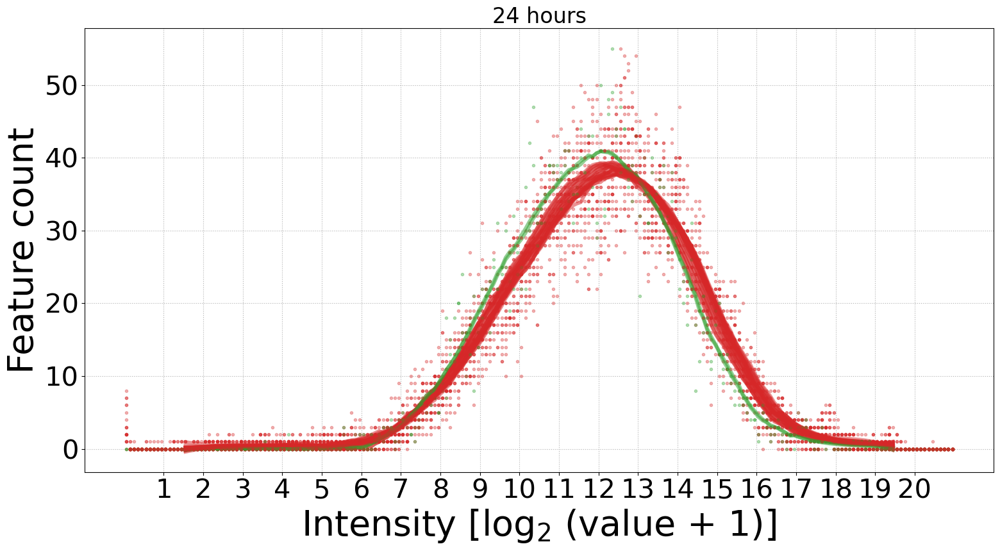

In [36]:
found_max = 21
number_of_bins = found_max * 10
margin = 15
print(number_of_bins)

absolute_max = 0
plotting_x = []; plotting_y = []
most_likely_early = []

for sample in new24.columns:
        
    intensities = new24.loc[:, sample]
    
    # histogram
    hist, bin_edges = numpy.histogram(intensities, bins=number_of_bins, range=(0, found_max))
    half_bin = (bin_edges[1] - bin_edges[0])/2
    x = bin_edges + half_bin
    x = x[:-1]
    
    # curve fitting
    plotting_x = x[margin:-margin]
    plotting_hist = hist[margin:-margin]
    yhat = scipy.signal.savgol_filter(plotting_hist, 51, 3)
    
    # storing info to quantify bias
    most_likely_intensity = x[numpy.argmax(yhat)]
    most_likely_early.append(most_likely_intensity)
    
    
    # plotting
    the_color = 'tab:red'
    if '006' in sample or '007' in sample:
        the_color = 'tab:green'
        print(sample)
    matplotlib.pyplot.plot(x, hist, '.', alpha=1/3, color=the_color)
    matplotlib.pyplot.plot(plotting_x, yhat, '-', lw=4, alpha=1/2, color=the_color)
    
    # check
    if max(intensities) > absolute_max:
        absolute_max = max(intensities)

# check print
print(absolute_max)

matplotlib.pyplot.xticks(range(1, 21))
matplotlib.pyplot.xlabel('Intensity [log$_2$ (value + 1)]')
matplotlib.pyplot.ylabel('Feature count')
matplotlib.pyplot.grid(ls=':')
matplotlib.pyplot.title('24 hours')
matplotlib.pyplot.tight_layout()

### normalization

In [37]:
#
# quantile normalization 
# taken from https://cmdlinetips.com/2020/06/computing-quantile-normalization-in-python/
#

# step 1/3: sorting sample values
df_sorted = pandas.DataFrame(numpy.sort(new24.values, axis=0), index=new24.index, columns=new24.columns)
# step 2/3: averaging rank values across samples
df_mean = df_sorted.mean(axis=1)
df_mean.index = numpy.arange(1, len(df_mean) + 1)
# step 3/3: re-ordering samples
qndf = new24.rank(method="min").stack().astype(int).map(df_mean).unstack()

### distributions after normalization

210
19.408569280865084


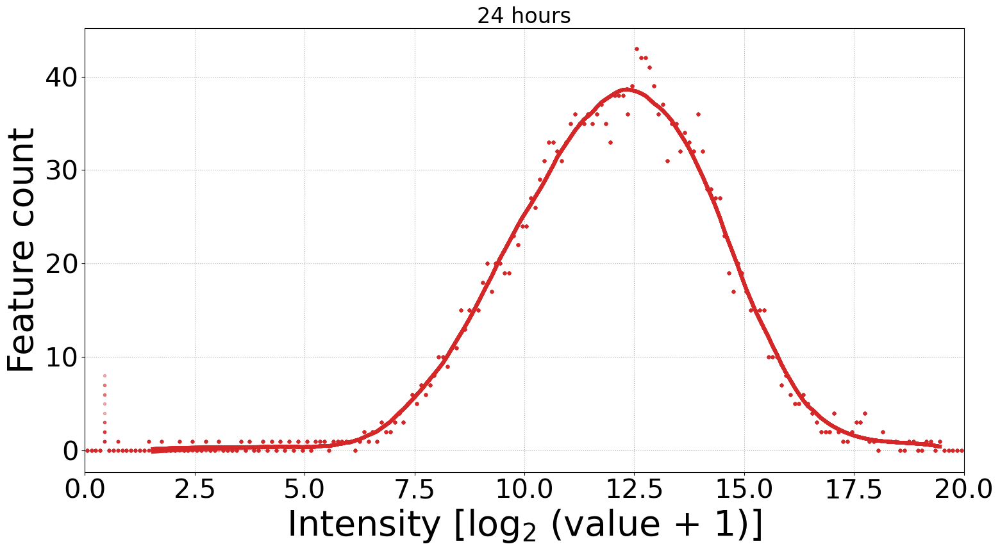

In [38]:
found_max = 21
number_of_bins = found_max * 10
margin = 15
print(number_of_bins)

absolute_max = 0
plotting_x = []; plotting_y = []
most_likely_early = []

for sample in qndf.columns:
        
    intensities = qndf.loc[:, sample]
    
    # histogram
    hist, bin_edges = numpy.histogram(intensities, bins=number_of_bins, range=(0, found_max))
    half_bin = (bin_edges[1] - bin_edges[0])/2
    x = bin_edges + half_bin
    x = x[:-1]
    
    # curve fitting
    plotting_x = x[margin:-margin]
    plotting_hist = hist[margin:-margin]
    yhat = scipy.signal.savgol_filter(plotting_hist, 51, 3)
    
    # storing info to quantify bias
    most_likely_intensity = x[numpy.argmax(yhat)]
    most_likely_early.append(most_likely_intensity)
    
    
    # plotting
    the_color = 'tab:red'
    matplotlib.pyplot.plot(x, hist, '.', alpha=1/3, color=the_color)
    matplotlib.pyplot.plot(plotting_x, yhat, '-', lw=4, alpha=1/2, color=the_color)
    
    # check
    if max(intensities) > absolute_max:
        absolute_max = max(intensities)

# check print
print(absolute_max)

matplotlib.pyplot.xlim(0,20)
matplotlib.pyplot.xlabel('Intensity [log$_2$ (value + 1)]')
matplotlib.pyplot.ylabel('Feature count')
matplotlib.pyplot.grid(ls=':')
matplotlib.pyplot.title('24 hours')
matplotlib.pyplot.tight_layout()

In [39]:
### biomarker analysis

In [40]:
detected_biomarkers = {}
for biomarker in biomarkers.keys():
    uniprot_id = biomarkers[biomarker]
    print('working with biomarker {}, uniprot {}'.format(biomarker, uniprot_id))
    for element in df24.index:
        if uniprot_id in element:
            print('\t{}, peptide count {}, score {}'.format(element, df24.loc[element, 'Unique peptides'], df24.loc[element, 'Confidence score']))
            detected_biomarkers[element] = biomarker

detected_biomarkers.keys()

working with biomarker endothelin, uniprot P05305
working with biomarker PAI-1, uniprot P05121
	P05121, peptide count 19, score 160.2717
working with biomarker uPA, uniprot P00749
working with biomarker VCAM-1, uniprot P19320
working with biomarker L-selectin, uniprot P14151
working with biomarker Ang2, uniprot O15123
working with biomarker VEGFr1, uniprot P17948
working with biomarker ICAM-2, uniprot P13598
	P13598, peptide count 3, score 61.8311
working with biomarker tie2, uniprot Q02763
working with biomarker IL-6, uniprot P05231
working with biomarker E-selectin, uniprot P16581
working with biomarker ICAM-1, uniprot P05362
	P05362, peptide count 14, score 73.6527
working with biomarker P-selectin, uniprot P16109
working with biomarker Ang1, uniprot Q15389
working with biomarker vWF, uniprot P04275
working with biomarker PDGF, uniprot P01127
working with biomarker endocan, uniprot Q9NQ30
working with biomarker TNFa, uniprot P01375
working with biomarker VEGFa, uniprot P15692


dict_keys(['P05121', 'P13598', 'P05362'])

P05121 24h control
P05121 24h epi
P05121 24h nor
P05121 24h epinor
P05121 24h TNFa
PAI-1 [15.77791873779686, 16.506018652668043, 16.182219676588296, 16.073347514233873, 15.851509838137147]
P13598 24h control
P13598 24h epi
P13598 24h nor
P13598 24h epinor
P13598 24h TNFa
ICAM-2 [11.13755320726791, 11.456592417263156, 11.206232688507658, 11.139009390716408, 11.12209357215333]
P05362 24h control
P05362 24h epi
P05362 24h nor
P05362 24h epinor
P05362 24h TNFa
ICAM-1 [12.000707581568099, 12.146372944033718, 12.038355926843032, 12.05953126791627, 15.043300359444467]
{'PAI-1': [0.0, 0.7280999148711835, 0.4043009387914367, 0.2954287764370136, 0.0735911003402876], 'ICAM-2': [0.0, 0.31903920999524615, 0.06867948123974799, 0.0014561834484982938, -0.015459635114579484], 'ICAM-1': [0.0, 0.14566536246561945, 0.03764834527493299, 0.05882368634817148, 3.0425927778763686]}


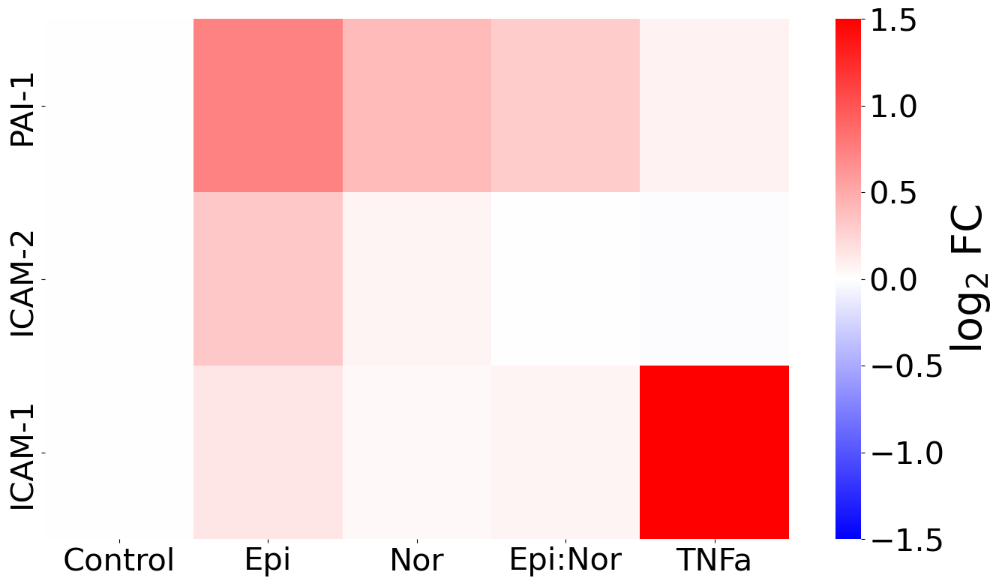

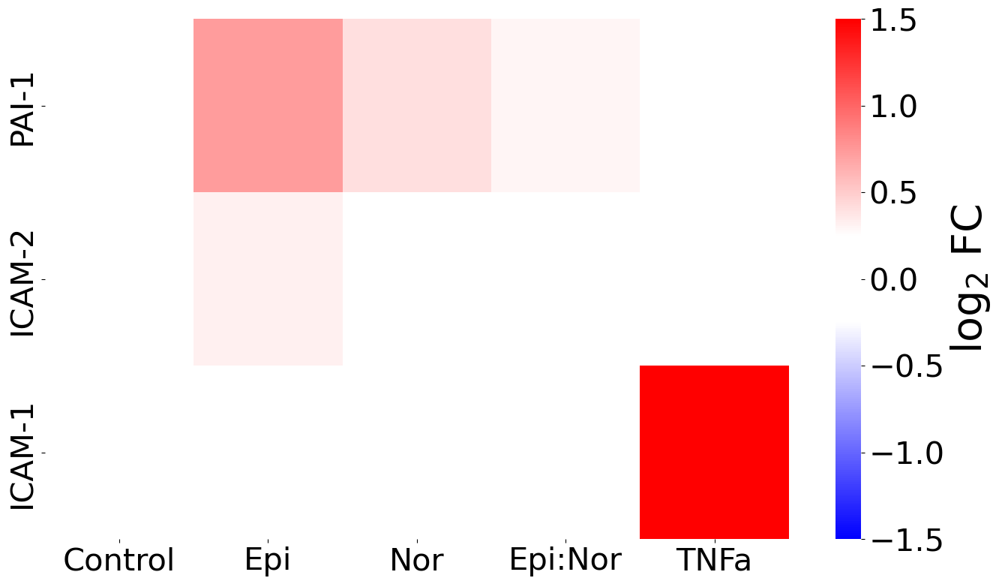

In [41]:
# gererate data for heatmap
heatmap_data = {}
for marker in detected_biomarkers.keys():
    heatmap_data[detected_biomarkers[marker]] = []
    for treatment in metadata.keys():
        print(marker, treatment)
        log2_intensity = numpy.median(qndf.loc[marker, metadata[treatment]].values)
        heatmap_data[detected_biomarkers[marker]].append(log2_intensity)
    print(detected_biomarkers[marker], heatmap_data[detected_biomarkers[marker]])

for biomarker in heatmap_data:
    reference = heatmap_data[biomarker][0]
    for i in range(len(heatmap_data[biomarker])):
        heatmap_data[biomarker][i] = heatmap_data[biomarker][i] - reference
print(heatmap_data)
heatmap_df = pandas.DataFrame.from_dict(heatmap_data).transpose()
heatmap_df.columns = ['Control', 'Epi', 'Nor', 'Epi:Nor', 'TNFa']

colors = [(0, "blue"), (0.5-(1/12), "white"), (0.5+(1/12), "white"), (1, "red")]
bwwr = matplotlib.colors.LinearSegmentedColormap.from_list("bwwr", colors)

seaborn.heatmap(data=heatmap_df, cmap='bwr', vmin=-1.5, vmax=1.5, cbar_kws={'label':'log$_2$ FC'})
matplotlib.pyplot.show()

seaborn.heatmap(data=heatmap_df, cmap=bwwr, vmin=-1.5, vmax=1.5, cbar_kws={'label':'log$_2$ FC'})
matplotlib.pyplot.show()

### PCA

[0.31572255 0.16064776]


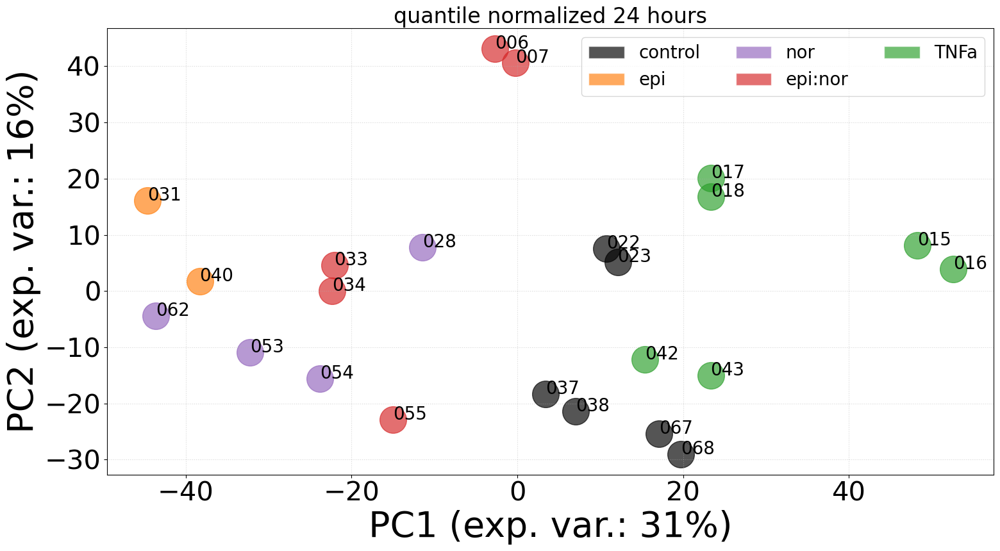

In [42]:
# quantile normalized all
transpose = qndf.transpose()
scaled_data = sklearn.preprocessing.StandardScaler().fit_transform(transpose)
model = sklearn.decomposition.PCA(n_components=2)
locations = model.fit_transform(scaled_data)
explained = model.explained_variance_ratio_
print(explained)

for i in range(len(locations)):
    
    the_marker = 'o'
    the_label = qndf.columns[i].split('_')[-1]
        
    if qndf.columns[i] in metadata['24h control']:
        the_color = 'black'
    elif qndf.columns[i] in metadata['24h epi']:
        the_color = 'tab:orange'
    elif qndf.columns[i] in metadata['24h nor']:
        the_color = 'tab:purple'
    elif qndf.columns[i] in metadata['24h epinor']:
        the_color = 'tab:red'
    elif qndf.columns[i] in metadata['24h TNFa']:
        the_color = 'tab:green'
    else:
        raise ValueError('sample not classified')
    
    matplotlib.pyplot.scatter(locations[i,0], locations[i,1], s=900, c=the_color, marker=the_marker, alpha=2/3)
    matplotlib.pyplot.text(locations[i, 0], locations[i, 1], the_label)
    
legend_elements = [ 
    matplotlib.patches.Patch(facecolor='black', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:orange', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:purple', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:red', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:green', edgecolor='white', alpha=2/3)
]
matplotlib.pyplot.legend(legend_elements, ['control', 'epi', 'nor', 'epi:nor', 'TNFa'], ncol=3)

matplotlib.pyplot.xlabel('PC1 (exp. var.: {}%)'.format(int(explained[0]*100)))
matplotlib.pyplot.ylabel('PC2 (exp. var.: {}%)'.format(int(explained[1]*100)))
matplotlib.pyplot.grid(alpha=0.5, ls=':')
matplotlib.pyplot.title('quantile normalized 24 hours')
matplotlib.pyplot.tight_layout()

[0.40669762 0.21982371]


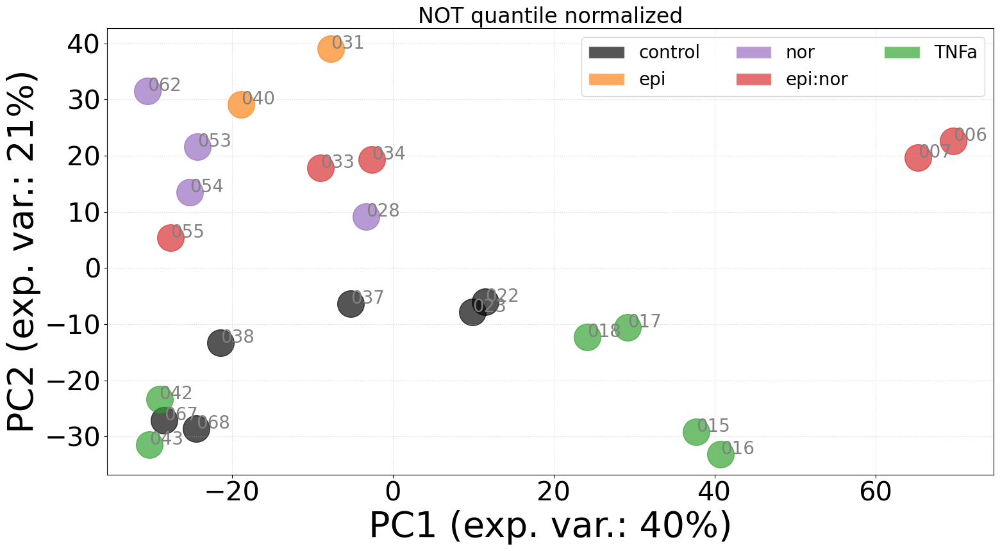

In [43]:
# non-quantile normalized all
transpose = new24.transpose()
scaled_data = sklearn.preprocessing.StandardScaler().fit_transform(transpose)
model = sklearn.decomposition.PCA(n_components=2)
locations = model.fit_transform(scaled_data)
explained = model.explained_variance_ratio_
print(explained)

for i in range(len(locations)):
    
    the_marker = 'o'
        
    if qndf.columns[i] in metadata['24h control']:
        the_color = 'black'
    elif qndf.columns[i] in metadata['24h epi']:
        the_color = 'tab:orange'
    elif qndf.columns[i] in metadata['24h nor']:
        the_color = 'tab:purple'
    elif qndf.columns[i] in metadata['24h epinor']:
        the_color = 'tab:red'
    elif qndf.columns[i] in metadata['24h TNFa']:
        the_color = 'tab:green'
    else:
        raise ValueError('sample not classified')
        
    matplotlib.pyplot.scatter(locations[i,0], locations[i,1], s=900, c=the_color, marker=the_marker, alpha=2/3)
    
    the_label = new24.columns[i].split('_')[-1]
    matplotlib.pyplot.text(locations[i, 0], locations[i, 1], the_label, color='gray')

    
legend_elements = [
    matplotlib.patches.Patch(facecolor='black', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:orange', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:purple', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:red', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:green', edgecolor='white', alpha=2/3)
]
matplotlib.pyplot.legend(legend_elements, ['control', 'epi', 'nor', 'epi:nor', 'TNFa'], ncol=3)

matplotlib.pyplot.xlabel('PC1 (exp. var.: {}%)'.format(int(explained[0]*100)))
matplotlib.pyplot.ylabel('PC2 (exp. var.: {}%)'.format(int(explained[1]*100)))
matplotlib.pyplot.grid(alpha=0.5, ls=':')
matplotlib.pyplot.title('NOT quantile normalized')

matplotlib.pyplot.tight_layout()

7
['20220905_ARNAR_022', '20220905_ARNAR_023', '20220905_ARNAR_042', '20220905_ARNAR_043', '20220905_ARNAR_006', '20220905_ARNAR_007', '20220905_ARNAR_028']
(2241, 16)
[0.37897234 0.17605134]


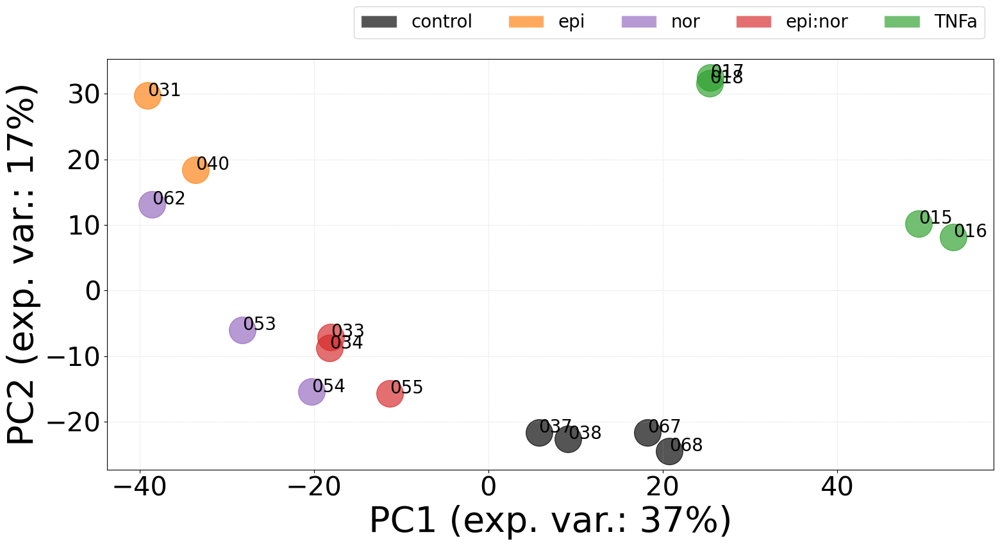

In [44]:
# excluding arbitrary samples
excluded_sample_tags = ['022', '023', '042', '043', '006', '007', '028']
print(len(excluded_sample_tags)) # should be 7
excluded_samples = ['20220905_ARNAR_' + element for element in excluded_sample_tags]
print(excluded_samples)
simplified_df = new24.drop(excluded_samples, axis=1)
print(simplified_df.shape)

# normalization
# step 1/3: sorting sample values
df_sorted = pandas.DataFrame(numpy.sort(simplified_df.values, axis=0), index=simplified_df.index, columns=simplified_df.columns)
# step 2/3: averaging rank values across samples
df_mean = df_sorted.mean(axis=1)
df_mean.index = numpy.arange(1, len(df_mean) + 1)
# step 3/3: re-ordering samples
qndf = simplified_df.rank(method="min").stack().astype(int).map(df_mean).unstack()

# PCA
transpose = qndf.transpose()
scaled_data = sklearn.preprocessing.StandardScaler().fit_transform(transpose)
model = sklearn.decomposition.PCA(n_components=2)
locations = model.fit_transform(scaled_data)
explained = model.explained_variance_ratio_
print(explained)

for i in range(len(locations)):
    
    the_marker = 'o'
    the_label = qndf.columns[i].split('_')[-1]
        
    if simplified_df.columns[i] in metadata['24h control']:
        the_color = 'black'
    elif simplified_df.columns[i] in metadata['24h epi']:
        the_color = 'tab:orange'
    elif simplified_df.columns[i] in metadata['24h nor']:
        the_color = 'tab:purple'
    elif simplified_df.columns[i] in metadata['24h epinor']:
        the_color = 'tab:red'
    elif simplified_df.columns[i] in metadata['24h TNFa']:
        the_color = 'tab:green'
    else:
        raise ValueError('sample not classified')
    
    matplotlib.pyplot.scatter(locations[i,0], locations[i,1], s=900, c=the_color, marker=the_marker, alpha=2/3)
    matplotlib.pyplot.text(locations[i, 0], locations[i, 1], the_label)
    
    
legend_elements = [ 
    matplotlib.patches.Patch(facecolor='black', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:orange', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:purple', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:red', edgecolor='white', alpha=2/3),
    matplotlib.patches.Patch(facecolor='tab:green', edgecolor='white', alpha=2/3)
]
matplotlib.pyplot.legend(legend_elements, ['control', 'epi', 'nor', 'epi:nor', 'TNFa'], ncol=5, bbox_to_anchor=(1, 1.15))

matplotlib.pyplot.xlabel('PC1 (exp. var.: {}%)'.format(int(explained[0]*100)))
matplotlib.pyplot.ylabel('PC2 (exp. var.: {}%)'.format(int(explained[1]*100)))
matplotlib.pyplot.grid(alpha=0.5, ls=':')
#matplotlib.pyplot.title('quantile normalized post 24 hours')
matplotlib.pyplot.tight_layout()

There is more intra distance within TNFa than across epi:nor and control.
The grouping of different treatmens does not align.

### make comparisons

P before correction 0.0 1.0
Benjamini-Hochberg correction
epsilon: 4.506744085204559

BIOMAKER
 P05362 ICAM-1 12 1.2545099213581876 black 

760	P00918	Carbonic anhydrase 2	5.979852517293335	2.3571110963890334

127795	Q8N0U7	Uncharacterized protein C1orf87	1.7912114389600244	1.7612461225748977

9690	Q15386	Ubiquitin-protein ligase E3C	1.7369515072484383	2.266932029580363

7127	Q03169	Tumor necrosis factor alpha-induced protein 2	1.1385700172857964	1.0628379936722459

25873	Q9Y3U8	60S ribosomal protein L36	-2.23151576287483	1.702855296491278

57600	Q9P278	Folliculin-interacting protein 2	2.4393555375530163	1.4795103878526632

26986	P11940;Q4VXU2	Polyadenylate-binding protein 1	-6.125629885353043	1.9841907512683066

10409	P80723	Brain acid soluble protein 1	-1.2954001362719723	2.3571110963890334

462	P01008	Antithrombin-III	2.6101766409528953	1.8812809304855704

5595	P27361	Mitogen-activated protein kinase 3	-1.047888119126224	2.3571110963890334

163081	Q8N184	Zinc finger protein 567	-1.5

30820	Q9NZI2	Kv channel-interacting protein 1	1.0724320260458242	1.182048870234103

58478	Q9UHY7	Enolase-phosphatase E1	7.565831337370954	1.9411134241629238

5276	O75830	Serpin I2	-2.4071229306262394	1.0126387482682997

23526	Q92619	Rho GTPase-activating protein 45	2.3774736519952917	1.9913441928856357

3991	Q05469	Hormone-sensitive lipase	7.420275955252379	3.0921609370789325

3720	Q92833	Protein Jumonji	-1.0762643781319419	1.850527412670529



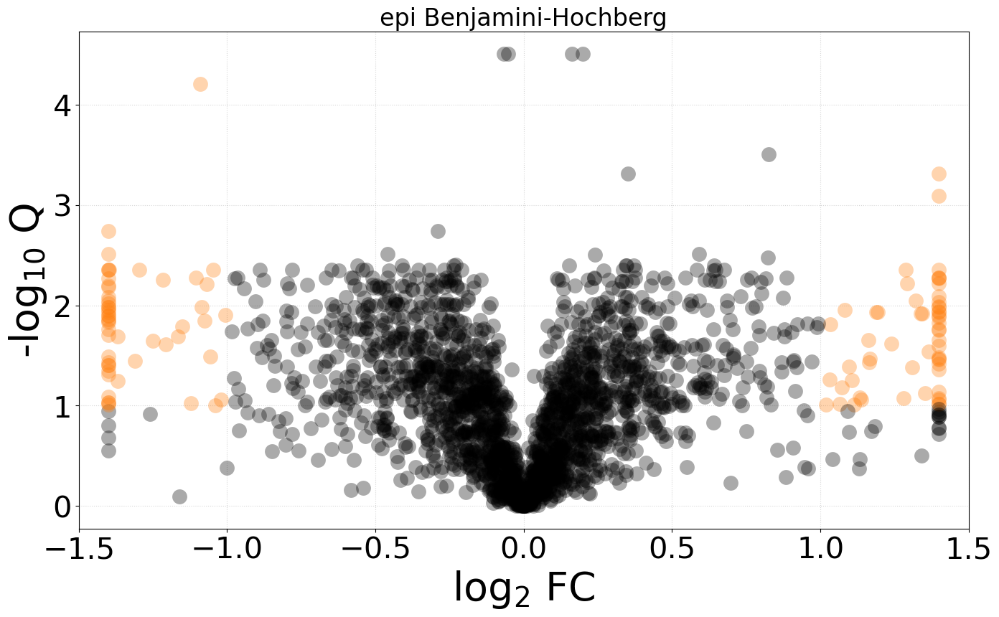

108 proteins respond to treatment


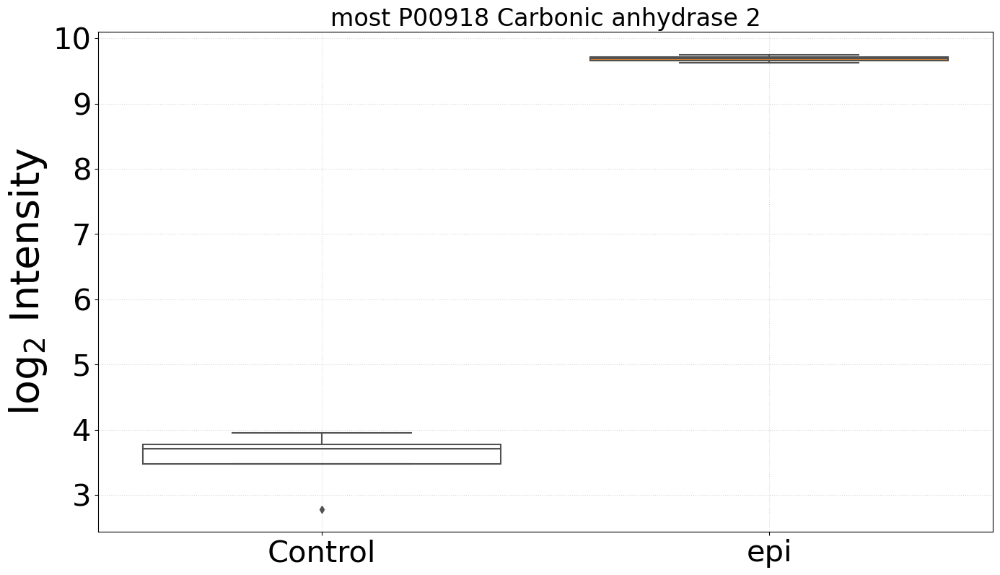

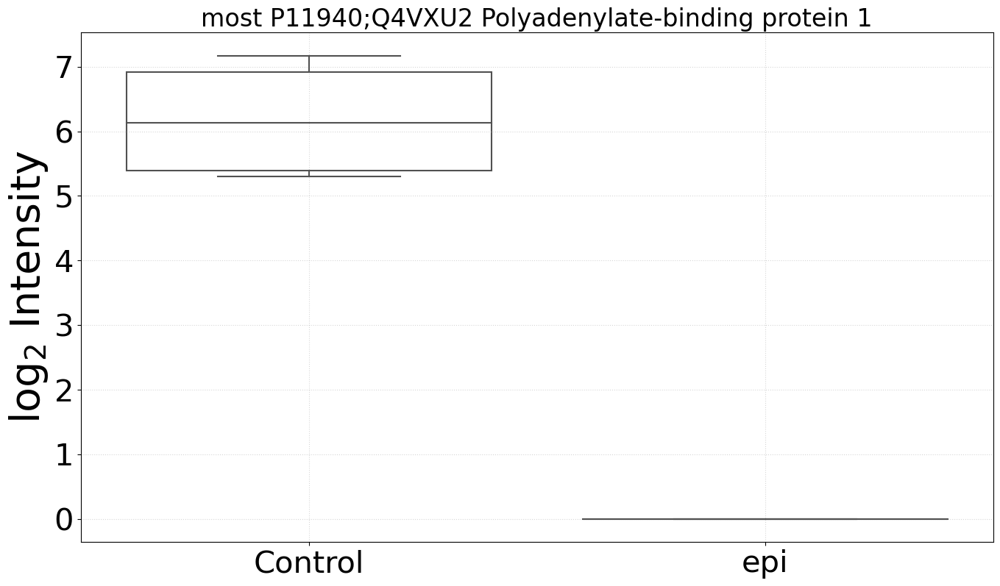

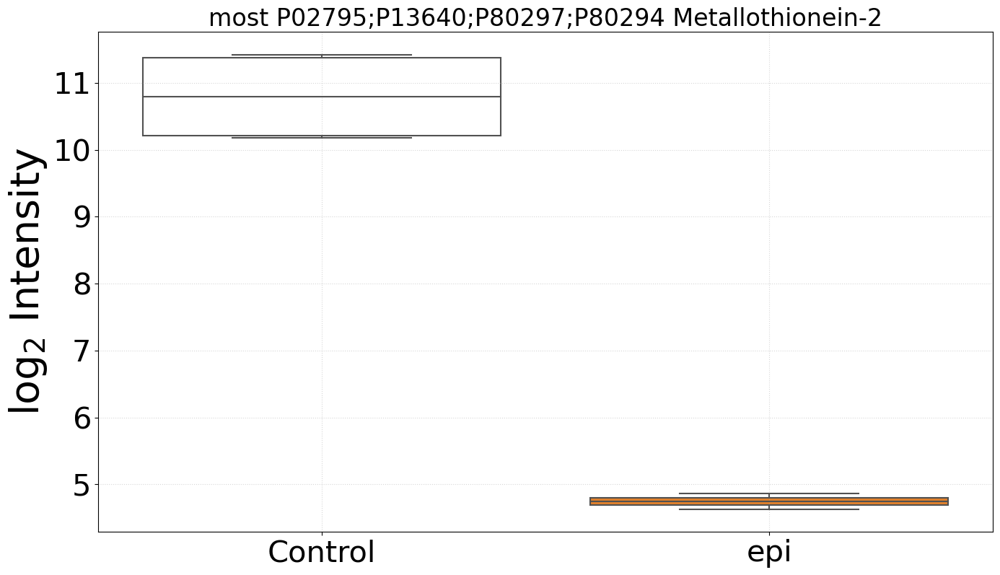

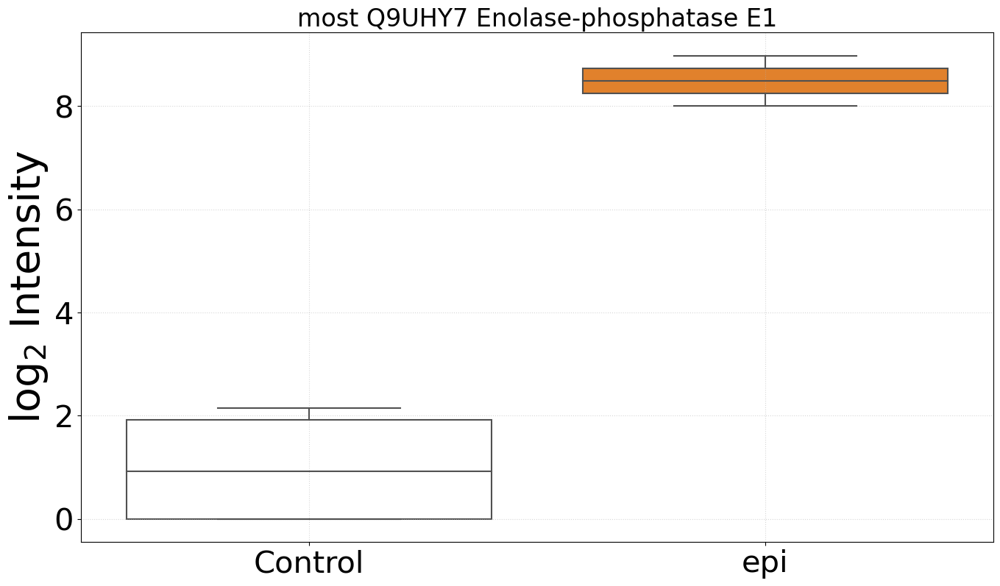

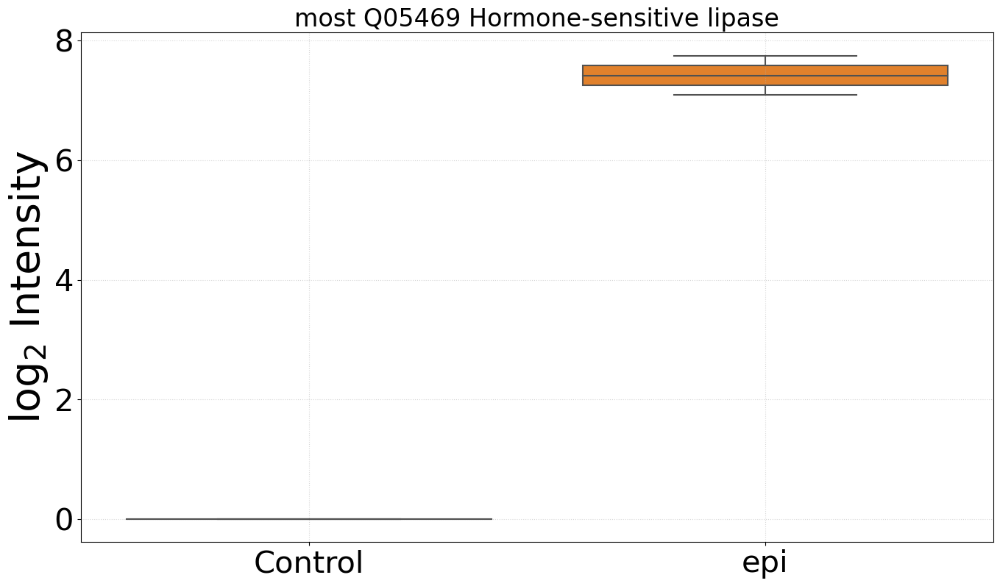

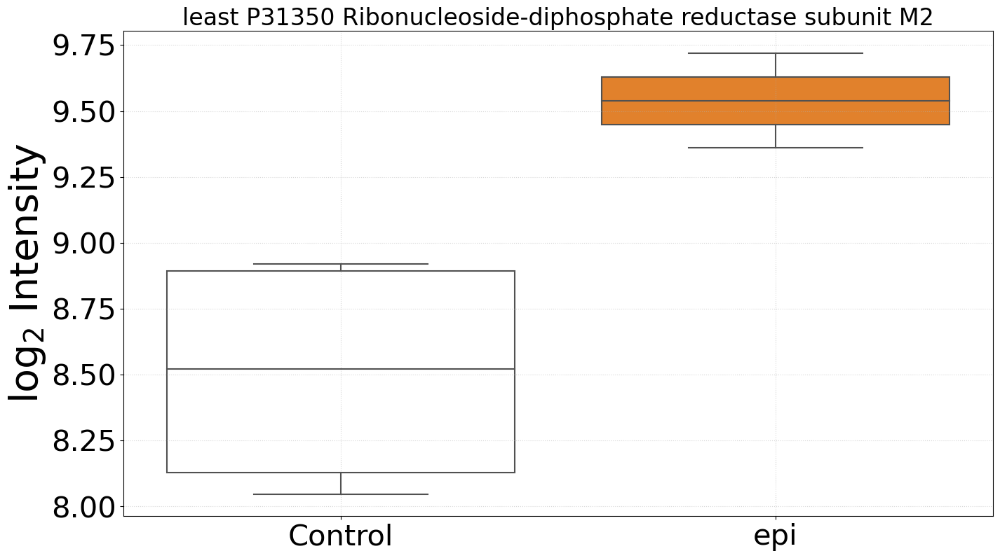

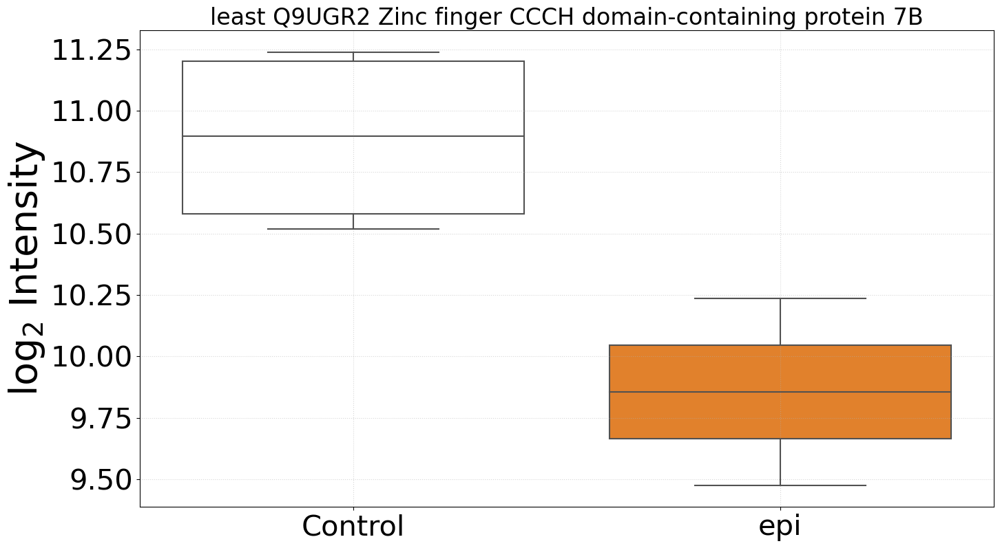

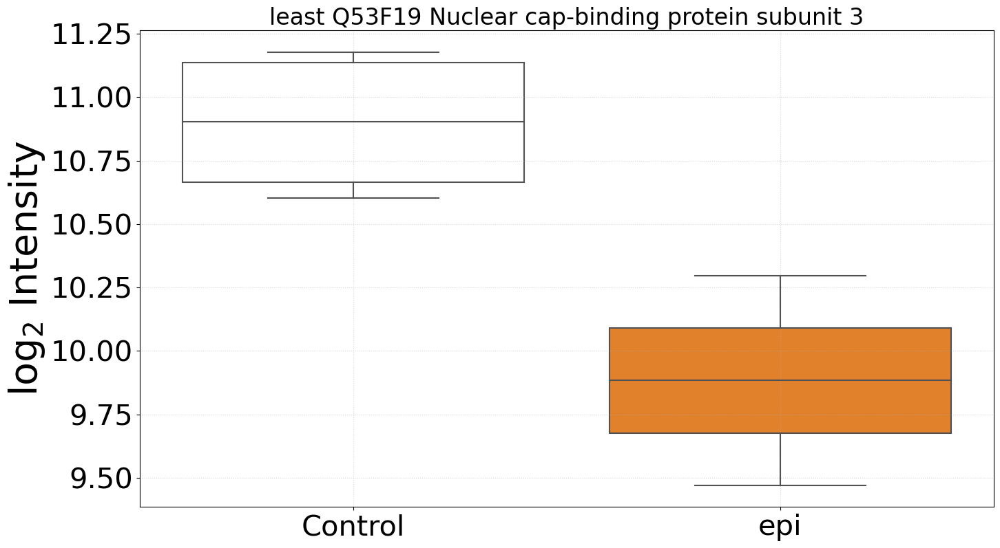

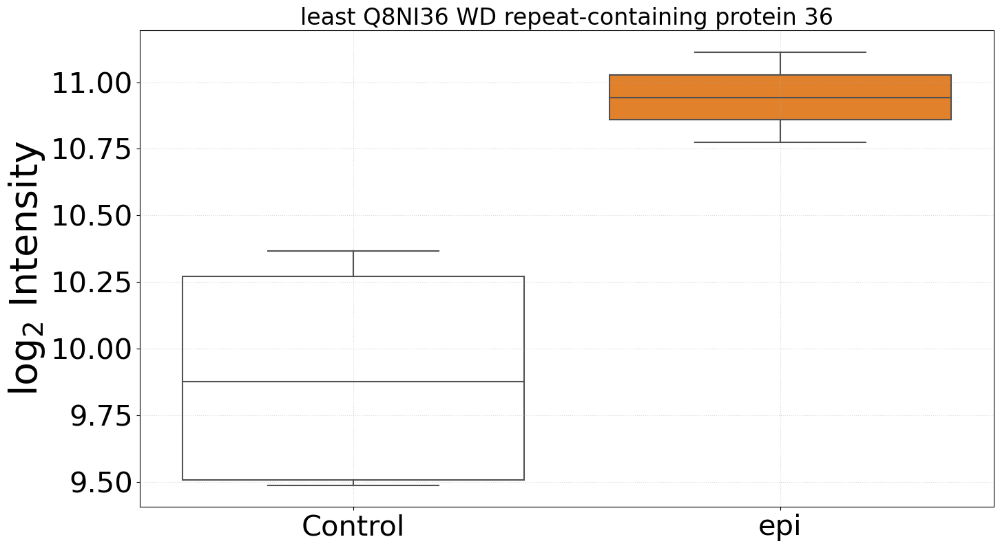

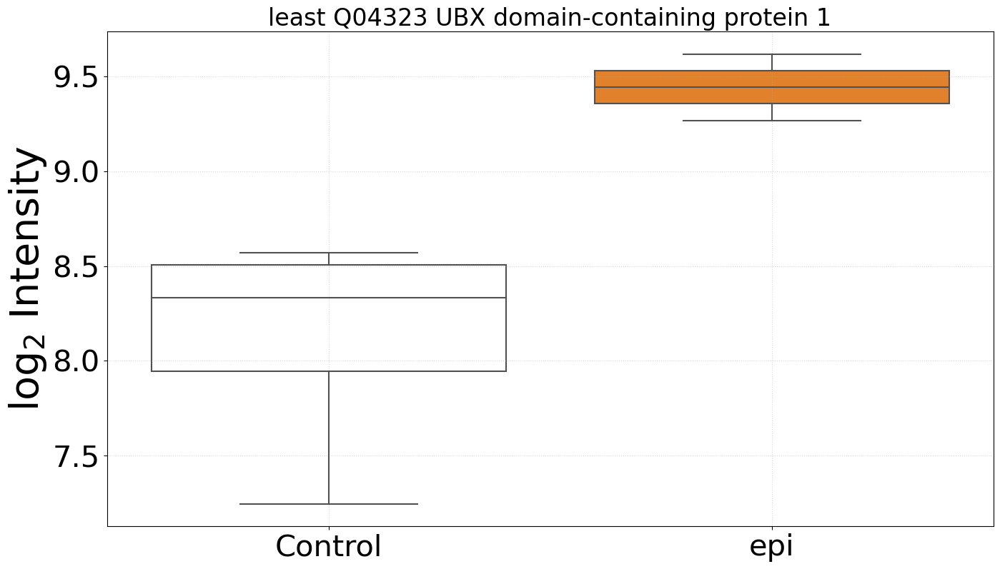

In [45]:
treatment_label = 'epi'
treatment_color = 'tab:orange'
control_samples = ['20220905_ARNAR_' + element for element in ['037', '038', '067', '068']]
treated_samples = ['20220905_ARNAR_' + element for element in ['031', '040']]
epi_response = comparison_function('24h', detected_biomarkers, qndf, treatment_label, treatment_color, control_samples, treated_samples)

P before correction 7.738253979444914e-08 1.0
Benjamini-Hochberg correction
epsilon: 4.061945159406488

BIOMAKER
 P05362 ICAM-1 4 1.0462108497577518 black 

760	P00918	Carbonic anhydrase 2	5.644644869054547	2.7934600717318236

127795	Q8N0U7	Uncharacterized protein C1orf87	1.4692860136148411	1.9384727616701705

9690	Q15386	Ubiquitin-protein ligase E3C	1.0073410090495436	1.4138228477222448

25873	Q9Y3U8	60S ribosomal protein L36	-1.8827691191217593	1.7006499225123273

57600	Q9P278	Folliculin-interacting protein 2	2.135819592554661	1.6873931468913537

26986	P11940;Q4VXU2	Polyadenylate-binding protein 1	-2.178865874612491	1.063184820881915

462	P01008	Antithrombin-III	1.5496040286656498	1.326746552740154

5595	P27361	Mitogen-activated protein kinase 3	-1.0647817009603457	2.176107218143528

163081	Q8N184	Zinc finger protein 567	-1.4987271303963627	2.1575473843989803

10787	Q9Y2A7	Nck-associated protein 1	1.0570885787520403	1.8159734553115736

387694	Q5SQS7	SH2 domain-containing protein 4B	1

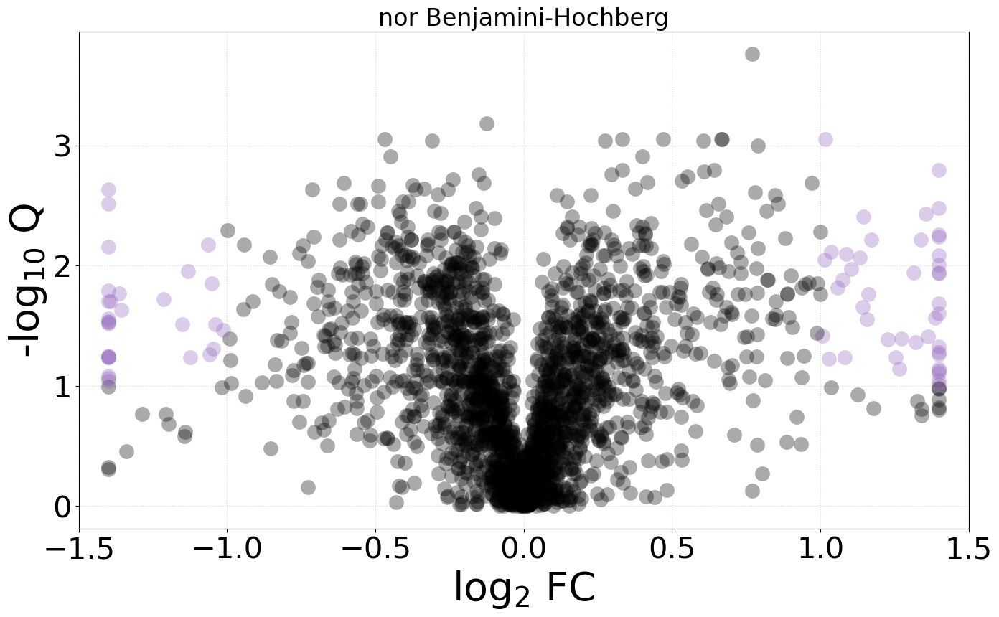

73 proteins respond to treatment


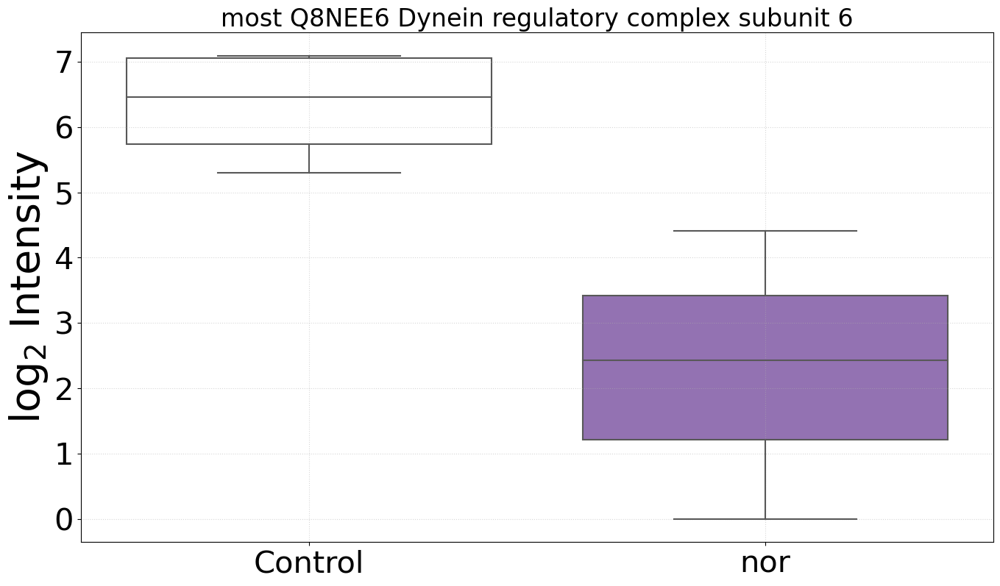

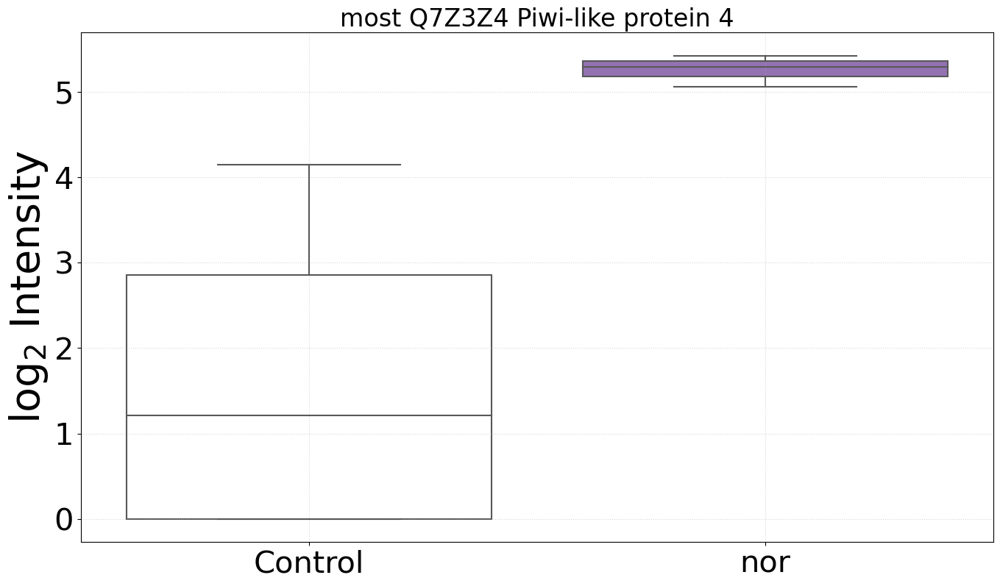

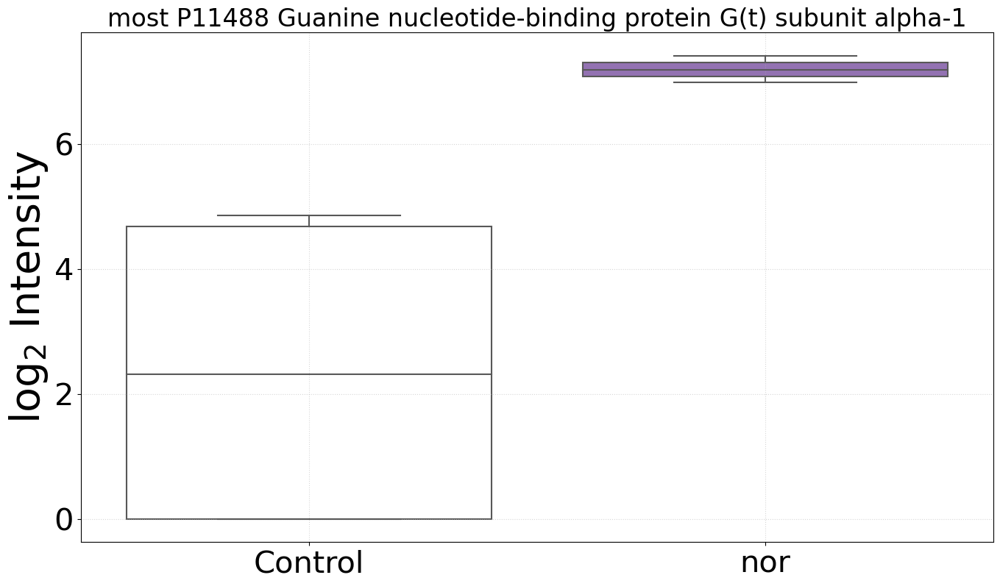

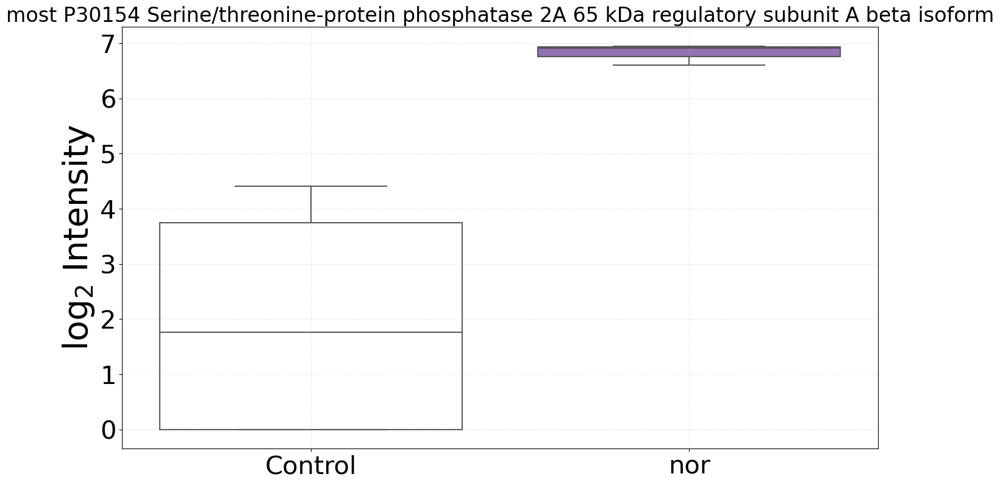

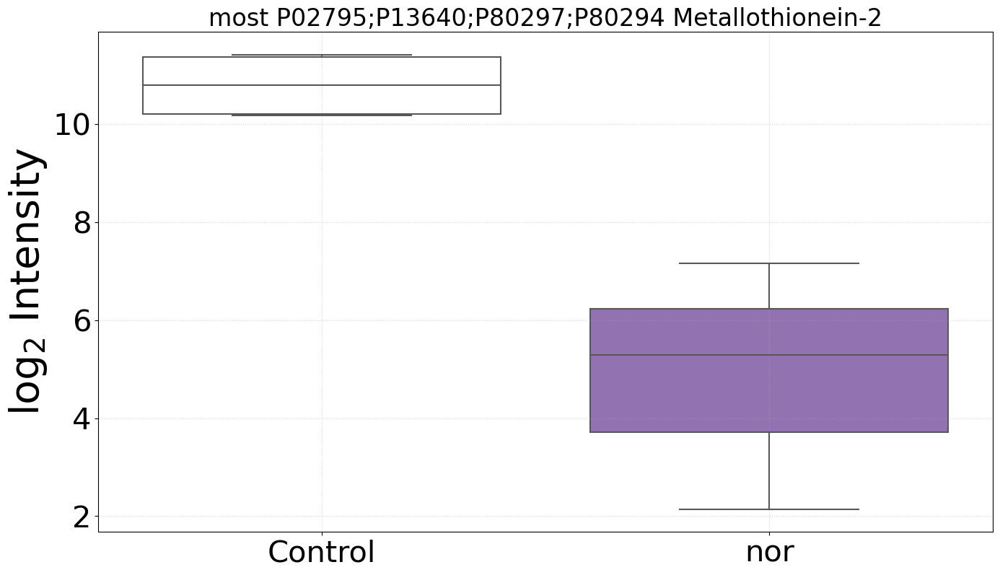

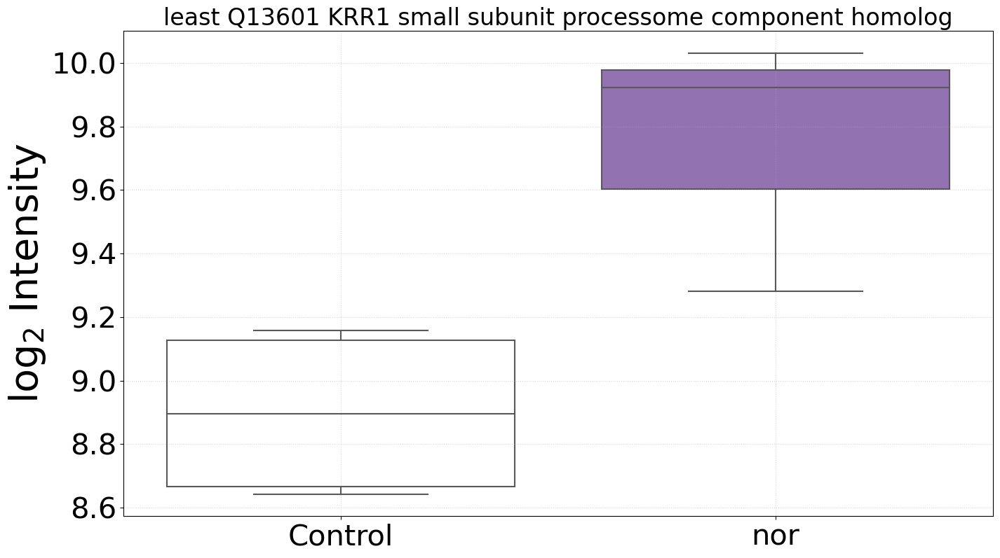

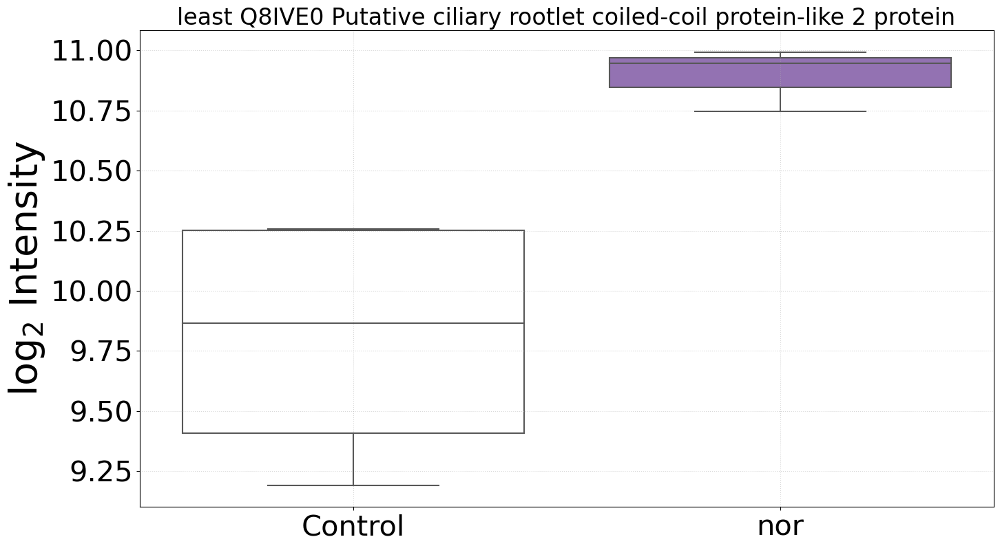

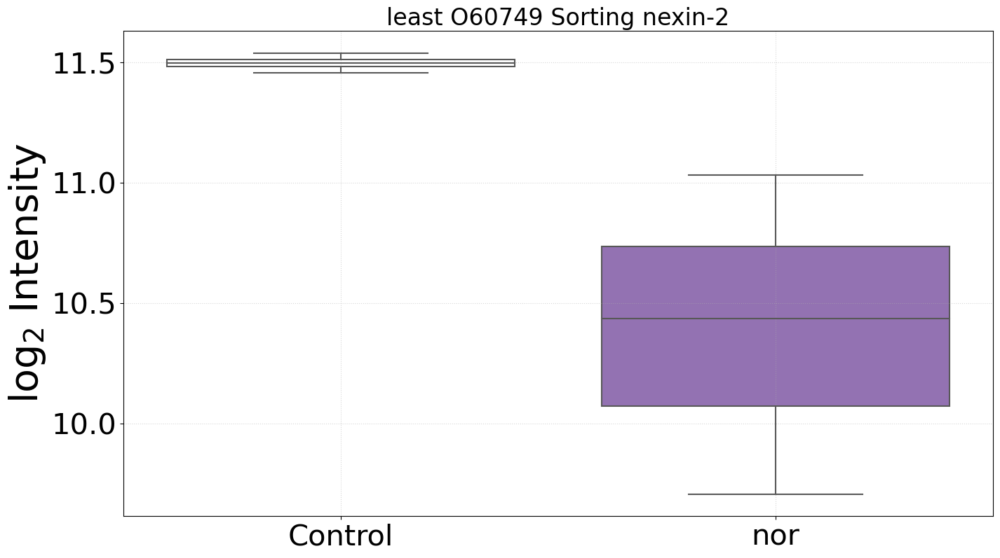

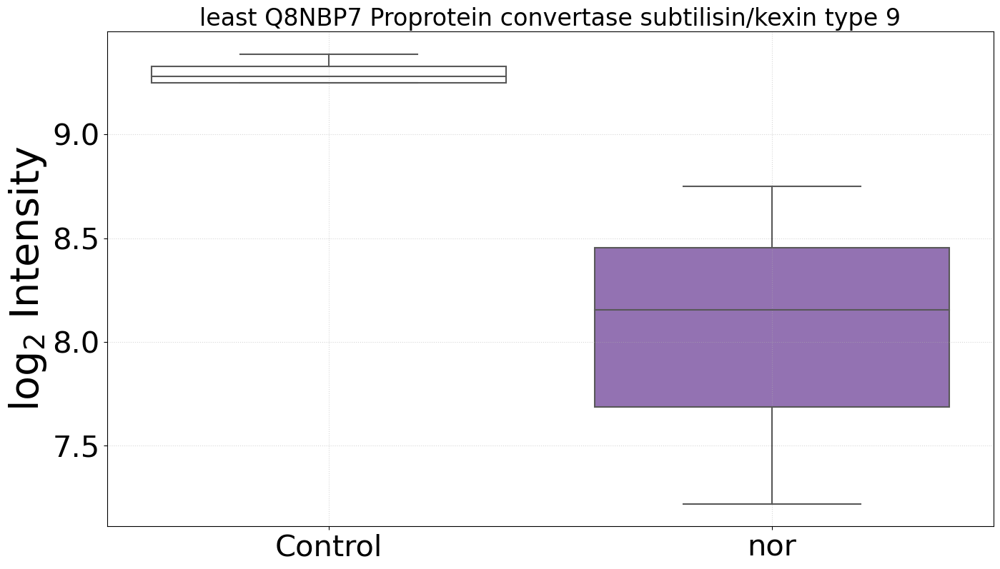

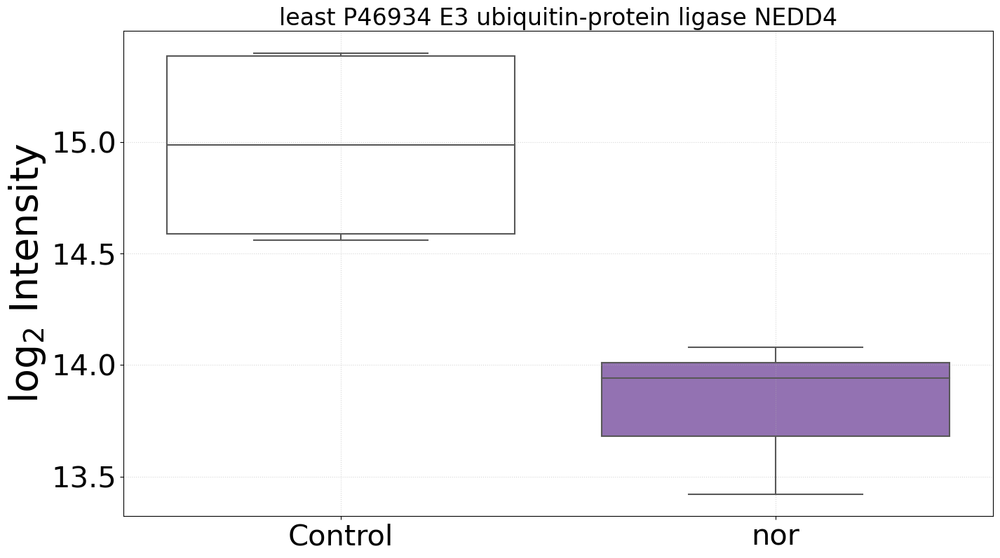

In [46]:
treatment_label = 'nor'
treatment_color = 'tab:purple'
control_samples = ['20220905_ARNAR_' + element for element in ['037', '038', '067', '068']]
treated_samples = ['20220905_ARNAR_' + element for element in ['062', '053', '054']]
nor_response = comparison_function('24h', detected_biomarkers, qndf, treatment_label, treatment_color, control_samples, treated_samples)

P before correction 0.0 1.0
Benjamini-Hochberg correction
epsilon: 4.15341129505082

BIOMAKER
 P05362 ICAM-1 5 0.8873766460886164 black 

760	P00918	Carbonic anhydrase 2	5.498778636791961	2.644763724054967

57600	Q9P278	Folliculin-interacting protein 2	2.3766659117769553	1.5640458487800195

163081	Q8N184	Zinc finger protein 567	-1.7204867754594488	1.3540271978340774

387694	Q5SQS7	SH2 domain-containing protein 4B	1.2742268814900957	1.5206574599431775

55530	Q8N4V2	Synaptic vesicle 2-related protein	-1.3968406063290448	1.2406211150525548

256643	A2AJT9	BCLAF1 and THRAP3 family member 3	1.447367525847615	2.324994902291886

23760	P48739	Phosphatidylinositol transfer protein beta isoform	-1.3136073391895113	1.3854561303760284

6500	P63208	S-phase kinase-associated protein 1	-1.2220193275102398	1.7875359587014172

55835	Q9HC77	Centromere protein J	1.1309968800245613	1.097766788426023

4734	P46934	E3 ubiquitin-protein ligase NEDD4	-1.023152540653859	1.0898782621040572

9717	O43304	SEC14-like

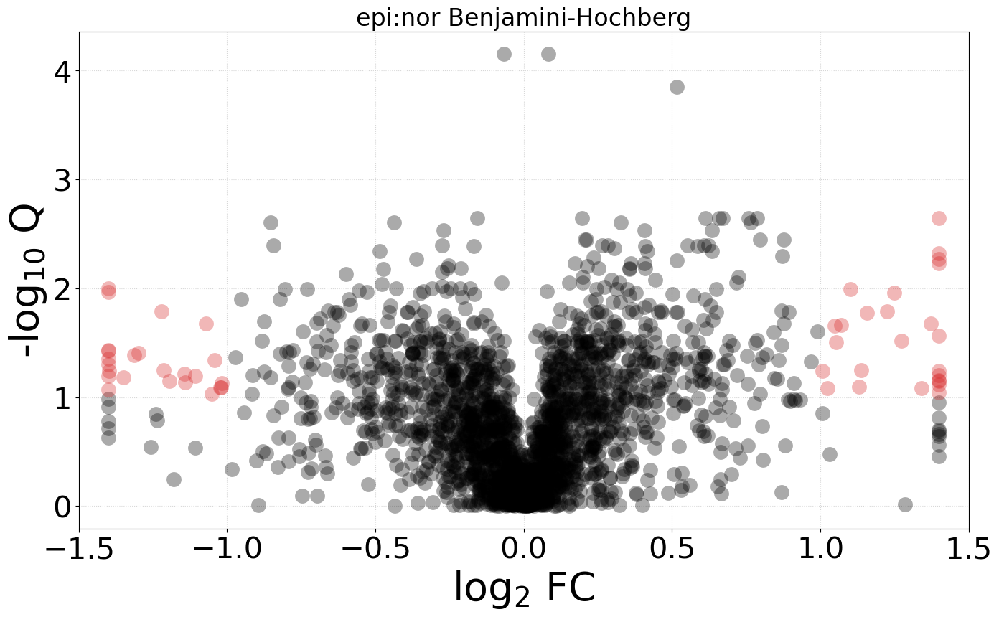

49 proteins respond to treatment


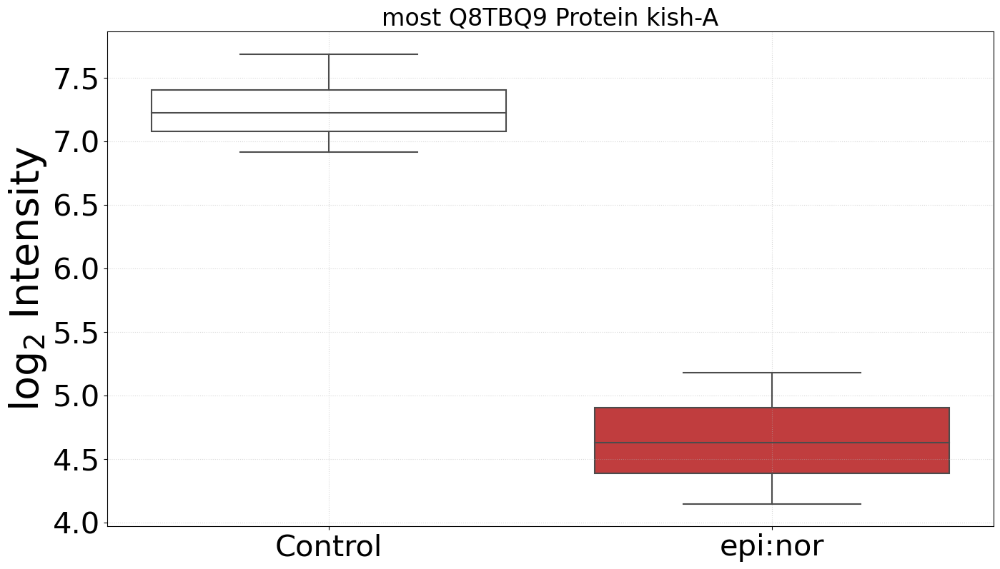

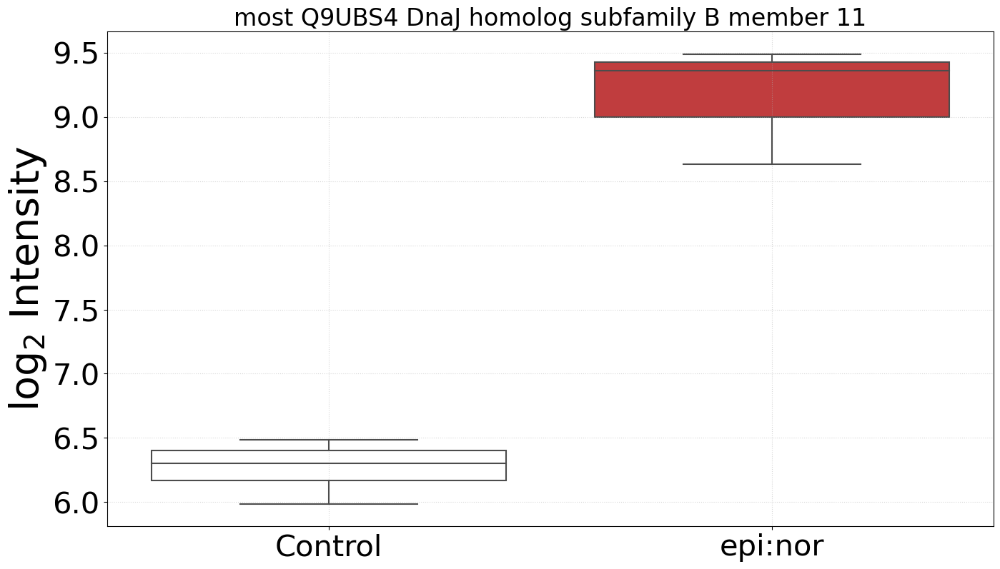

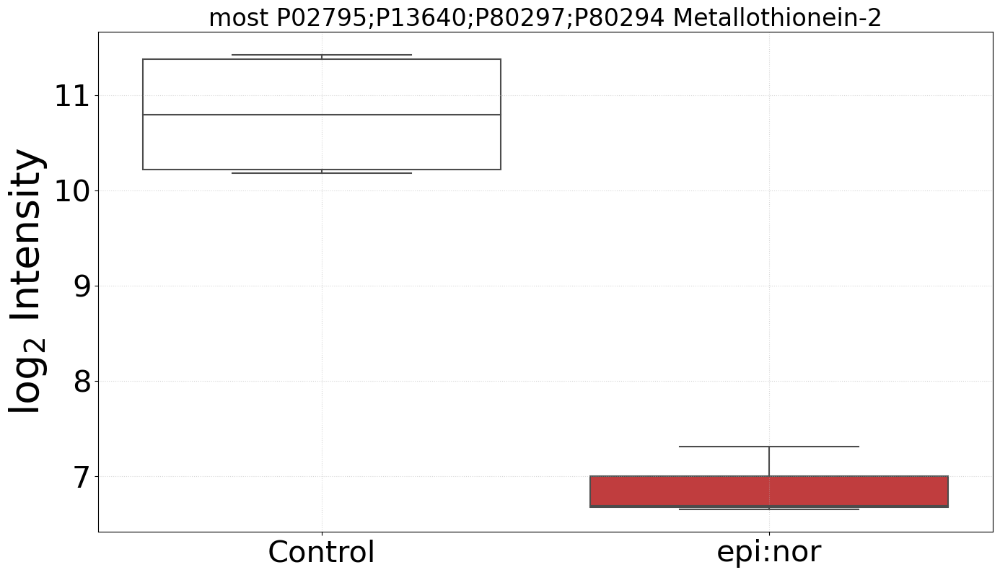

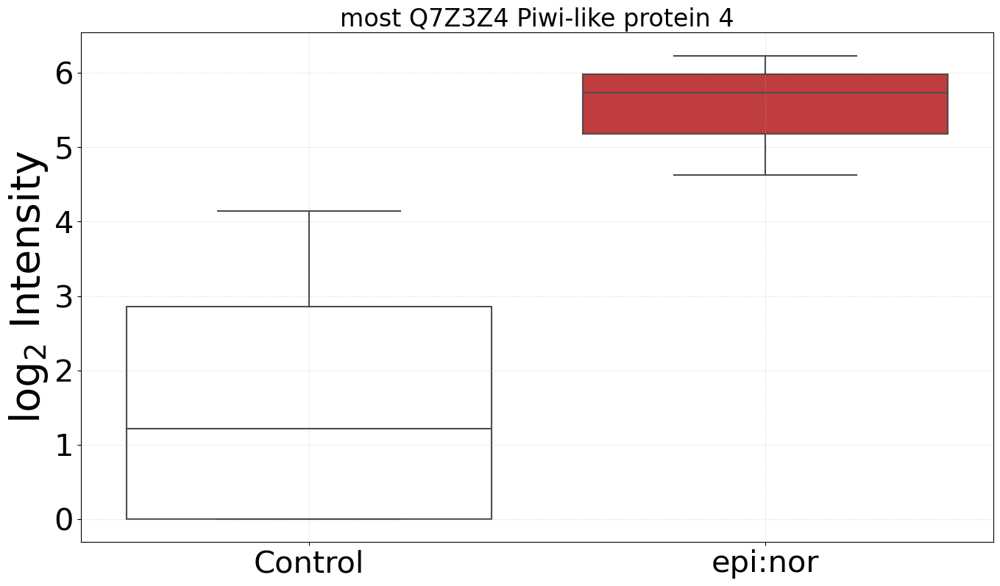

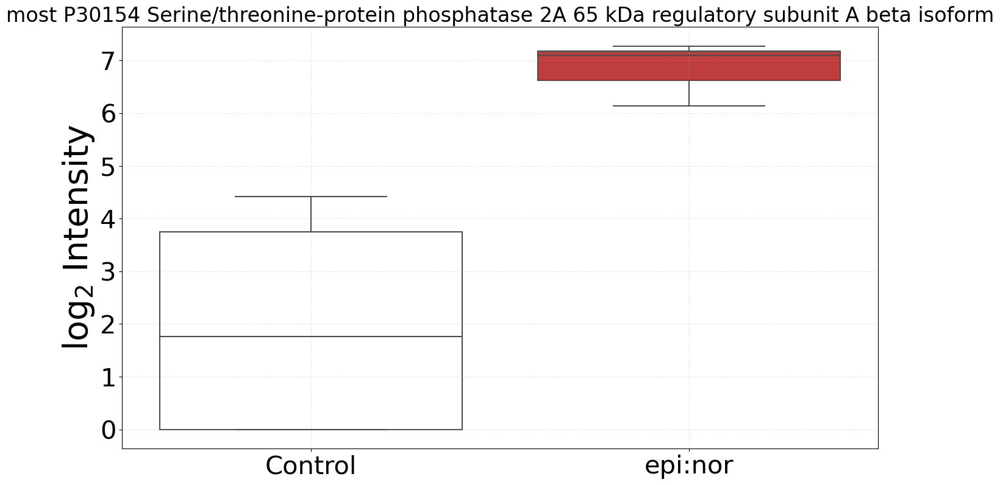

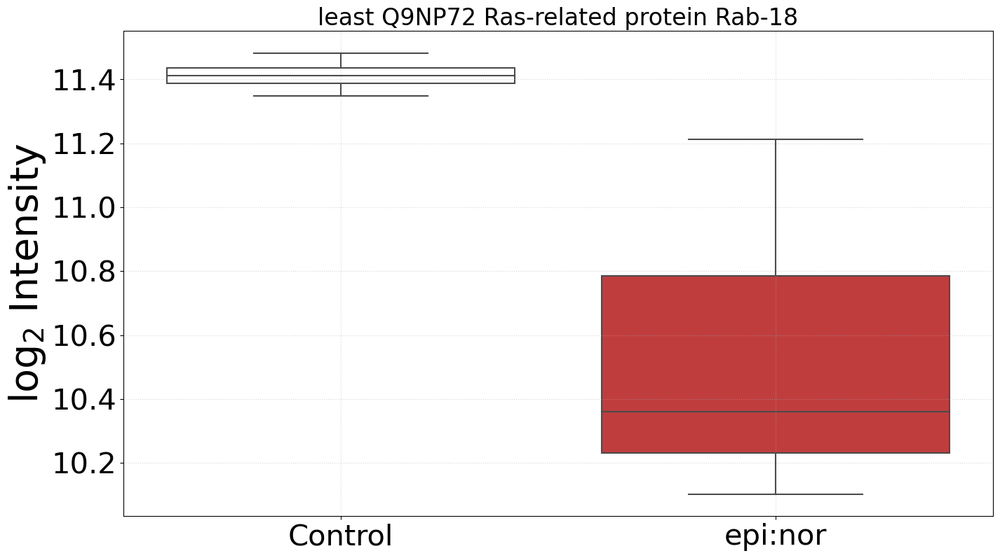

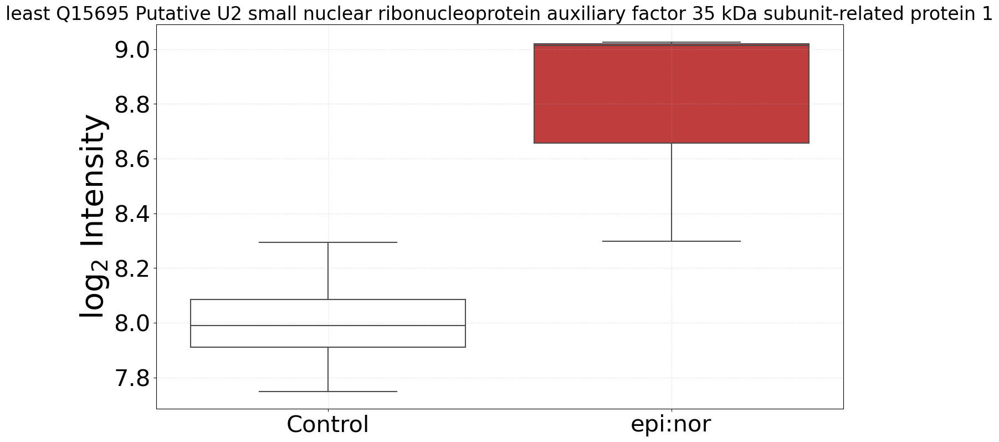

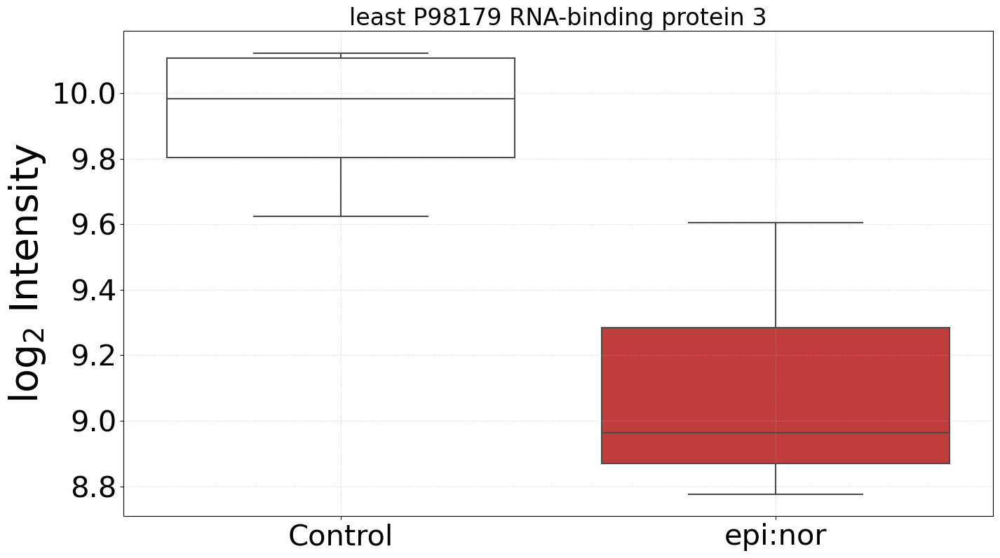

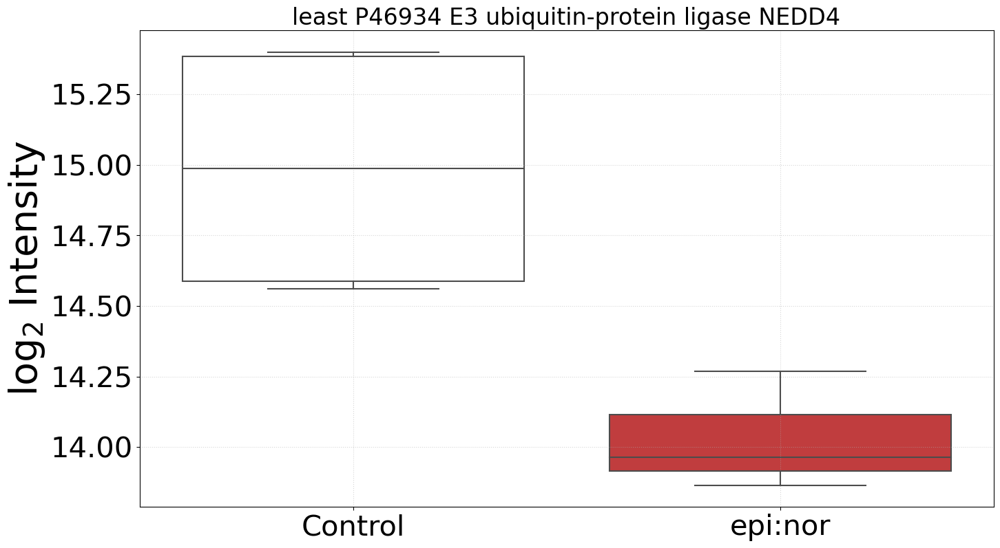

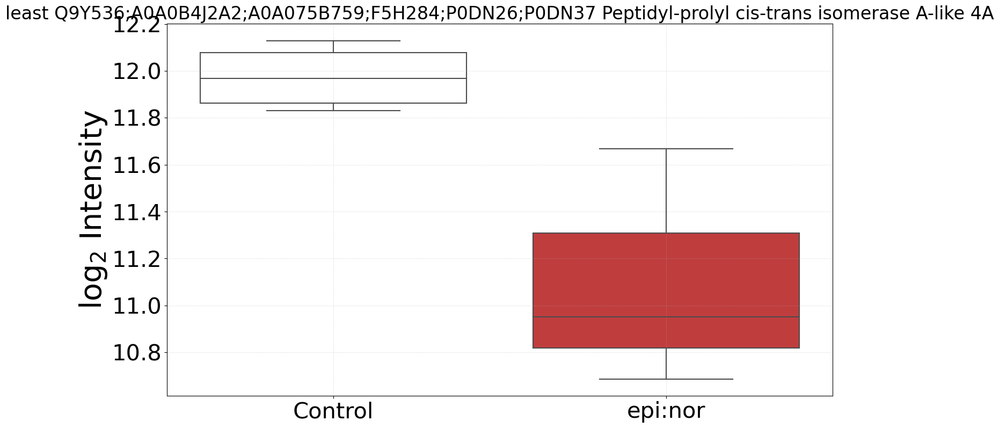

In [47]:
treatment_label = 'epi:nor'
treatment_color = 'tab:red'
control_samples = ['20220905_ARNAR_' + element for element in ['037', '038', '067', '068']]
treated_samples = ['20220905_ARNAR_' + element for element in ['033', '034', '055']]
epinor_response = comparison_function('24h', detected_biomarkers, qndf, treatment_label, treatment_color, control_samples, treated_samples)

P before correction 0.0 1.0
Benjamini-Hochberg correction
epsilon: 5.775428154368396
3383	P05362	Intercellular adhesion molecule 1	3.1236160415365894	4.738456860139816


BIOMAKER
 P05362 ICAM-1 163 4.738456860139816 tab:green 

2202	Q12805	EGF-containing fibulin-like extracellular matrix protein 1	-1.4525705090548797	3.260158672301054

84140	Q3B820	Protein FAM161A	-1.1789304303577524	3.78977011590338

7127	Q03169	Tumor necrosis factor alpha-induced protein 2	3.1103496751794664	3.1042402277128023

6648	P04179	Superoxide dismutase [Mn]_ mitochondrial	1.3577769558709551	3.2023219104765235

2022	P17813	Endoglin	-1.7768921241231945	1.6033141880251096

26986	P11940;Q4VXU2	Polyadenylate-binding protein 1	1.4430040058070333	1.1189211838830309

10787	Q9Y2A7	Nck-associated protein 1	-1.185664511919967	2.4121049525058305

None	Q6DN03	Putative histone H2B type 2-C	-1.0168361619928659	1.984840633855125

345456	P60673	Profilin-3	1.5801323397378537	2.786304368991074

55835	Q9HC77	Centromere protein J

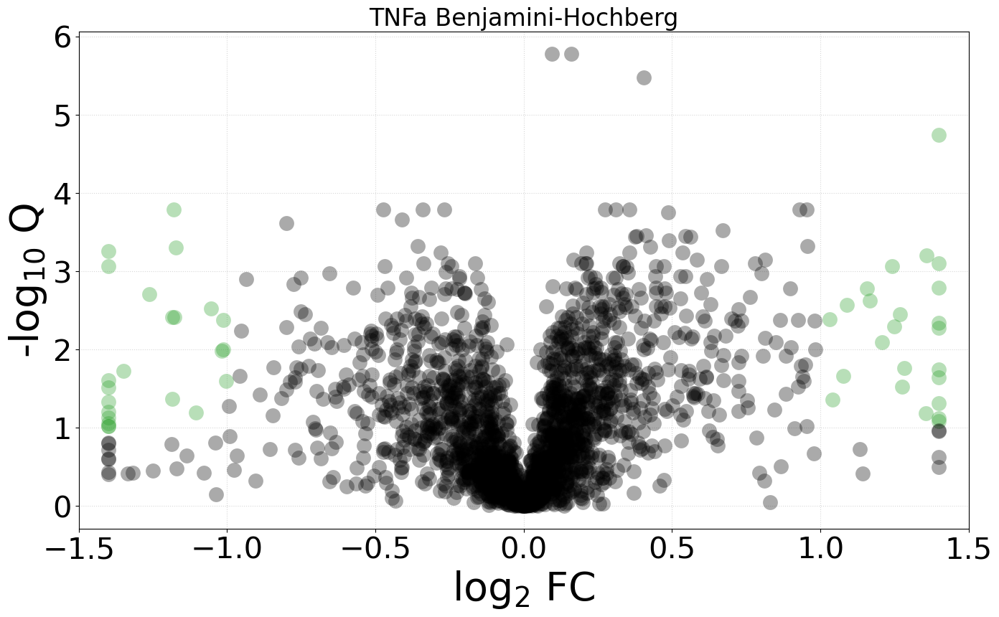

47 proteins respond to treatment


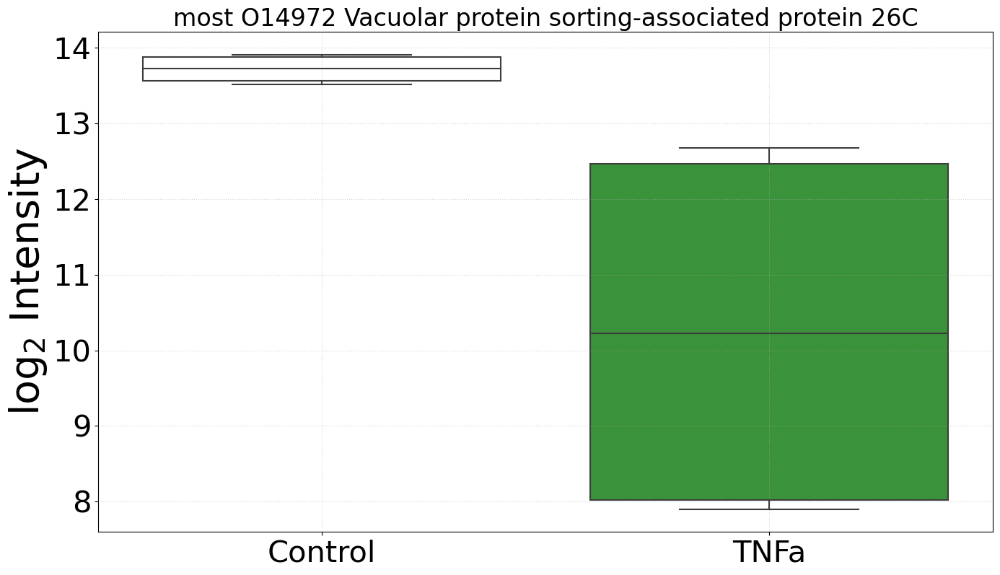

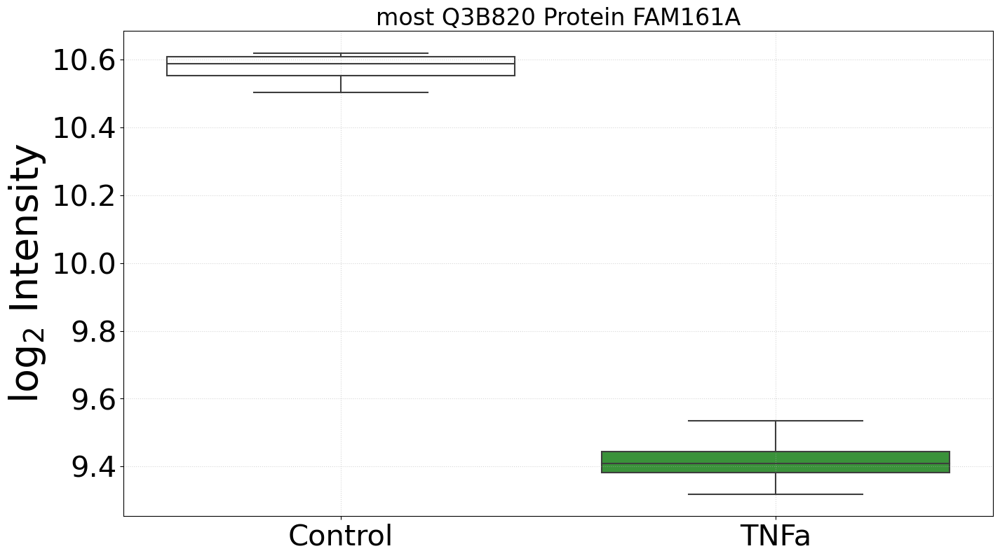

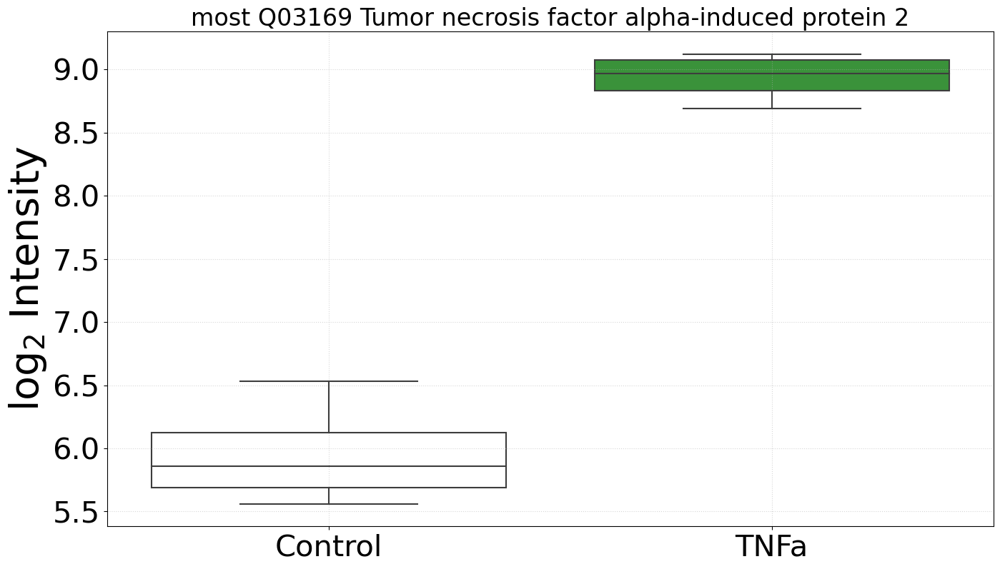

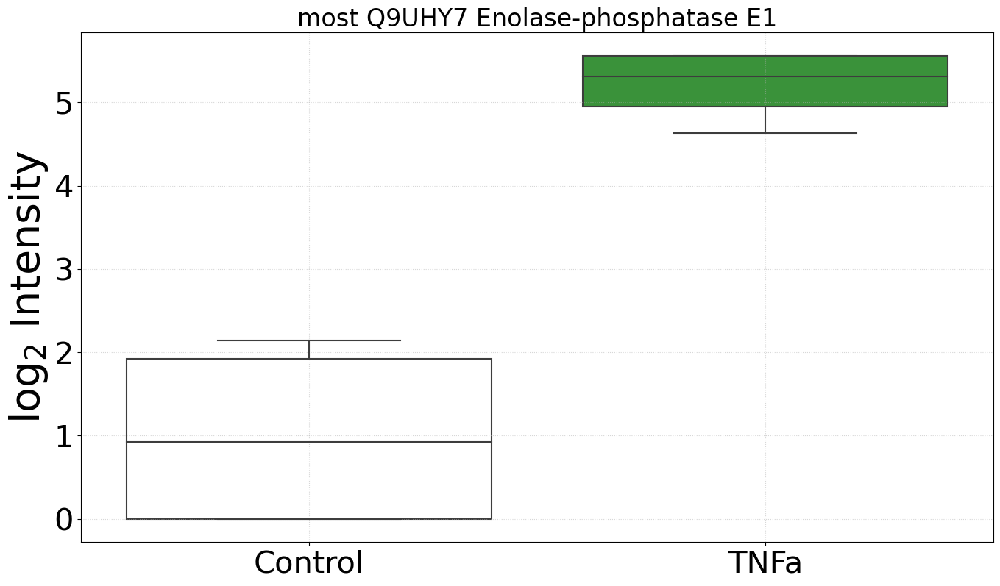

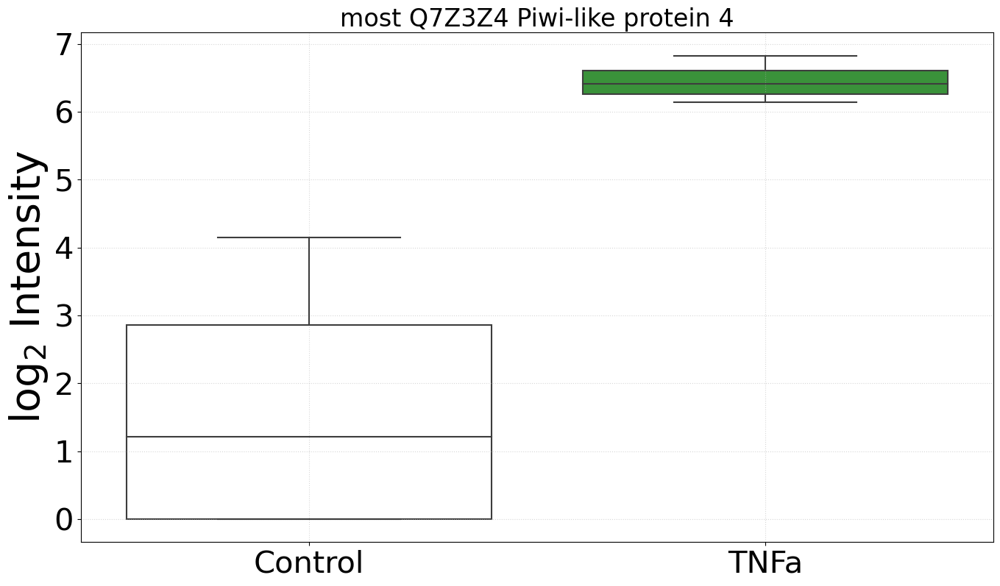

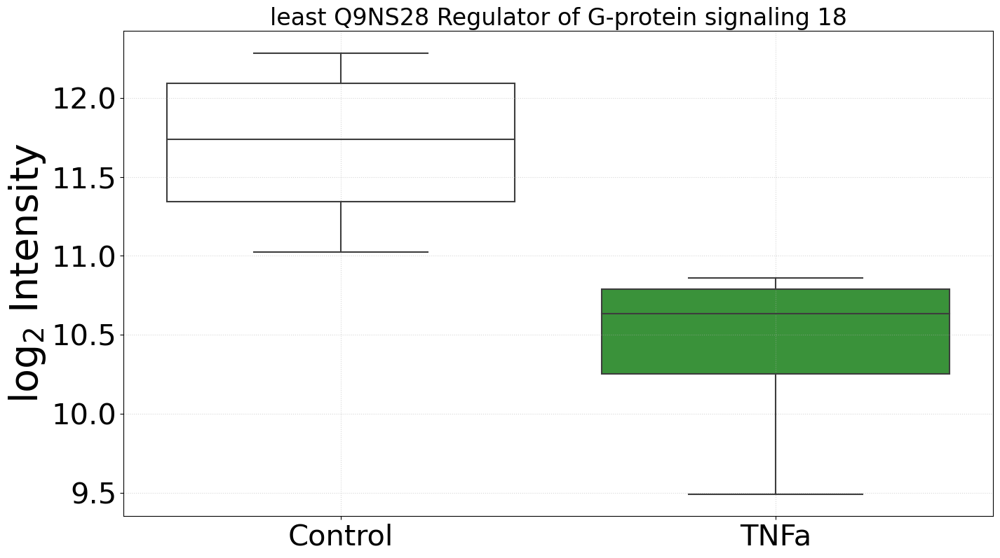

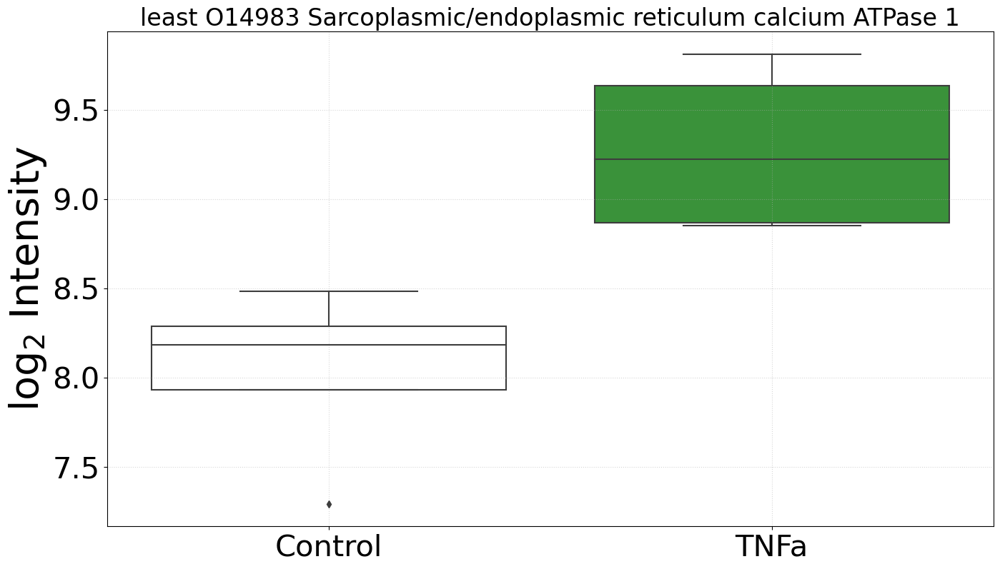

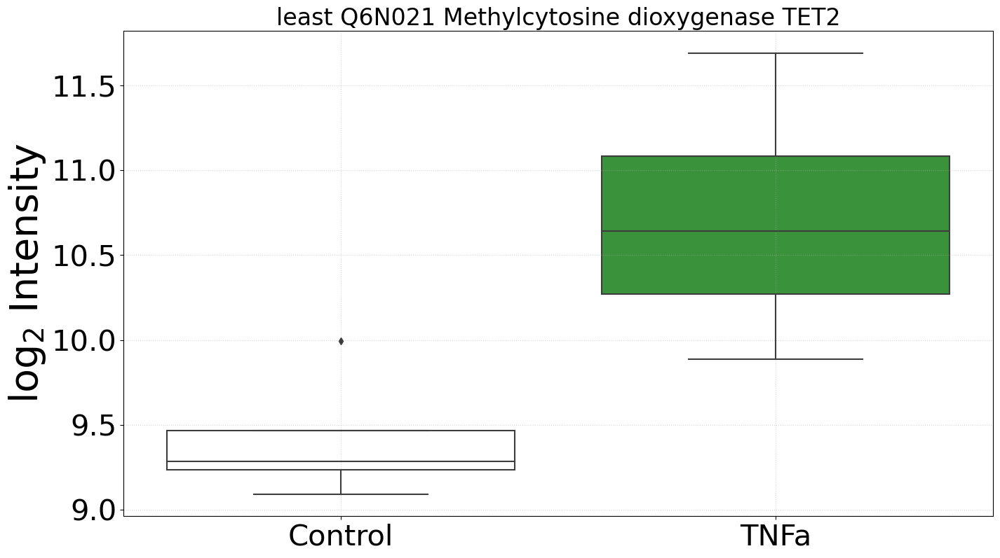

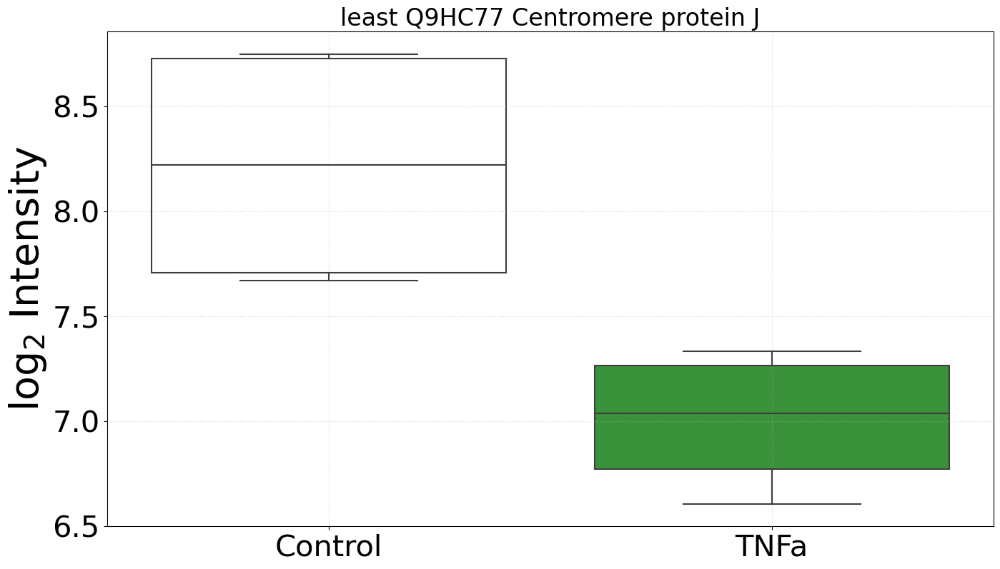

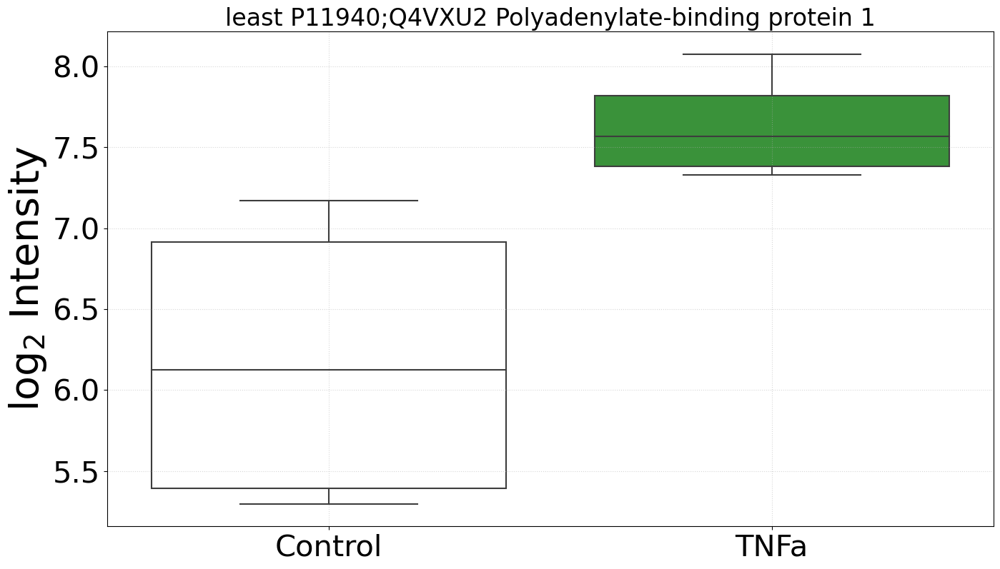

In [48]:
treatment_label = 'TNFa'
treatment_color = 'tab:green'
control_samples = ['20220905_ARNAR_' + element for element in ['037', '038', '067', '068']]
treated_samples = ['20220905_ARNAR_' + element for element in ['017', '018', '015', '016']]
tnfa_response = comparison_function('24h', detected_biomarkers, qndf, treatment_label, treatment_color, control_samples, treated_samples)

### Venn diagram of treatmens

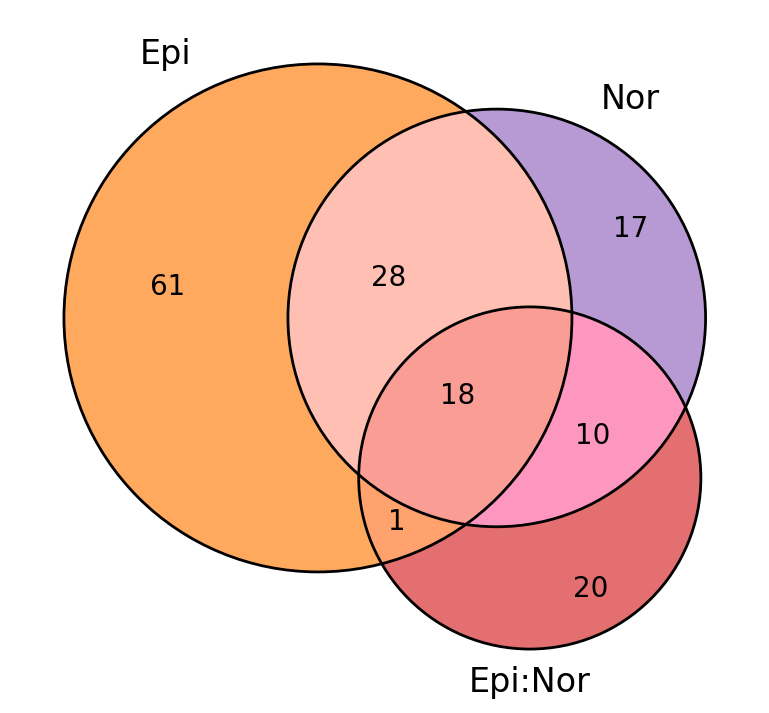

In [49]:
matplotlib_venn.venn3(
    [set(epi_response), set(nor_response), set(epinor_response)], 
    set_labels=('Epi', 'Nor', 'Epi:Nor'),
    set_colors=('tab:orange', 'tab:purple', 'tab:red'),
    alpha=2/3
)
matplotlib_venn.venn3_circles(
    [set(epi_response), set(nor_response), set(epinor_response)],
    linewidth=2
)
matplotlib.pyplot.show()

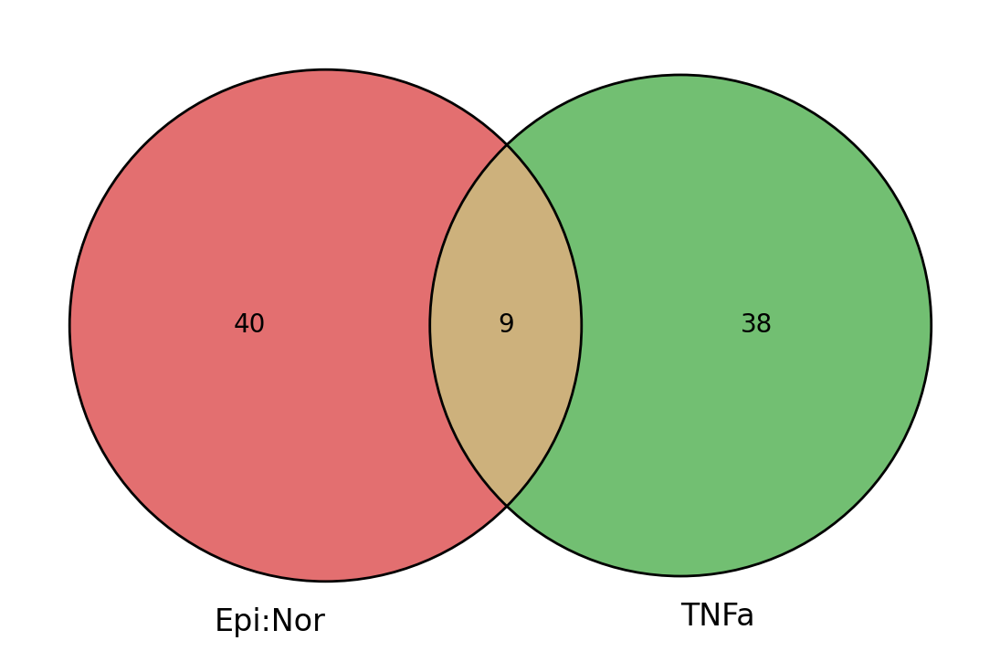

In [50]:
matplotlib_venn.venn2(
    [set(epinor_response), set(tnfa_response)], 
    set_labels=('Epi:Nor', 'TNFa'),
    set_colors=('tab:red', 'tab:green'),
    alpha=2/3
)
matplotlib_venn.venn2_circles(
    [set(epinor_response), set(tnfa_response)],
    linewidth=2
)
matplotlib.pyplot.show()